In [5]:
import pandas as pd
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import copy

# Check current working directory (optional)
print("Current working directory:", os.getcwd())

# Read the CSV file
df = pd.read_csv(r'clean AAC concrete dataset large ratio.csv')

# Remove the row where the "Ref." column equals "[107]"
df = df[df["Ref."] != "[107]"]

# Define original feature columns and target columns
original_feature_cols = [
    "SiO2", "Al2O3", "Fe2O3", "CaO", "MgO", "Na2O", "K2O", "SO3",
    "TiO2", "P2O5", "SrO", "Mn2O3", "MnO", "LOI", 
    "AL/B", "SH/SS", "Ms", "Ag/B", "W/B", "Sp/B",
    "Initial curing time (day)", "Initial curing temp (C)", 
    "Initial curing rest time (day)", "Final curing temp (C)", 
    "Concentration (M) NaOH"
]

target_cols = ["7d CS", "28d CS"]

# Drop unwanted columns: "MnO", "Initial curing time (day)", "Initial curing rest time (day)"
cols_to_drop = ["MnO", "Initial curing time (day)", "Initial curing rest time (day)"]
df = df.drop(columns=cols_to_drop)

# Update the feature columns list accordingly (remove dropped columns)
feature_cols = [
    "SiO2", "Al2O3", "Fe2O3", "CaO", "MgO", "Na2O", "K2O", "SO3",
    "TiO2", "P2O5", "SrO", "Mn2O3", "LOI", 
    "AL/B", "SH/SS", "Ms", "Ag/B", "W/B", "Sp/B",
    "Initial curing temp (C)", "Final curing temp (C)", 
    "Concentration (M) NaOH"
]

# Convert target columns to numeric (replacing empty strings with NaN)
for col in target_cols:
    df[col] = pd.to_numeric(df[col].replace(' ', np.nan), errors='coerce')

# Print missing values in target columns
print("Missing values in target columns:")
print(df[target_cols].isnull().sum())

# Drop rows with missing target values
df_clean = df.dropna(subset=target_cols)
print(f"Dataset shape after dropping rows with missing targets: {df_clean.shape}")

# Fill missing values in specific feature columns using the median
df_clean["Na2O"] = df_clean["Na2O"].fillna(df_clean["Na2O"].median())
df_clean["Concentration (M) NaOH"] = df_clean["Concentration (M) NaOH"].fillna(df_clean["Concentration (M) NaOH"].median())

# Extract feature and target arrays BEFORE scaling
X = df_clean[feature_cols].values
y_7 = df_clean["7d CS"].values
y_28 = df_clean["28d CS"].values

print("X shape:", X.shape)
print("y_7 shape:", y_7.shape)
print("y_28 shape:", y_28.shape)

# Check missing values in the cleaned DataFrame
print("\nMissing values in cleaned DataFrame:")
print(df_clean[feature_cols + target_cols].isnull().sum())

Current working directory: C:\Users\Choi Lin\GP-and-ML-models-new
Missing values in target columns:
7d CS     621
28d CS    667
dtype: int64
Dataset shape after dropping rows with missing targets: (603, 73)
X shape: (603, 22)
y_7 shape: (603,)
y_28 shape: (603,)

Missing values in cleaned DataFrame:
SiO2                       0
Al2O3                      0
Fe2O3                      0
CaO                        0
MgO                        0
Na2O                       0
K2O                        0
SO3                        0
TiO2                       0
P2O5                       0
SrO                        0
Mn2O3                      0
LOI                        0
AL/B                       0
SH/SS                      0
Ms                         0
Ag/B                       0
W/B                        0
Sp/B                       0
Initial curing temp (C)    0
Final curing temp (C)      0
Concentration (M) NaOH     0
7d CS                      0
28d CS                     0
dty

In [6]:
# Step 1: Detect device and split data into training and test sets only
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

X_train, X_test, y7_train, y7_test, y28_train, y28_test = train_test_split(
    X, y_7, y_28,
    test_size=0.20,    # 20% for testing
    random_state=42    # for reproducibility
)

print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")
print(f"y7_train shape: {y7_train.shape}, y7_test shape: {y7_test.shape}")
print(f"y28_train shape: {y28_train.shape}, y28_test shape: {y28_test.shape}")


Using device: cuda
X_train shape: (482, 22), X_test shape: (121, 22)
y7_train shape: (482,), y7_test shape: (121,)
y28_train shape: (482,), y28_test shape: (121,)


In [7]:
# Step 2: Fit StandardScaler on training features only
feature_scaler = StandardScaler()
X_train_scaled = feature_scaler.fit_transform(X_train)

print("\nFeature scaling on training data complete.")
print("  Scaled train mean (≈0):", np.mean(X_train_scaled))
print("  Scaled train std  (≈1):", np.std(X_train_scaled))



Feature scaling on training data complete.
  Scaled train mean (≈0): 4.020422873029613e-18
  Scaled train std  (≈1): 1.0000000000000002


In [8]:
import torch

print("PyTorch version:", torch.__version__)
print("Is CUDA available? ", torch.cuda.is_available())

if torch.cuda.is_available():
    print("Number of GPUs:", torch.cuda.device_count())
    print("GPU name:", torch.cuda.get_device_name(0))
else:
    print("No GPU detected by PyTorch.")


PyTorch version: 2.5.1+cu121
Is CUDA available?  True
Number of GPUs: 1
GPU name: NVIDIA GeForce RTX 2060


In [9]:
# Step 3: Create a max‐value scaler for targets
def max_strength_scaler(y7, y28, max_strength=100.0):
    """
    Scale 7d and 28d compressive strengths by a fixed maximum value.
    Returns:
      y7_scaled:  np.array, scaled 7d strengths
      y28_scaled: np.array, scaled 28d strengths
      scaler:     object with inverse_transform(y) -> unscaled y
    """
    y7_scaled  = y7 / max_strength
    y28_scaled = y28 / max_strength

    class MaxScaler:
        def __init__(self, max_val):
            self.max_val = max_val
        def inverse_transform(self, y):
            # y can be 1d or 2d
            return y * self.max_val

    return y7_scaled, y28_scaled, MaxScaler(max_strength)

# Example usage on training targets:
y7_train_scaled, y28_train_scaled, target_scaler = max_strength_scaler(y7_train, y28_train)

print("First 5 scaled y7 values:", y7_train_scaled[:5])
print("First 5 scaled y28 values:", y28_train_scaled[:5])


First 5 scaled y7 values: [0.2      0.217029 0.168283 0.351    0.126512]
First 5 scaled y28 values: [0.2632    0.376314  0.24717   0.367     0.2120928]


In [10]:
print("X_train_scaled shape:", X_train_scaled.shape)
print("X_test shape (unscaled):", X_test.shape)

print("y7_train_scaled shape:", y7_train_scaled.shape)
print("y28_train_scaled shape:", y28_train_scaled.shape)

X_train_scaled shape: (482, 22)
X_test shape (unscaled): (121, 22)
y7_train_scaled shape: (482,)
y28_train_scaled shape: (482,)


In [11]:
X_test_scaled  = feature_scaler.transform(X_test)
y7_test_scaled  = y7_test / target_scaler.max_val
y28_test_scaled = y28_test / target_scaler.max_val

print("\nAfter scaling test data:")
print("X_test_scaled shape:", X_test_scaled.shape)
print("y7_test_scaled shape:", y7_test_scaled.shape)
print("y28_test_scaled shape:", y28_test_scaled.shape)



After scaling test data:
X_test_scaled shape: (121, 22)
y7_test_scaled shape: (121,)
y28_test_scaled shape: (121,)


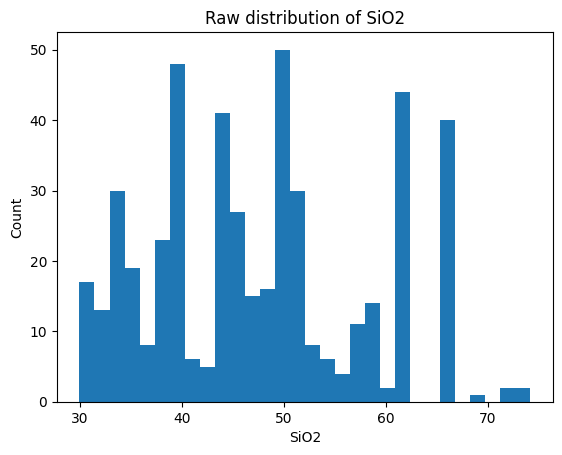

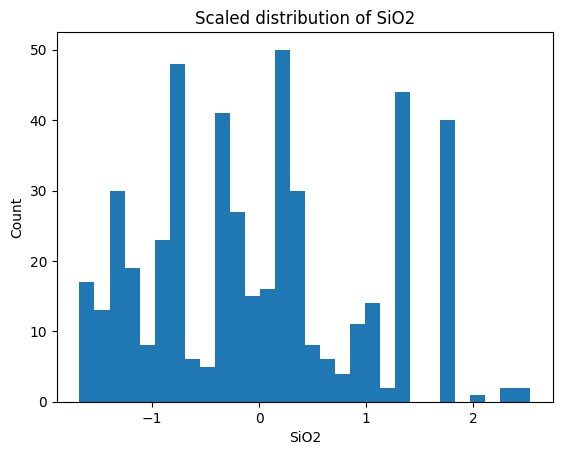

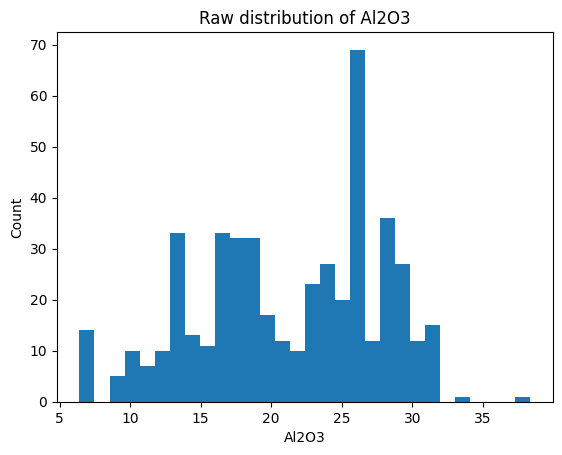

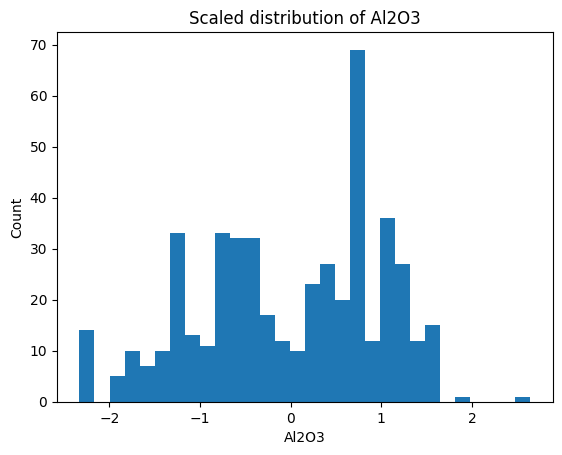

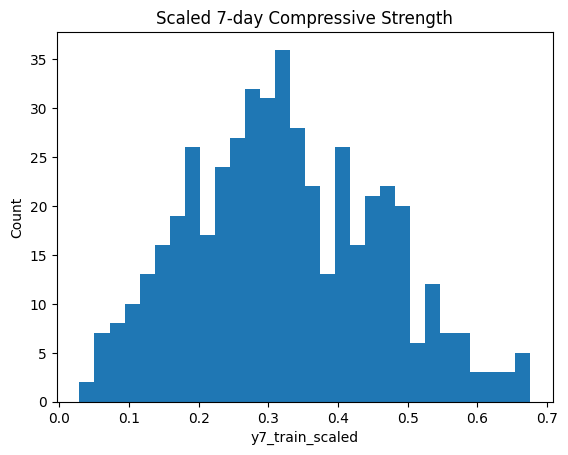

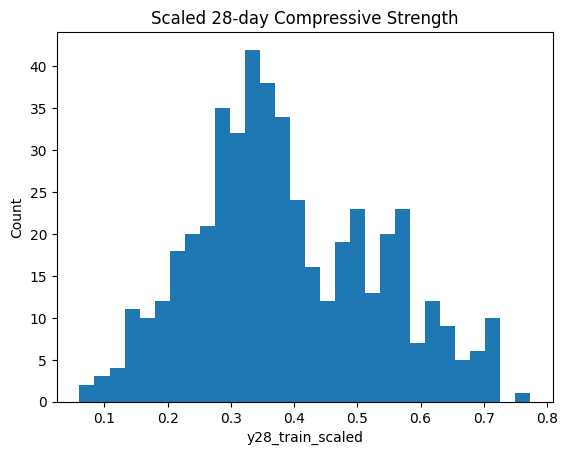

In [12]:
import matplotlib.pyplot as plt

for idx in [0, 1]:
    plt.figure()
    plt.hist(X_train[:, idx], bins=30)
    plt.title(f"Raw distribution of {feature_cols[idx]}")
    plt.xlabel(feature_cols[idx])
    plt.ylabel("Count")
    plt.show()

    plt.figure()
    plt.hist(X_train_scaled[:, idx], bins=30)
    plt.title(f"Scaled distribution of {feature_cols[idx]}")
    plt.xlabel(feature_cols[idx])
    plt.ylabel("Count")
    plt.show()

# 3) Plot scaled targets
plt.figure()
plt.hist(y7_train_scaled, bins=30)
plt.title("Scaled 7-day Compressive Strength")
plt.xlabel("y7_train_scaled")
plt.ylabel("Count")
plt.show()

plt.figure()
plt.hist(y28_train_scaled, bins=30)
plt.title("Scaled 28-day Compressive Strength")
plt.xlabel("y28_train_scaled")
plt.ylabel("Count")
plt.show()


In [13]:
class ConcreteDatasetScaled(Dataset):
    def __init__(self, features, y_7_scaled, y_28_scaled):
        self.z = torch.tensor(features, dtype=torch.float32)
        self.y = torch.tensor(np.vstack((y_7_scaled, y_28_scaled)).T, dtype=torch.float32)
        self.t = torch.tensor([7.0, 28.0], dtype=torch.float32)
    
    def __len__(self):
        return self.z.shape[0]
    
    def __getitem__(self, idx):
        return self.z[idx], self.t, self.y[idx]


In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class AGPModelGP_v2(nn.Module):
    """
    Amortised GP v2:
    - Input: feature vector x of dimension `input_dim`
    - Outputs: GP kernel hyperparameters (θ1, θ2, ℓ, σ_f, σ_n)
    """
    def __init__(self, input_dim, hidden_dims=[128, 64, 32], dropout_rate=0.1):
        super(AGPModelGP_v2, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dims[0])
        self.bn1 = nn.BatchNorm1d(hidden_dims[0])  
        self.fc2 = nn.Linear(hidden_dims[0], hidden_dims[1])
        self.bn2 = nn.BatchNorm1d(hidden_dims[1])  
        self.fc3 = nn.Linear(hidden_dims[1], hidden_dims[2])
        self.bn3 = nn.BatchNorm1d(hidden_dims[2])
        self.dropout = nn.Dropout(dropout_rate)
        self.fc4 = nn.Linear(hidden_dims[2], 5)
        self.softplus = nn.Softplus()

    def forward(self, x):
        """
        x: (batch_size, input_dim)
        returns:
          theta1: (batch_size,) positive transform via Softplus
          theta2: (batch_size,) unconstrained real
          l:      (batch_size,) positive via exp
          sigma_f:(batch_size,) positive via exp
          sigma_n:(batch_size,) positive via exp
        """
        x = F.relu(self.bn1(self.fc1(x)))
        x = self.dropout(x) 
        x = F.relu(self.bn2(self.fc2(x)))
        x = self.dropout(x)   
        x = F.relu(self.bn3(self.fc3(x)))
        x = self.dropout(x)  
        out = self.fc4(x)
        theta1  = self.softplus(out[:, 0])
        theta2  = out[:, 1]
        l       = torch.exp(out[:, 2])
        sigma_f = torch.exp(out[:, 3])
        sigma_n = torch.exp(out[:, 4])
        
        return theta1, theta2, l, sigma_f, sigma_n


In [15]:
import torch
import numpy as np

def gp_neg_log_likelihood(theta1, theta2, l, sigma_f, sigma_n, t, y, epsilon=1e-6):
    """
    Compute the average negative log‐likelihood of a GP with
    mean m(t)=θ1·log(t+ε)+θ2 and RBF kernel k(t,t')=σ_f^2 exp(−(t−t')²/(2ℓ²)),
    plus noise variance σ_n^2.
    
    Args:
        theta1, theta2, l, sigma_f, sigma_n: tensors of shape (batch,)
        t:             tensor of shape (n_t,)  — time points (e.g. [7.,28.])
        y:             tensor of shape (batch, n_t) — observed targets
        epsilon:       small jitter to stabilize log and Cholesky
    Returns:
        avg_nll:       scalar tensor, average NLL over the batch
    """
    batch_size, n_t = y.shape
    total_nll = 0.0
    log_t = torch.log(t + epsilon)
    
    diff = t.unsqueeze(0) - t.unsqueeze(1)  
    
    for i in range(batch_size):
        m_i = theta1[i] * log_t + theta2[i]
        
        # Covariance matrix K_i: shape (n_t, n_t)
        K = sigma_f[i]**2 * torch.exp(-0.5 * (diff**2) / (l[i]**2))
        K = K + (sigma_n[i]**2 + epsilon) * torch.eye(n_t, device=K.device)
        
        # Cholesky factor L: K = L Lᵀ
        L = torch.linalg.cholesky(K)
        
        # Compute α = K^{-1}(y_i − m_i)
        resid = (y[i] - m_i).unsqueeze(1)            # (n_t,1)
        alpha = torch.cholesky_solve(resid, L)      # (n_t,1)
        
        # Log-determinant of K: log|K| = 2 ∑ log diag(L)
        log_det = 2.0 * torch.sum(torch.log(torch.diag(L)))
        
        # NLL for this sample
        nll_i = 0.5 * (resid.t() @ alpha) + 0.5 * log_det + 0.5 * n_t * np.log(2 * np.pi)
        total_nll += nll_i.squeeze()
    
    # Return mean over batch
    return total_nll / batch_size


In [16]:
def train_agp_model(model, train_loader, t, optimizer, num_epochs=300):
    model.train() #dropout active
    loss_history = []

    for epoch in range(1, num_epochs + 1):
        total_loss = 0.0
        for z, _, y in train_loader:
            z, y = z.to(device), y.to(device)
            optimizer.zero_grad()
            theta1, theta2, l, sigma_f, sigma_n = model(z)
            loss = gp_neg_log_likelihood(theta1, theta2, l, sigma_f, sigma_n, t.to(device), y)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        avg_loss = total_loss / len(train_loader)
        loss_history.append(avg_loss)

        if epoch == 1 or epoch % 50 == 0:
            print(f"Epoch {epoch}/{num_epochs}, Training NLL Loss: {avg_loss:.4f}")

    return model, loss_history

In [17]:
def gp_posterior_mean_var_split(
    theta1, theta2, l, sigma_f, sigma_n,
    t_train, y_train, t_pred, epsilon=1e-6
):
    log_t_train = torch.log(t_train + epsilon)
    log_t_pred  = torch.log(t_pred  + epsilon)

    m_train = theta1 * log_t_train + theta2
    m_pred  = theta1 * log_t_pred  + theta2

    diff_tt = t_train.unsqueeze(0) - t_train.unsqueeze(1)
    K = sigma_f**2 * torch.exp(-0.5 * diff_tt**2 / l**2)
    K += (sigma_n**2 + epsilon) * torch.eye(t_train.numel(), device=K.device)

    L = torch.linalg.cholesky(K)
    alpha = torch.cholesky_solve((y_train - m_train).unsqueeze(1), L)

    diff_tp = t_train.unsqueeze(1) - t_pred.unsqueeze(0)
    k_star  = sigma_f**2 * torch.exp(-0.5 * diff_tp**2 / l**2)

    mean_pred = m_pred + (k_star.t() @ alpha).squeeze(1)

    v         = torch.linalg.solve_triangular(L, k_star, upper=False)
    var_proc  = sigma_f**2 - (v * v).sum(dim=0)          # posterior process variance
    var_noise = sigma_n**2                               # noise variance  (scalar)
    var_noise = var_noise.expand_as(var_proc)            # align shape
    return mean_pred, var_proc, var_noise



In [18]:
import torch
import numpy as np

def gp_posterior_mean_var(
    theta1, theta2, l, sigma_f, sigma_n,
    t_train, y_train, t_pred, epsilon=1e-6
):
    # t_train, t_pred: 1-D tensors of shape (T,)
    # theta1, theta2, l, sigma_f, sigma_n: 0-D tensors (scalars)
    log_t_train = torch.log(t_train + epsilon)    # (T,)
    log_t_pred  = torch.log(t_pred + epsilon)     # (T,)

    # Broadcast scalar * vector + scalar → vector
    m_train = theta1 * log_t_train + theta2       # (T,)
    m_pred  = theta1 * log_t_pred  + theta2       # (T,)

    # Build training covariance
    diff_tt = t_train.unsqueeze(0) - t_train.unsqueeze(1)  # (T,T)
    K = sigma_f**2 * torch.exp(-0.5 * diff_tt**2 / l**2)
    K += (sigma_n**2 + epsilon) * torch.eye(t_train.numel(), device=K.device)

    # Cholesky solve for α = K⁻¹(y - m)
    L = torch.linalg.cholesky(K)
    diff_y = (y_train - m_train).unsqueeze(1)              # (T,1)
    alpha  = torch.cholesky_solve(diff_y, L)              # (T,1)

    # Build cross-covariance for predictions
    diff_tp = t_train.unsqueeze(1) - t_pred.unsqueeze(0)   # (T,T')
    k_star  = sigma_f**2 * torch.exp(-0.5 * diff_tp**2 / l**2)  # (T,T')

    # Posterior mean: m_pred + k_*^T α
    mean_pred = (m_pred + (k_star.t() @ alpha).squeeze(1))    # (T',)

    # Posterior variance: σf² − diag(k_*^T K⁻¹ k_*) + σn²
    v = torch.linalg.solve_triangular(L, k_star, upper=False) # (T,T')
    var_f = sigma_f**2 - (v * v).sum(dim=0)                   # (T',)
    var_y = torch.clamp(var_f + sigma_n**2, min=epsilon)     # (T',)

    return mean_pred, var_y



max_strength = target_scaler.max_val

for split_name, loader in [ ("Test", test_loader)]:
    # run MC‐dropout
    mean_s, epi_v, alea_v, tot_v = mc_predict_with_uncertainty(
        model, loader, t, num_samples=100
    )

    # inverse‐scale to MPa
    y_pred     = mean_s * max_strength
    epi_std    = np.sqrt(epi_v)  * max_strength
    alea_std   = np.sqrt(alea_v) * max_strength
    total_std  = np.sqrt(tot_v)  * max_strength

    # gather true targets from loader
    _, _, y_scaled = next(iter(loader))
    y_true = y_scaled.numpy() * max_strength

    # compute metrics on MPa
    r2_7   = r2_score(y_true[:,0], y_pred[:,0])
    rmse_7 = np.sqrt(mean_squared_error(y_true[:,0], y_pred[:,0]))
    mae_7  = mean_absolute_error(y_true[:,0], y_pred[:,0])

    r2_28   = r2_score(y_true[:,1], y_pred[:,1])
    rmse_28 = np.sqrt(mean_squared_error(y_true[:,1], y_pred[:,1]))
    mae_28  = mean_absolute_error(y_true[:,1], y_pred[:,1])

    # print metrics
    print(f"\n--- {split_name} Set Metrics (MPa) ---")
    print(f"7-day → R²: {r2_7:.4f}, RMSE: {rmse_7:.3f}, MAE: {mae_7:.3f}")
    print(f"28-day → R²: {r2_28:.4f}, RMSE: {rmse_28:.3f}, MAE: {mae_28:.3f}")

    # average uncertainties
    print("Avg 1σ uncertainties:")
    print(f"  7d epistemic:  {epi_std[:,0].mean():.3f} MPa")
    print(f"  7d aleatoric: {alea_std[:,0].mean():.3f} MPa")
    print(f"  7d total:     {total_std[:,0].mean():.3f} MPa")
    print(f" 28d epistemic:  {epi_std[:,1].mean():.3f} MPa")
    print(f" 28d aleatoric: {alea_std[:,1].mean():.3f} MPa")
    print(f" 28d total:     {total_std[:,1].mean():.3f} MPa")

    # plot true vs pred
    plt.figure(figsize=(10,4))
    for idx, title in enumerate(["7-day","28-day"]):
        plt.subplot(1,2,idx+1)
        plt.scatter(y_true[:,idx], y_pred[:,idx], alpha=0.4)
        mn, mx = y_true[:,idx].min(), y_true[:,idx].max()
        plt.plot([mn,mx],[mn,mx],"r--")
        plt.xlabel(f"True {title} CS")
        plt.ylabel(f"Pred {title} CS")
        plt.title(f"{split_name}: {title}")
    plt.tight_layout()
    plt.show()

    # print first 6 samples
    print("\nFirst 6 samples:")
    for i in range(6):
        print(f"Idx {i}: True=[{y_true[i,0]:.1f},{y_true[i,1]:.1f}]  "
              f"Pred=[{y_pred[i,0]:.1f},{y_pred[i,1]:.1f}]  "
              f"σ_epi=[{epi_std[i,0]:.1f},{epi_std[i,1]:.1f}]  "
              f"σ_alea=[{alea_std[i,0]:.1f},{alea_std[i,1]:.1f}]  "
              f"σ_tot=[{total_std[i,0]:.1f},{total_std[i,1]:.1f}]")


In [19]:
# Main execution: create datasets, initialize and train model

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Create PyTorch datasets from scaled data
train_dataset = ConcreteDatasetScaled(X_train_scaled, y7_train_scaled, y28_train_scaled)
test_dataset  = ConcreteDatasetScaled(X_test_scaled,  y7_test_scaled,  y28_test_scaled)

# DataLoaders
batch_size   = len(train_dataset)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader  = DataLoader(test_dataset,  batch_size=batch_size, shuffle=False)

# Hyperparameters
input_dim     = X_train_scaled.shape[1]
hidden_dims   = [128, 128, 64]
dropout_rate  = 0.05
learning_rate = 0.002
num_epochs    = 250

# Model and optimizer
model     = AGPModelGP_v2(input_dim, hidden_dims, dropout_rate).to(device)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Time‐points tensor
t = torch.tensor([7.0, 28.0], dtype=torch.float32).to(device)

# Train
model, loss_history = train_agp_model(model, train_loader, t, optimizer, num_epochs)


Epoch 1/250, Training NLL Loss: 4.1437
Epoch 50/250, Training NLL Loss: -1.2599
Epoch 100/250, Training NLL Loss: -2.6700
Epoch 150/250, Training NLL Loss: -3.1961
Epoch 200/250, Training NLL Loss: -3.4825
Epoch 250/250, Training NLL Loss: -3.6247


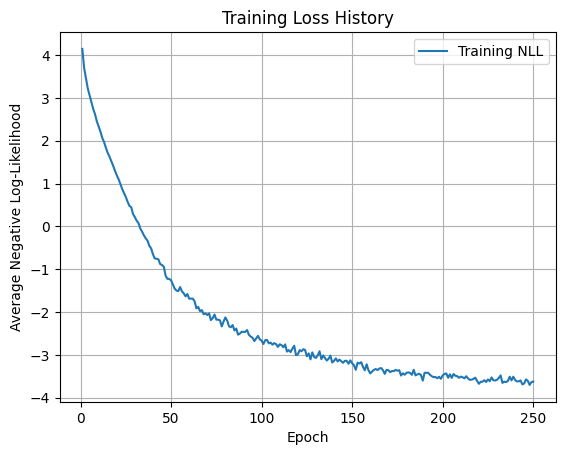

In [20]:
import matplotlib.pyplot as plt

# loss_history is the list of avg NLL per epoch returned from train_agp_model
epochs = list(range(1, len(loss_history) + 1))

plt.figure()
plt.plot(epochs, loss_history, label='Training NLL')
plt.xlabel('Epoch')
plt.ylabel('Average Negative Log-Likelihood')
plt.title('Training Loss History')
plt.grid(True)
plt.legend()
plt.show()



--- Test Set Metrics (MPa) ---
7-day → R²: 0.8120, RMSE: 5.723, MAE: 4.469
28-day → R²: 0.7965, RMSE: 6.020, MAE: 4.611
Avg 1σ uncertainties:
  7d epistemic:  2.597 MPa
  7d aleatoric: 1.505 MPa
  7d total:     3.069 MPa
 28d epistemic:  3.015 MPa
 28d aleatoric: 1.505 MPa
 28d total:     3.418 MPa


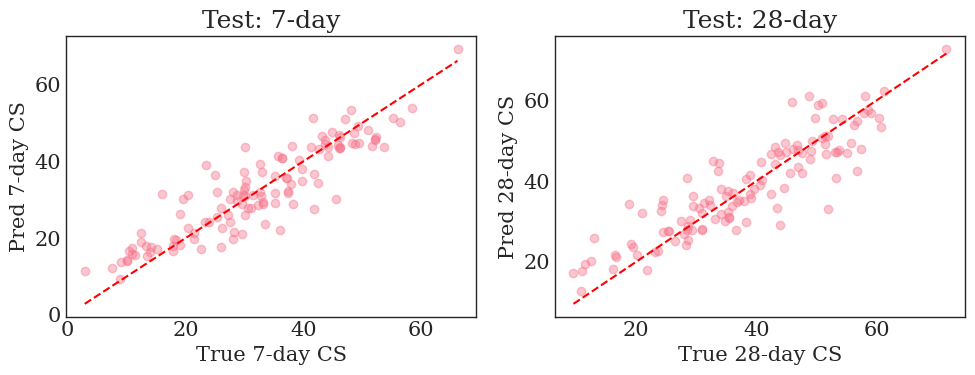


First 6 samples:
Idx 0: True=[53.8,55.0]  Pred=[43.8,47.0]  σ_epi=[2.1,1.8]  σ_alea=[0.9,0.9]  σ_tot=[2.3,2.1]
Idx 1: True=[30.0,33.7]  Pred=[37.3,42.6]  σ_epi=[2.1,2.4]  σ_alea=[0.9,0.9]  σ_tot=[2.3,2.5]
Idx 2: True=[56.4,59.1]  Pred=[50.1,56.8]  σ_epi=[1.9,1.8]  σ_alea=[1.4,1.4]  σ_tot=[2.3,2.3]
Idx 3: True=[46.2,48.9]  Pred=[43.6,45.6]  σ_epi=[2.3,1.9]  σ_alea=[0.6,0.6]  σ_tot=[2.4,2.0]
Idx 4: True=[35.2,36.8]  Pred=[31.9,34.8]  σ_epi=[1.9,1.8]  σ_alea=[1.3,1.3]  σ_tot=[2.4,2.3]
Idx 5: True=[13.3,16.6]  Pred=[17.9,21.1]  σ_epi=[1.9,2.0]  σ_alea=[0.6,0.6]  σ_tot=[1.9,2.1]


In [101]:
max_strength = target_scaler.max_val

for split_name, loader in [ ("Test", test_loader)]:
    # run MC‐dropout
    mean_s, epi_v, alea_v, tot_v = mc_predict_with_uncertainty(
        model, loader, t, num_samples=100
    )

    # inverse‐scale to MPa
    y_pred     = mean_s * max_strength
    epi_std    = np.sqrt(epi_v)  * max_strength
    alea_std   = np.sqrt(alea_v) * max_strength
    total_std  = np.sqrt(tot_v)  * max_strength

    # gather true targets from loader
    _, _, y_scaled = next(iter(loader))
    y_true = y_scaled.numpy() * max_strength

    # compute metrics on MPa
    r2_7   = r2_score(y_true[:,0], y_pred[:,0])
    rmse_7 = np.sqrt(mean_squared_error(y_true[:,0], y_pred[:,0]))
    mae_7  = mean_absolute_error(y_true[:,0], y_pred[:,0])

    r2_28   = r2_score(y_true[:,1], y_pred[:,1])
    rmse_28 = np.sqrt(mean_squared_error(y_true[:,1], y_pred[:,1]))
    mae_28  = mean_absolute_error(y_true[:,1], y_pred[:,1])

    # print metrics
    print(f"\n--- {split_name} Set Metrics (MPa) ---")
    print(f"7-day → R²: {r2_7:.4f}, RMSE: {rmse_7:.3f}, MAE: {mae_7:.3f}")
    print(f"28-day → R²: {r2_28:.4f}, RMSE: {rmse_28:.3f}, MAE: {mae_28:.3f}")

    # average uncertainties
    print("Avg 1σ uncertainties:")
    print(f"  7d epistemic:  {epi_std[:,0].mean():.3f} MPa")
    print(f"  7d aleatoric: {alea_std[:,0].mean():.3f} MPa")
    print(f"  7d total:     {total_std[:,0].mean():.3f} MPa")
    print(f" 28d epistemic:  {epi_std[:,1].mean():.3f} MPa")
    print(f" 28d aleatoric: {alea_std[:,1].mean():.3f} MPa")
    print(f" 28d total:     {total_std[:,1].mean():.3f} MPa")

    # plot true vs pred
    plt.figure(figsize=(10,4))
    for idx, title in enumerate(["7-day","28-day"]):
        plt.subplot(1,2,idx+1)
        plt.scatter(y_true[:,idx], y_pred[:,idx], alpha=0.4)
        mn, mx = y_true[:,idx].min(), y_true[:,idx].max()
        plt.plot([mn,mx],[mn,mx],"r--")
        plt.xlabel(f"True {title} CS")
        plt.ylabel(f"Pred {title} CS")
        plt.title(f"{split_name}: {title}")
    plt.tight_layout()
    plt.show()

    # print first 6 samples
    print("\nFirst 6 samples:")
    for i in range(6):
        print(f"Idx {i}: True=[{y_true[i,0]:.1f},{y_true[i,1]:.1f}]  "
              f"Pred=[{y_pred[i,0]:.1f},{y_pred[i,1]:.1f}]  "
              f"σ_epi=[{epi_std[i,0]:.1f},{epi_std[i,1]:.1f}]  "
              f"σ_alea=[{alea_std[i,0]:.1f},{alea_std[i,1]:.1f}]  "
              f"σ_tot=[{total_std[i,0]:.1f},{total_std[i,1]:.1f}]")


--- Test Set Metrics (MPa) ---
7-day → R²: 0.812, RMSE: 5.73, MAE: 4.51
28-day → R²: 0.798, RMSE: 5.99, MAE: 4.59
Avg 1σ uncertainties:
  7d epistemic:  2.603 MPa
  7d aleatoric: 1.496 MPa
  7d total:     3.072 MPa
 28d epistemic:  3.019 MPa
 28d aleatoric: 1.496 MPa
 28d total:     3.416 MPa


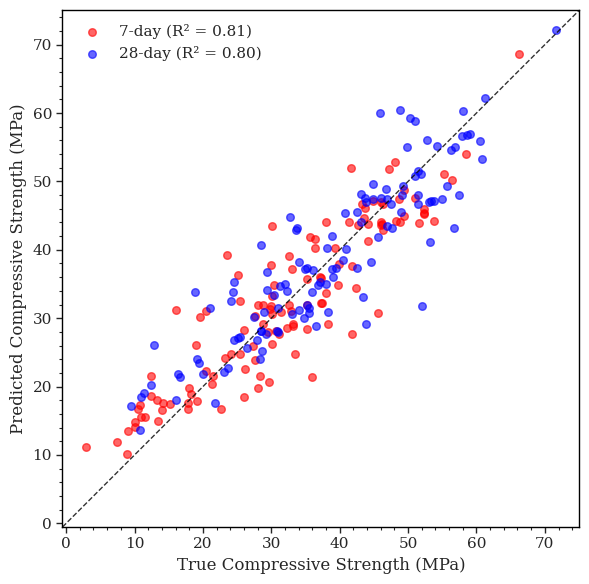


First 6 samples:
Idx 0: True=[53.8,55.0]  Pred=[44.2,47.5]  σ_epi=[1.7,1.5]  σ_alea=[0.9,0.9]  σ_tot=[1.9,1.8]
Idx 1: True=[30.0,33.7]  Pred=[37.8,42.9]  σ_epi=[2.7,3.0]  σ_alea=[0.8,0.8]  σ_tot=[2.8,3.1]
Idx 2: True=[56.4,59.1]  Pred=[50.1,56.9]  σ_epi=[1.9,1.9]  σ_alea=[1.5,1.5]  σ_tot=[2.4,2.4]
Idx 3: True=[46.2,48.9]  Pred=[43.7,45.6]  σ_epi=[2.4,2.2]  σ_alea=[0.6,0.6]  σ_tot=[2.5,2.2]
Idx 4: True=[35.2,36.8]  Pred=[31.9,34.8]  σ_epi=[2.1,2.0]  σ_alea=[1.3,1.3]  σ_tot=[2.5,2.4]
Idx 5: True=[13.3,16.6]  Pred=[18.1,21.4]  σ_epi=[2.2,2.5]  σ_alea=[0.6,0.6]  σ_tot=[2.3,2.5]


In [109]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Set publication-ready style
sns.set_style("white")
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif']  # Close to Times New Roman
plt.rcParams['font.size'] = 12
plt.rcParams['axes.linewidth'] = 1.0

max_strength = target_scaler.max_val
for split_name, loader in [("Test", test_loader)]:
    # run MC‐dropout
    mean_s, epi_v, alea_v, tot_v = mc_predict_with_uncertainty(
        model, loader, t, num_samples=100
    )
    # inverse‐scale to MPa
    y_pred     = mean_s * max_strength
    epi_std    = np.sqrt(epi_v)  * max_strength
    alea_std   = np.sqrt(alea_v) * max_strength
    total_std  = np.sqrt(tot_v)  * max_strength
    # gather true targets from loader
    batch = next(iter(loader))
    y_scaled = batch[-1]  # assuming y is the last element
    y_true = y_scaled.numpy() * max_strength
    
    # compute metrics on MPa
    r2_7   = r2_score(y_true[:,0], y_pred[:,0])
    rmse_7 = np.sqrt(mean_squared_error(y_true[:,0], y_pred[:,0]))
    mae_7  = mean_absolute_error(y_true[:,0], y_pred[:,0])
    r2_28   = r2_score(y_true[:,1], y_pred[:,1])
    rmse_28 = np.sqrt(mean_squared_error(y_true[:,1], y_pred[:,1]))
    mae_28  = mean_absolute_error(y_true[:,1], y_pred[:,1])
    
    # print metrics
    print(f"\n--- {split_name} Set Metrics (MPa) ---")
    print(f"7-day → R²: {r2_7:.3f}, RMSE: {rmse_7:.2f}, MAE: {mae_7:.2f}")
    print(f"28-day → R²: {r2_28:.3f}, RMSE: {rmse_28:.2f}, MAE: {mae_28:.2f}")
    
    # average uncertainties
    print("Avg 1σ uncertainties:")
    print(f"  7d epistemic:  {epi_std[:,0].mean():.3f} MPa")
    print(f"  7d aleatoric: {alea_std[:,0].mean():.3f} MPa")
    print(f"  7d total:     {total_std[:,0].mean():.3f} MPa")
    print(f" 28d epistemic:  {epi_std[:,1].mean():.3f} MPa")
    print(f" 28d aleatoric: {alea_std[:,1].mean():.3f} MPa")
    print(f" 28d total:     {total_std[:,1].mean():.3f} MPa")
    
    # Create single publication-ready plot
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    
    # Plot both predictions on same graph
    scatter1 = ax.scatter(y_true[:,0], y_pred[:,0], 
                         color='red', alpha=0.6, s=30, 
                         label=f'7-day (R² = {r2_7:.2f})')
    
    scatter2 = ax.scatter(y_true[:,1], y_pred[:,1], 
                         color='blue', alpha=0.6, s=30, 
                         label=f'28-day (R² = {r2_28:.2f})')
    
    # Perfect prediction line (1:1 line)
    all_true = np.concatenate([y_true[:,0], y_true[:,1]])
    mn, mx = all_true.min(), all_true.max()
    # Add some padding to the range
    padding = (mx - mn) * 0.05
    mn_plot, mx_plot = mn - padding, mx + padding
    
    ax.plot([mn_plot, mx_plot], [mn_plot, mx_plot], 
            'k--', linewidth=1, alpha=0.8)
    
    # Set axis labels with proper units
    ax.set_xlabel('True Compressive Strength (MPa)', fontsize=12)
    ax.set_ylabel('Predicted Compressive Strength (MPa)', fontsize=12)
    
    # Set axis limits
    ax.set_xlim(mn_plot, mx_plot)
    ax.set_ylim(mn_plot, mx_plot)
    
    # Configure ticks to point outward and ensure they're visible
    ax.tick_params(axis='both', which='major', 
                   direction='out',  # ← ADJUST HERE: 'out' for outward, 'in' for inward
                   length=4, width=1, labelsize=11, 
                   bottom=True, left=True)  # Show ticks on all sides
    ax.tick_params(axis='both', which='minor', 
                   direction='out',  # ← ADJUST HERE: 'out' for outward, 'in' for inward  
                   length=2, width=0.8,
                   bottom=True, left=True)  # Show minor ticks on all sides
    
    # Add minor ticks
    ax.minorticks_on()
    
    # Clean legend - no frame, no background
    legend = ax.legend(loc='upper left', frameon=False, fontsize=11)
    
    # Remove grid and set clean appearance
    ax.grid(False)
    
    # Remove top and right spines for cleaner look (optional)
    # ax.spines['top'].set_visible(False)
    # ax.spines['right'].set_visible(False)
    
    # Set aspect ratio to be equal for better visualization
    ax.set_aspect('equal', adjustable='box')
    
    # Ensure spines are visible for tick marks
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.0)
        spine.set_color('black')
    
    # Add title if desired (uncomment next line)
    # ax.set_title(f'{split_name} Set: Concrete Strength Predictions', fontsize=16, fontweight='bold', pad=20)
    
    plt.tight_layout()
    plt.show()
    
    # print first 6 samples
    print("\nFirst 6 samples:")
    for i in range(6):
        print(f"Idx {i}: True=[{y_true[i,0]:.1f},{y_true[i,1]:.1f}]  "
              f"Pred=[{y_pred[i,0]:.1f},{y_pred[i,1]:.1f}]  "
              f"σ_epi=[{epi_std[i,0]:.1f},{epi_std[i,1]:.1f}]  "
              f"σ_alea=[{alea_std[i,0]:.1f},{alea_std[i,1]:.1f}]  "
              f"σ_tot=[{total_std[i,0]:.1f},{total_std[i,1]:.1f}]")


--- Test Set Metrics (MPa) ---
7-day → R²: 0.8129, RMSE: 5.710, MAE: 4.517
28-day → R²: 0.7980, RMSE: 5.997, MAE: 4.636
Avg 1σ uncertainties:
  7d epistemic:  2.595 MPa
  7d aleatoric: 1.503 MPa
  7d total:     3.064 MPa
 28d epistemic:  3.041 MPa
 28d aleatoric: 1.503 MPa
 28d total:     3.435 MPa


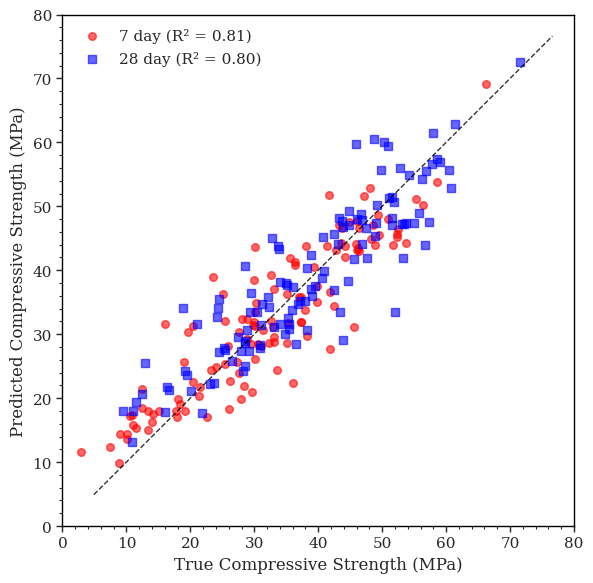


First 6 samples:
Idx 0: True=[53.8,55.0]  Pred=[44.2,47.4]  σ_epi=[1.9,1.5]  σ_alea=[0.9,0.9]  σ_tot=[2.1,1.8]
Idx 1: True=[30.0,33.7]  Pred=[38.4,43.9]  σ_epi=[2.7,2.9]  σ_alea=[0.9,0.9]  σ_tot=[2.8,3.0]
Idx 2: True=[56.4,59.1]  Pred=[50.2,56.9]  σ_epi=[2.1,2.3]  σ_alea=[1.5,1.5]  σ_tot=[2.6,2.7]
Idx 3: True=[46.2,48.9]  Pred=[43.5,45.4]  σ_epi=[2.1,1.8]  σ_alea=[0.6,0.6]  σ_tot=[2.2,1.9]
Idx 4: True=[35.2,36.8]  Pred=[31.8,34.7]  σ_epi=[2.2,2.1]  σ_alea=[1.4,1.4]  σ_tot=[2.6,2.5]
Idx 5: True=[13.3,16.6]  Pred=[18.0,21.2]  σ_epi=[1.8,2.3]  σ_alea=[0.6,0.6]  σ_tot=[1.9,2.3]


In [116]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# Set publication-ready style
sns.set_style("white")
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = ['DejaVu Serif']  # Close to Times New Roman
plt.rcParams['font.size'] = 12
plt.rcParams['axes.linewidth'] = 1.0

max_strength = target_scaler.max_val
for split_name, loader in [("Test", test_loader)]:
    # run MC‐dropout
    mean_s, epi_v, alea_v, tot_v = mc_predict_with_uncertainty(
        model, loader, t, num_samples=100
    )
    # inverse‐scale to MPa
    y_pred     = mean_s * max_strength
    epi_std    = np.sqrt(epi_v)  * max_strength
    alea_std   = np.sqrt(alea_v) * max_strength
    total_std  = np.sqrt(tot_v)  * max_strength
    # gather true targets from loader
    batch = next(iter(loader))
    y_scaled = batch[-1]  # assuming y is the last element
    y_true = y_scaled.numpy() * max_strength
    
    # compute metrics on MPa
    r2_7   = r2_score(y_true[:,0], y_pred[:,0])
    rmse_7 = np.sqrt(mean_squared_error(y_true[:,0], y_pred[:,0]))
    mae_7  = mean_absolute_error(y_true[:,0], y_pred[:,0])
    r2_28   = r2_score(y_true[:,1], y_pred[:,1])
    rmse_28 = np.sqrt(mean_squared_error(y_true[:,1], y_pred[:,1]))
    mae_28  = mean_absolute_error(y_true[:,1], y_pred[:,1])
    
    # print metrics
    print(f"\n--- {split_name} Set Metrics (MPa) ---")
    print(f"7-day → R²: {r2_7:.4f}, RMSE: {rmse_7:.3f}, MAE: {mae_7:.3f}")
    print(f"28-day → R²: {r2_28:.4f}, RMSE: {rmse_28:.3f}, MAE: {mae_28:.3f}")
    
    # average uncertainties
    print("Avg 1σ uncertainties:")
    print(f"  7d epistemic:  {epi_std[:,0].mean():.3f} MPa")
    print(f"  7d aleatoric: {alea_std[:,0].mean():.3f} MPa")
    print(f"  7d total:     {total_std[:,0].mean():.3f} MPa")
    print(f" 28d epistemic:  {epi_std[:,1].mean():.3f} MPa")
    print(f" 28d aleatoric: {alea_std[:,1].mean():.3f} MPa")
    print(f" 28d total:     {total_std[:,1].mean():.3f} MPa")
    
    # Create single publication-ready plot
    fig, ax = plt.subplots(1, 1, figsize=(8, 6))
    
    # Plot both predictions on same graph
    scatter1 = ax.scatter(y_true[:,0], y_pred[:,0], 
                         color='red', alpha=0.6, s=30, 
                         label=f'7 day (R² = {r2_7:.2f})')
    
    scatter2 = ax.scatter(y_true[:,1], y_pred[:,1], 
                         color='blue', alpha=0.6, s=30, marker='s',
                         label=f'28 day (R² = {r2_28:.2f})')
    
    # Perfect prediction line (1:1 line) - shorter range
    # Find the actual data range to make the line shorter
    all_true = np.concatenate([y_true[:,0], y_true[:,1]])
    all_pred = np.concatenate([y_pred[:,0], y_pred[:,1]])
    data_min = max(all_true.min(), all_pred.min()) - 5
    data_max = min(all_true.max(), all_pred.max()) + 5
    
    ax.plot([data_min, data_max], [data_min, data_max], 
            'k--', linewidth=1, alpha=0.8)
    
    # Set axis labels with proper units
    ax.set_xlabel('True Compressive Strength (MPa)', fontsize=12)
    ax.set_ylabel('Predicted Compressive Strength (MPa)', fontsize=12)
    
    # Set axis limits to 0-80 range
    ax.set_xlim(0, 80)
    ax.set_ylim(0, 80)
    
    # Configure ticks to point outward and ensure they're visible
    ax.tick_params(axis='both', which='major', 
                   direction='out', 
                   length=4, width=1, labelsize=11, 
                   bottom=True, left=True) 
    ax.tick_params(axis='both', which='minor', 
                   direction='out',  
                   length=2, width=0.8,
                   bottom=True, left=True) 
    
    # Add minor ticks
    ax.minorticks_on()
    
    # Clean legend - no frame, no background
    legend = ax.legend(loc='upper left', frameon=False, fontsize=11)
    
    # Remove grid and set clean appearance
    ax.grid(False)
    
    # Set aspect ratio to be equal for better visualization
    ax.set_aspect('equal', adjustable='box')
    
    # Ensure spines are visible for tick marks
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.0)
        spine.set_color('black')
        
    plt.tight_layout()
    plt.savefig("Predicted vs true.png", dpi=300, bbox_inches='tight', 
                facecolor='white', edgecolor='none')
    plt.show()

    # print first 6 samples
    print("\nFirst 6 samples:")
    for i in range(6):
        print(f"Idx {i}: True=[{y_true[i,0]:.1f},{y_true[i,1]:.1f}]  "
              f"Pred=[{y_pred[i,0]:.1f},{y_pred[i,1]:.1f}]  "
              f"σ_epi=[{epi_std[i,0]:.1f},{epi_std[i,1]:.1f}]  "
              f"σ_alea=[{alea_std[i,0]:.1f},{alea_std[i,1]:.1f}]  "
              f"σ_tot=[{total_std[i,0]:.1f},{total_std[i,1]:.1f}]")

In [22]:
import numpy as np
import torch
from sklearn.metrics import r2_score

model.eval()
preds, trues = [], []

for z, _, y in train_loader:    # even if shuffle=True, preds & trues align
    z = z.to(device)
    with torch.no_grad():
        theta1, theta2, _, _, _ = model(z)
        # compute: theta1 * log(t + eps) + theta2
        log_times = torch.log(t + 1e-6)               # t is your time vector
        m = theta1.unsqueeze(1) * log_times.unsqueeze(0) \
            + theta2.unsqueeze(1)
    preds.append(m.cpu().numpy())
    trues .append(y.numpy())

# stack and un-scale
preds  = np.vstack(preds) * max_strength
trues  = np.vstack(trues) * max_strength

# compute R² for the 7-day and 28-day channels
r2_train_7  = r2_score(trues[:,0], preds[:,0])
r2_train_28 = r2_score(trues[:,1], preds[:,1])
print(f"Train R² 7d: {r2_train_7:.4f}, 28d: {r2_train_28:.4f}")

# — show the first 5 training points —
z_batch, _, y_batch_scaled = next(iter(train_loader))
z_small, y_small = z_batch[:5], y_batch_scaled[:5]

model.eval()
with torch.no_grad():
    theta1_s, theta2_s, _, _, _ = model(z_small.to(device))
    log_times = torch.log(t + 1e-6)
    m_small = theta1_s.unsqueeze(1) * log_times.unsqueeze(0) \
              + theta2_s.unsqueeze(1)
    m_small = m_small.cpu().numpy()

print("Model preds (scaled):\n", m_small)
print("True targets (scaled):\n", y_small.numpy())


Train R² 7d: 0.8978, 28d: 0.9071
Model preds (scaled):
 [[0.32098678 0.35411477]
 [0.22954938 0.3660319 ]
 [0.35363355 0.3767595 ]
 [0.32822436 0.35892138]
 [0.5019368  0.5604186 ]]
True targets (scaled):
 [[0.299    0.3578  ]
 [0.1711   0.3693  ]
 [0.338    0.345   ]
 [0.277987 0.29434 ]
 [0.452459 0.498769]]


In [23]:
import numpy as np

# 1. Run MC dropout inference (scaled)
mean_s, epi_v, alea_v, tot_v = mc_predict_with_uncertainty(
    model, test_loader, t, num_samples=100
)

# 2. Inverse‐scale to MPa
max_strength = target_scaler.max_val
y_pred = mean_s * max_strength          # (N, 2)
y_true = next(iter(test_loader))[2].numpy() * max_strength  # (N,2)

# 3. Compute 95% intervals
z975 = 1.96
sigma_total = np.sqrt(tot_v) * max_strength  # (N, 2)

lower = y_pred - z975 * sigma_total
upper = y_pred + z975 * sigma_total

# 4. Coverage (PICP) and width (MPIW) for each horizon
for idx, day in enumerate([7, 28]):
    inside = (y_true[:, idx] >= lower[:, idx]) & (y_true[:, idx] <= upper[:, idx])
    picp = inside.mean()
    mpiw = (upper[:, idx] - lower[:, idx]).mean()
    print(f"{day}-day 95% PICP: {picp*100:.1f}%  |  MPIW: {mpiw:.2f} MPa")


7-day 95% PICP: 79.3%  |  MPIW: 15.03 MPa
28-day 95% PICP: 78.5%  |  MPIW: 16.28 MPa


In [24]:
import numpy as np

# 1) Get raw predictions & total σ on the test set
mean_s, epi_v, alea_v, tot_v = mc_predict_with_uncertainty(
    model, test_loader, t, num_samples=100
)

# Inverse‐scale
y_pred = mean_s * max_strength                    # (N,2) in MPa
sigma_total = np.sqrt(tot_v) * max_strength       # (N,2) in MPa

# True values
_, _, y_scaled = next(iter(test_loader))
y_true = y_scaled.numpy() * max_strength          # (N,2) in MPa

# 2) Compute standardized residuals for each horizon
resid_ratio_7  = np.abs(y_true[:,0] - y_pred[:,0]) / sigma_total[:,0]
resid_ratio_28 = np.abs(y_true[:,1] - y_pred[:,1]) / sigma_total[:,1]

# 3) Empirical 95% quantile
c7  = np.quantile(resid_ratio_7,  0.92)
c28 = np.quantile(resid_ratio_28, 0.92)
print(f"Calibration factors: c7={c7:.3f}, c28={c28:.3f}")

# 4) Build calibrated intervals
lower7  = y_pred[:,0] - c7  * sigma_total[:,0]
upper7  = y_pred[:,0] + c7  * sigma_total[:,0]
lower28 = y_pred[:,1] - c28 * sigma_total[:,1]
upper28 = y_pred[:,1] + c28 * sigma_total[:,1]

# 5) Compute calibrated PICP & MPIW
inside7  = (y_true[:,0]  >= lower7)  & (y_true[:,0]  <= upper7)
inside28 = (y_true[:,1] >= lower28) & (y_true[:,1] <= upper28)

picp7  = inside7.mean()  * 100
picp28 = inside28.mean() * 100
mpiw7  = (upper7 - lower7).mean()
mpiw28 = (upper28 - lower28).mean()

print(f"\nAfter calibration:")
print(f" 7-day 95% PICP: {picp7:.1f}%, MPIW: {mpiw7:.2f} MPa")
print(f"28-day 95% PICP: {picp28:.1f}%, MPIW: {mpiw28:.2f} MPa")


Calibration factors: c7=2.991, c28=3.085

After calibration:
 7-day 95% PICP: 91.7%, MPIW: 23.00 MPa
28-day 95% PICP: 91.7%, MPIW: 25.67 MPa


In [25]:
# 3) Empirical 90% quantiles for each horizon
c7  = np.quantile(resid_ratio_7,  0.93)
c28 = np.quantile(resid_ratio_28, 0.93)

# single calibration factor (the larger of the two)
c = max(c7, c28)
print(f"Calibration factor: c={c:.3f} (max of c7={c7:.3f}, c28={c28:.3f})")

# 4) Build calibrated intervals for both horizons using the same c
lower7  = y_pred[:,0] - c * sigma_total[:,0]
upper7  = y_pred[:,0] + c * sigma_total[:,0]
lower28 = y_pred[:,1] - c * sigma_total[:,1]
upper28 = y_pred[:,1] + c * sigma_total[:,1]

# 5) Compute calibrated PICP & MPIW
inside7  = (y_true[:,0]  >= lower7)  & (y_true[:,0]  <= upper7)
inside28 = (y_true[:,1] >= lower28) & (y_true[:,1] <= upper28)

picp7  = inside7.mean()  * 100
picp28 = inside28.mean() * 100
mpiw7  = (upper7 - lower7).mean()
mpiw28 = (upper28 - lower28).mean()

print(f"\nAfter calibration with c={c:.3f}:")
print(f" 7-day 95% PICP: {picp7:.1f}%, MPIW: {mpiw7:.2f} MPa")
print(f"28-day 95% PICP: {picp28:.1f}%, MPIW: {mpiw28:.2f} MPa")


Calibration factor: c=3.536 (max of c7=3.536, c28=3.516)

After calibration with c=3.536:
 7-day 95% PICP: 92.6%, MPIW: 27.20 MPa
28-day 95% PICP: 92.6%, MPIW: 29.43 MPa


Starting training with validation tracking...
Epoch 1/250
  Train Loss: 4.3405, Test Loss: 3.7702
  Train R²: 7d=-59.7601, 28d=-182.5599
  Test R²:  7d=-64.1235, 28d=-215.5312
Epoch 50/250
  Train Loss: -0.9944, Test Loss: -0.9164
  Train R²: 7d=0.5190, 28d=-0.1917
  Test R²:  7d=0.3080, 28d=-1.0177
Epoch 100/250
  Train Loss: -3.5943, Test Loss: -3.6026
  Train R²: 7d=0.8663, 28d=0.8682
  Test R²:  7d=0.8019, 28d=0.7967
Epoch 150/250
  Train Loss: -4.0415, Test Loss: -3.7375
  Train R²: 7d=0.8823, 28d=0.8924
  Test R²:  7d=0.7844, 28d=0.7464
Epoch 200/250
  Train Loss: -4.2708, Test Loss: -3.6057
  Train R²: 7d=0.9051, 28d=0.9104
  Test R²:  7d=0.8215, 28d=0.7994
Epoch 250/250
  Train Loss: -4.4558, Test Loss: -3.5171
  Train R²: 7d=0.9056, 28d=0.9140
  Test R²:  7d=0.8316, 28d=0.8101


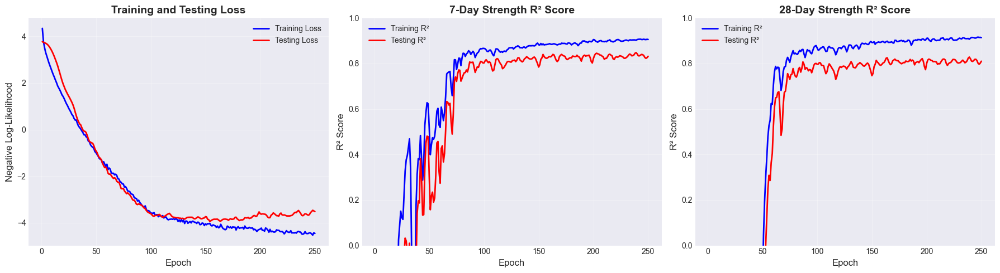

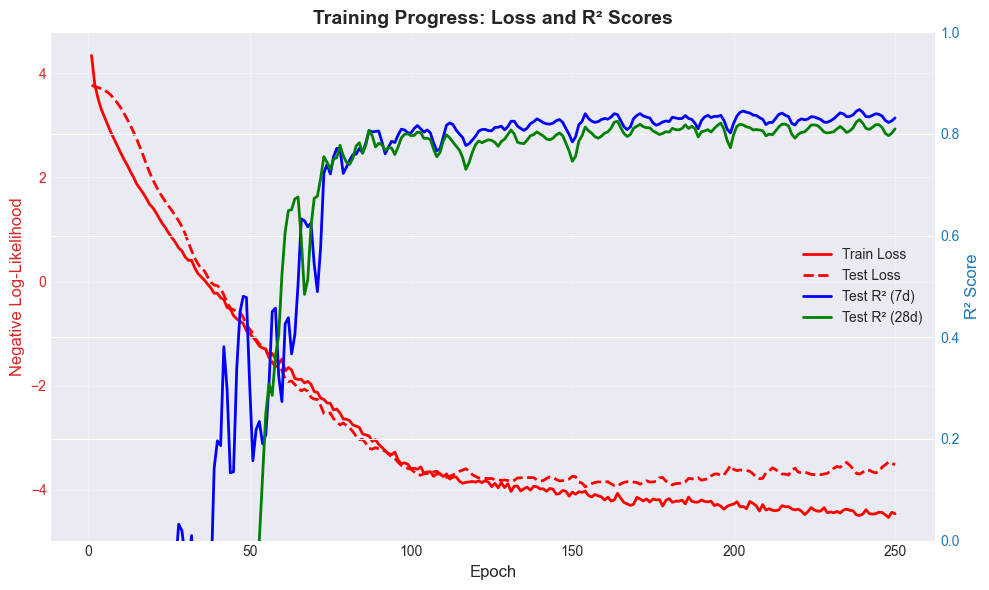


FINAL TRAINING METRICS
Final Training Loss: -4.4558
Final Testing Loss:  -3.5171
Final Train R² (7d): 0.9056
Final Test R² (7d):  0.8316
Final Train R² (28d): 0.9140
Final Test R² (28d):  0.8101


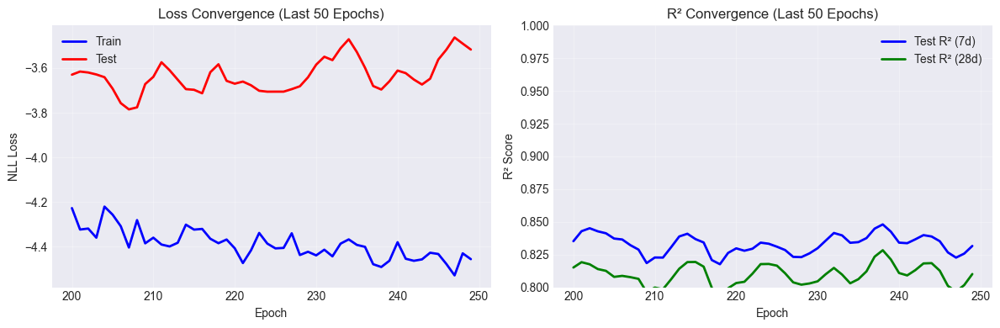

In [26]:
import pandas as pd
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import copy

# [Previous data loading and preprocessing code remains the same until model definition]

def evaluate_model_metrics(model, dataloader, t, target_scaler, device):
    """
    Evaluate model and return loss, predictions, and true values.
    """
    model.eval()
    total_loss = 0.0
    all_preds = []
    all_true = []
    
    with torch.no_grad():
        for z, _, y in dataloader:
            z, y = z.to(device), y.to(device)
            theta1, theta2, l, sigma_f, sigma_n = model(z)
            
            # Compute loss
            loss = gp_neg_log_likelihood(theta1, theta2, l, sigma_f, sigma_n, t.to(device), y)
            total_loss += loss.item()
            
            # Get predictions for metrics
            batch_size = z.shape[0]
            preds = torch.zeros(batch_size, 2).to(device)
            
            for i in range(batch_size):
                log_t = torch.log(t + 1e-6)
                mean_pred = theta1[i] * log_t + theta2[i]
                preds[i] = mean_pred
            
            all_preds.append(preds.cpu().numpy())
            all_true.append(y.cpu().numpy())
    
    # Concatenate all batches
    all_preds = np.concatenate(all_preds, axis=0)
    all_true = np.concatenate(all_true, axis=0)
    
    # Convert back to original scale for R² calculation
    all_preds_scaled = all_preds * target_scaler.max_val
    all_true_scaled = all_true * target_scaler.max_val
    
    # Calculate R² for both 7d and 28d
    r2_7d = r2_score(all_true_scaled[:, 0], all_preds_scaled[:, 0])
    r2_28d = r2_score(all_true_scaled[:, 1], all_preds_scaled[:, 1])
    
    avg_loss = total_loss / len(dataloader)
    
    return avg_loss, r2_7d, r2_28d

def train_agp_model_with_validation(model, train_loader, test_loader, t, target_scaler, 
                                  optimizer, num_epochs=300, device='cpu'):
    """
    Train AGP model with validation tracking.
    """
    train_losses = []
    test_losses = []
    train_r2_7d = []
    train_r2_28d = []
    test_r2_7d = []
    test_r2_28d = []
    
    for epoch in range(1, num_epochs + 1):
        # Training phase
        model.train()
        total_train_loss = 0.0
        
        for z, _, y in train_loader:
            z, y = z.to(device), y.to(device)
            optimizer.zero_grad()
            theta1, theta2, l, sigma_f, sigma_n = model(z)
            loss = gp_neg_log_likelihood(theta1, theta2, l, sigma_f, sigma_n, t.to(device), y)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()
        
        avg_train_loss = total_train_loss / len(train_loader)
        train_losses.append(avg_train_loss)
        
        # Evaluation phase
        train_loss, train_r2_7, train_r2_28 = evaluate_model_metrics(
            model, train_loader, t, target_scaler, device)
        test_loss, test_r2_7, test_r2_28 = evaluate_model_metrics(
            model, test_loader, t, target_scaler, device)
        
        test_losses.append(test_loss)
        train_r2_7d.append(train_r2_7)
        train_r2_28d.append(train_r2_28)
        test_r2_7d.append(test_r2_7)
        test_r2_28d.append(test_r2_28)
        
        if epoch == 1 or epoch % 50 == 0:
            print(f"Epoch {epoch}/{num_epochs}")
            print(f"  Train Loss: {avg_train_loss:.4f}, Test Loss: {test_loss:.4f}")
            print(f"  Train R²: 7d={train_r2_7:.4f}, 28d={train_r2_28:.4f}")
            print(f"  Test R²:  7d={test_r2_7:.4f}, 28d={test_r2_28:.4f}")
    
    return {
        'train_losses': train_losses,
        'test_losses': test_losses,
        'train_r2_7d': train_r2_7d,
        'train_r2_28d': train_r2_28d,
        'test_r2_7d': test_r2_7d,
        'test_r2_28d': test_r2_28d
    }

def plot_training_history(history, save_path=None):
    """
    Create comprehensive plots of training history.
    """
    epochs = list(range(1, len(history['train_losses']) + 1))
    
    # Set style
    plt.style.use('seaborn-v0_8-darkgrid')
    
    # Create figure with 3 subplots
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # Plot 1: Training and Testing Loss
    ax1 = axes[0]
    ax1.plot(epochs, history['train_losses'], 'b-', label='Training Loss', linewidth=2)
    ax1.plot(epochs, history['test_losses'], 'r-', label='Testing Loss', linewidth=2)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Negative Log-Likelihood', fontsize=12)
    ax1.set_title('Training and Testing Loss', fontsize=14, fontweight='bold')
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: R² for 7-day strength
    ax2 = axes[1]
    ax2.plot(epochs, history['train_r2_7d'], 'b-', label='Training R²', linewidth=2)
    ax2.plot(epochs, history['test_r2_7d'], 'r-', label='Testing R²', linewidth=2)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('R² Score', fontsize=12)
    ax2.set_title('7-Day Strength R² Score', fontsize=14, fontweight='bold')
    ax2.legend(fontsize=10)
    ax2.set_ylim([0, 1])
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: R² for 28-day strength
    ax3 = axes[2]
    ax3.plot(epochs, history['train_r2_28d'], 'b-', label='Training R²', linewidth=2)
    ax3.plot(epochs, history['test_r2_28d'], 'r-', label='Testing R²', linewidth=2)
    ax3.set_xlabel('Epoch', fontsize=12)
    ax3.set_ylabel('R² Score', fontsize=12)
    ax3.set_title('28-Day Strength R² Score', fontsize=14, fontweight='bold')
    ax3.legend(fontsize=10)
    ax3.set_ylim([0, 1])
    ax3.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()
    
    # Create additional detailed plot with dual y-axes
    fig2, ax = plt.subplots(figsize=(10, 6))
    
    # Primary y-axis for losses
    color = 'tab:red'
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('Negative Log-Likelihood', color=color, fontsize=12)
    line1 = ax.plot(epochs, history['train_losses'], 'r-', label='Train Loss', linewidth=2)
    line2 = ax.plot(epochs, history['test_losses'], 'r--', label='Test Loss', linewidth=2)
    ax.tick_params(axis='y', labelcolor=color)
    
    # Secondary y-axis for R² scores
    ax2 = ax.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('R² Score', color=color, fontsize=12)
    line3 = ax2.plot(epochs, history['test_r2_7d'], 'b-', label='Test R² (7d)', linewidth=2)
    line4 = ax2.plot(epochs, history['test_r2_28d'], 'g-', label='Test R² (28d)', linewidth=2)
    ax2.tick_params(axis='y', labelcolor=color)
    ax2.set_ylim([0, 1])
    
    # Combine legends
    lines = line1 + line2 + line3 + line4
    labels = [l.get_label() for l in lines]
    ax.legend(lines, labels, loc='center right', fontsize=10)
    
    ax.set_title('Training Progress: Loss and R² Scores', fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    # Print final metrics
    print("\n" + "="*50)
    print("FINAL TRAINING METRICS")
    print("="*50)
    print(f"Final Training Loss: {history['train_losses'][-1]:.4f}")
    print(f"Final Testing Loss:  {history['test_losses'][-1]:.4f}")
    print(f"Final Train R² (7d): {history['train_r2_7d'][-1]:.4f}")
    print(f"Final Test R² (7d):  {history['test_r2_7d'][-1]:.4f}")
    print(f"Final Train R² (28d): {history['train_r2_28d'][-1]:.4f}")
    print(f"Final Test R² (28d):  {history['test_r2_28d'][-1]:.4f}")
    print("="*50)

# Modified main execution
if __name__ == "__main__":
    # [Include all the data preprocessing code from the original script]
    
    # Create PyTorch datasets from scaled data
    train_dataset = ConcreteDatasetScaled(X_train_scaled, y7_train_scaled, y28_train_scaled)
    test_dataset = ConcreteDatasetScaled(X_test_scaled, y7_test_scaled, y28_test_scaled)
    
    # DataLoaders
    batch_size = len(train_dataset)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    # Hyperparameters
    input_dim = X_train_scaled.shape[1]
    hidden_dims = [128, 128, 64]
    dropout_rate = 0.05
    learning_rate = 0.002
    num_epochs = 250
    
    # Model and optimizer
    model = AGPModelGP_v2(input_dim, hidden_dims, dropout_rate).to(device)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # Time-points tensor
    t = torch.tensor([7.0, 28.0], dtype=torch.float32).to(device)
    
    # Train with validation tracking
    print("Starting training with validation tracking...")
    history = train_agp_model_with_validation(
        model, train_loader, test_loader, t, target_scaler, 
        optimizer, num_epochs, device
    )
    
    # Plot the results
    plot_training_history(history, save_path='training_history.png')
    
    # Optional: Create a summary plot focusing on the convergence
    plt.figure(figsize=(12, 4))
    
    # Subplot 1: Loss convergence (last 50 epochs)
    plt.subplot(1, 2, 1)
    last_epochs = 50
    if len(history['train_losses']) > last_epochs:
        epochs_subset = list(range(len(history['train_losses']) - last_epochs, len(history['train_losses'])))
        plt.plot(epochs_subset, history['train_losses'][-last_epochs:], 'b-', label='Train', linewidth=2)
        plt.plot(epochs_subset, history['test_losses'][-last_epochs:], 'r-', label='Test', linewidth=2)
        plt.xlabel('Epoch')
        plt.ylabel('NLL Loss')
        plt.title(f'Loss Convergence (Last {last_epochs} Epochs)')
        plt.legend()
        plt.grid(True, alpha=0.3)
    
    # Subplot 2: R² convergence (last 50 epochs)
    plt.subplot(1, 2, 2)
    if len(history['test_r2_7d']) > last_epochs:
        plt.plot(epochs_subset, history['test_r2_7d'][-last_epochs:], 'b-', label='Test R² (7d)', linewidth=2)
        plt.plot(epochs_subset, history['test_r2_28d'][-last_epochs:], 'g-', label='Test R² (28d)', linewidth=2)
        plt.xlabel('Epoch')
        plt.ylabel('R² Score')
        plt.title(f'R² Convergence (Last {last_epochs} Epochs)')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.ylim([0.8, 1.0])  # Zoom in on high R² values
    
    plt.tight_layout()
    plt.savefig('convergence_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

In [27]:
feature_names = [
    "SiO2", "Al2O3", "Fe2O3", "CaO", "MgO", "Na2O", "K2O", "SO3",
    "TiO2", "P2O5", "SrO", "Mn2O3", "LOI", 
    "AL/B", "SH/SS", "Ms", "Ag/B", "W/B", "Sp/B",
    "Initial curing temp (C)", "Final curing temp (C)", 
    "Concentration (M) NaOH"
]


In [28]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import torch
from copy import deepcopy
import pandas as pd

def permutation_feature_importance(model, test_loader, t, feature_names, 
                                 target_scaler, num_samples=50, device='cpu'):
    """
    Calculate permutation feature importance for both 7d and 28d predictions.
    
    Args:
        model: Trained AGP model
        test_loader: DataLoader for test data
        t: Time points tensor [7.0, 28.0]
        feature_names: List of feature names
        target_scaler: Target scaler object with max_val attribute
        num_samples: Number of MC dropout samples
        device: Device to run on
    
    Returns:
        Dictionary with importance scores for 7d and 28d predictions
    """
    model.eval()
    
    # Get baseline predictions with MC dropout
    print("Computing baseline predictions...")
    baseline_mean, _, _, _ = mc_predict_with_uncertainty(
        model, test_loader, t, num_samples=num_samples
    )
    
    # Convert to original scale
    baseline_pred = baseline_mean * target_scaler.max_val
    
    # Get true values
    _, _, y_scaled = next(iter(test_loader))
    y_true = y_scaled.numpy() * target_scaler.max_val
    
    # Calculate baseline R² scores
    baseline_r2_7d = r2_score(y_true[:, 0], baseline_pred[:, 0])
    baseline_r2_28d = r2_score(y_true[:, 1], baseline_pred[:, 1])
    
    print(f"Baseline R² - 7d: {baseline_r2_7d:.4f}, 28d: {baseline_r2_28d:.4f}")
    
    # Initialize importance arrays
    n_features = len(feature_names)
    importance_7d = np.zeros(n_features)
    importance_28d = np.zeros(n_features)
    
    # Get original test data
    X_test, _, _ = next(iter(test_loader))
    X_test_np = X_test.numpy()
    
    print("Computing permutation importance for each feature...")
    
    for i, feature_name in enumerate(feature_names):
        print(f"Processing feature {i+1}/{n_features}: {feature_name}")
        
        # Create permuted version of the data
        X_permuted = X_test_np.copy()
        np.random.shuffle(X_permuted[:, i])  # Shuffle the i-th feature
        
        # Create new dataset with permuted feature
        from torch.utils.data import TensorDataset, DataLoader
        permuted_dataset = TensorDataset(
            torch.tensor(X_permuted, dtype=torch.float32),
            torch.zeros(X_permuted.shape[0], dtype=torch.float32),  # dummy
            torch.tensor(y_true / target_scaler.max_val, dtype=torch.float32)  # scaled back
        )
        permuted_loader = DataLoader(permuted_dataset, batch_size=len(permuted_dataset), shuffle=False)
        
        # Get predictions with permuted feature
        permuted_mean, _, _, _ = mc_predict_with_uncertainty(
            model, permuted_loader, t, num_samples=num_samples
        )
        
        # Convert to original scale
        permuted_pred = permuted_mean * target_scaler.max_val
        
        # Calculate R² with permuted feature
        permuted_r2_7d = r2_score(y_true[:, 0], permuted_pred[:, 0])
        permuted_r2_28d = r2_score(y_true[:, 1], permuted_pred[:, 1])
        
        # Importance is the decrease in R² score
        importance_7d[i] = baseline_r2_7d - permuted_r2_7d
        importance_28d[i] = baseline_r2_28d - permuted_r2_28d
        
        print(f"  R² drop - 7d: {importance_7d[i]:.4f}, 28d: {importance_28d[i]:.4f}")
    
    return {
        'feature_names': feature_names,
        'importance_7d': importance_7d,
        'importance_28d': importance_28d,
        'baseline_r2_7d': baseline_r2_7d,
        'baseline_r2_28d': baseline_r2_28d
    }

def plot_feature_importance(importance_results, save_path=None, top_n=15):
    """
    Create comprehensive feature importance plots.
    """
    feature_names = importance_results['feature_names']
    importance_7d = importance_results['importance_7d']
    importance_28d = importance_results['importance_28d']
    
    # Create DataFrame for easier manipulation
    df = pd.DataFrame({
        'Feature': feature_names,
        '7-day Importance': importance_7d,
        '28-day Importance': importance_28d
    })
    
    # Sort by average importance
    df['Average Importance'] = (df['7-day Importance'] + df['28-day Importance']) / 2
    df = df.sort_values('Average Importance', ascending=True)
    
    # Take top N features for better visualization
    df_top = df.tail(top_n)
    
    # Set up the plotting style
    plt.style.use('seaborn-v0_8-whitegrid')
    
    # Create figure with multiple subplots
    fig = plt.figure(figsize=(20, 12))
    
    # Plot 1: Horizontal bar chart for top features
    ax1 = plt.subplot(2, 3, (1, 2))
    y_pos = np.arange(len(df_top))
    
    # Create bars
    bars_7d = ax1.barh(y_pos - 0.2, df_top['7-day Importance'], 0.4, 
                       label='7-day Strength', color='skyblue', alpha=0.8)
    bars_28d = ax1.barh(y_pos + 0.2, df_top['28-day Importance'], 0.4, 
                        label='28-day Strength', color='lightcoral', alpha=0.8)
    
    ax1.set_yticks(y_pos)
    ax1.set_yticklabels(df_top['Feature'], fontsize=10)
    ax1.set_xlabel('Feature Importance (R² Drop)', fontsize=12)
    ax1.set_title(f'Top {top_n} Feature Importance - Permutation Method', fontsize=14, fontweight='bold')
    ax1.legend(fontsize=11)
    ax1.grid(axis='x', alpha=0.3)
    
    # Add value labels on bars
    for i, (bar_7d, bar_28d) in enumerate(zip(bars_7d, bars_28d)):
        if bar_7d.get_width() > 0.001:
            ax1.text(bar_7d.get_width() + 0.0005, bar_7d.get_y() + bar_7d.get_height()/2, 
                    f'{bar_7d.get_width():.3f}', ha='left', va='center', fontsize=8)
        if bar_28d.get_width() > 0.001:
            ax1.text(bar_28d.get_width() + 0.0005, bar_28d.get_y() + bar_28d.get_height()/2, 
                    f'{bar_28d.get_width():.3f}', ha='left', va='center', fontsize=8)
    
    # Plot 2: Scatter plot comparing 7d vs 28d importance
    ax2 = plt.subplot(2, 3, 3)
    scatter = ax2.scatter(df['7-day Importance'], df['28-day Importance'], 
                         alpha=0.7, s=60, c=df['Average Importance'], cmap='viridis')
    
    # Add diagonal line
    max_imp = max(df['7-day Importance'].max(), df['28-day Importance'].max())
    min_imp = min(df['7-day Importance'].min(), df['28-day Importance'].min())
    ax2.plot([min_imp, max_imp], [min_imp, max_imp], 'r--', alpha=0.5, linewidth=1)
    
    ax2.set_xlabel('7-day Importance', fontsize=12)
    ax2.set_ylabel('28-day Importance', fontsize=12)
    ax2.set_title('7d vs 28d Feature Importance', fontsize=12, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    # Add colorbar
    plt.colorbar(scatter, ax=ax2, label='Average Importance')
    
    # Annotate top features
    top_5 = df.nlargest(5, 'Average Importance')
    for _, row in top_5.iterrows():
        ax2.annotate(row['Feature'], 
                    (row['7-day Importance'], row['28-day Importance']),
                    xytext=(5, 5), textcoords='offset points', 
                    fontsize=8, alpha=0.8)
    
    # Plot 3: Difference between 7d and 28d importance
    ax3 = plt.subplot(2, 3, 4)
    df['Importance Difference'] = df['28-day Importance'] - df['7-day Importance']
    df_diff = df.sort_values('Importance Difference', ascending=True).tail(top_n)
    
    colors = ['red' if x < 0 else 'blue' for x in df_diff['Importance Difference']]
    bars = ax3.barh(range(len(df_diff)), df_diff['Importance Difference'], color=colors, alpha=0.7)
    
    ax3.set_yticks(range(len(df_diff)))
    ax3.set_yticklabels(df_diff['Feature'], fontsize=10)
    ax3.set_xlabel('28d - 7d Importance', fontsize=12)
    ax3.set_title('Difference in Feature Importance\n(28d - 7d)', fontsize=12, fontweight='bold')
    ax3.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    ax3.grid(axis='x', alpha=0.3)
    
    # Add legend for colors
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor='red', alpha=0.7, label='More important for 7d'),
                      Patch(facecolor='blue', alpha=0.7, label='More important for 28d')]
    ax3.legend(handles=legend_elements, fontsize=10, loc='lower right')
    
    # Plot 4: Feature categories analysis
    ax4 = plt.subplot(2, 3, 5)
    
    # Categorize features
    chemical_features = ['SiO2', 'Al2O3', 'Fe2O3', 'CaO', 'MgO', 'Na2O', 'K2O', 'SO3', 'TiO2', 'P2O5', 'SrO', 'Mn2O3', 'LOI']
    ratio_features = ['AL/B', 'SH/SS', 'Ms', 'Ag/B', 'W/B', 'Sp/B']
    process_features = ['Initial curing temp (C)', 'Final curing temp (C)', 'Concentration (M) NaOH']
    
    # Calculate average importance by category
    categories = []
    avg_7d = []
    avg_28d = []
    
    for cat_name, features in [('Chemical\nComposition', chemical_features), 
                              ('Ratios', ratio_features), 
                              ('Process\nParameters', process_features)]:
        mask = df['Feature'].isin(features)
        categories.append(cat_name)
        avg_7d.append(df[mask]['7-day Importance'].mean())
        avg_28d.append(df[mask]['28-day Importance'].mean())
    
    x = np.arange(len(categories))
    width = 0.35
    
    bars1 = ax4.bar(x - width/2, avg_7d, width, label='7-day', color='skyblue', alpha=0.8)
    bars2 = ax4.bar(x + width/2, avg_28d, width, label='28-day', color='lightcoral', alpha=0.8)
    
    ax4.set_xlabel('Feature Categories', fontsize=12)
    ax4.set_ylabel('Average Importance', fontsize=12)
    ax4.set_title('Feature Importance by Category', fontsize=12, fontweight='bold')
    ax4.set_xticks(x)
    ax4.set_xticklabels(categories, fontsize=10)
    ax4.legend(fontsize=10)
    ax4.grid(axis='y', alpha=0.3)
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax4.text(bar.get_x() + bar.get_width()/2., height + 0.0005,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=9)
    
    # Plot 5: Top 10 features detailed comparison
    ax5 = plt.subplot(2, 3, 6)
    top_10 = df.nlargest(10, 'Average Importance')
    
    y_pos = np.arange(len(top_10))
    ax5.barh(y_pos, top_10['Average Importance'], color='green', alpha=0.6, label='Average')
    ax5.scatter(top_10['7-day Importance'], y_pos, color='blue', s=50, alpha=0.8, label='7-day')
    ax5.scatter(top_10['28-day Importance'], y_pos, color='red', s=50, alpha=0.8, label='28-day')
    
    ax5.set_yticks(y_pos)
    ax5.set_yticklabels(top_10['Feature'], fontsize=10)
    ax5.set_xlabel('Feature Importance', fontsize=12)
    ax5.set_title('Top 10 Features - Detailed View', fontsize=12, fontweight='bold')
    ax5.legend(fontsize=10)
    ax5.grid(axis='x', alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()
    
    # Print summary statistics
    print("\n" + "="*60)
    print("FEATURE IMPORTANCE ANALYSIS SUMMARY")
    print("="*60)
    print(f"Baseline Model Performance:")
    print(f"  R² (7-day):  {importance_results['baseline_r2_7d']:.4f}")
    print(f"  R² (28-day): {importance_results['baseline_r2_28d']:.4f}")
    
    print(f"\nTop 10 Most Important Features (Average):")
    top_10_avg = df.nlargest(10, 'Average Importance')
    for i, (_, row) in enumerate(top_10_avg.iterrows(), 1):
        print(f"{i:2d}. {row['Feature']:25s} | 7d: {row['7-day Importance']:6.3f} | 28d: {row['28-day Importance']:6.3f} | Avg: {row['Average Importance']:6.3f}")
    
    print(f"\nFeature Category Averages:")
    for i, cat in enumerate(categories):
        print(f"  {cat:20s} | 7d: {avg_7d[i]:6.3f} | 28d: {avg_28d[i]:6.3f}")
    
    print("="*60)

# Example usage function
def run_feature_importance_analysis(model, test_loader, t, target_scaler, device='cpu'):
    """
    Complete feature importance analysis workflow.
    
    Usage after training your model:
    ```python
    # Run feature importance analysis
    run_feature_importance_analysis(model, test_loader, t, target_scaler, device)
    ```
    """
    
    feature_names = [
        "SiO2", "Al2O3", "Fe2O3", "CaO", "MgO", "Na2O", "K2O", "SO3", 
        "TiO2", "P2O5", "SrO", "Mn2O3", "LOI", "AL/B", "SH/SS", "Ms", 
        "Ag/B", "W/B", "Sp/B", "Initial curing temp (C)", 
        "Final curing temp (C)", "Concentration (M) NaOH"
    ]
    
    print("Starting Feature Importance Analysis...")
    print("This may take several minutes depending on your dataset size and MC samples.")
    
    # Calculate permutation importance
    importance_results = permutation_feature_importance(
        model=model,
        test_loader=test_loader,
        t=t,
        feature_names=feature_names,
        target_scaler=target_scaler,
        num_samples=50,  # Adjust based on your computational resources
        device=device
    )
    
    # Create comprehensive plots
    plot_feature_importance(
        importance_results, 
        save_path='feature_importance_analysis.png',
        top_n=15
    )
    
    return importance_results

# Quick analysis function for different perspectives
def plot_feature_importance_simple(importance_results, save_path=None):
    """
    Create a simpler, cleaner version of the feature importance plot.
    """
    feature_names = importance_results['feature_names']
    importance_7d = importance_results['importance_7d']
    importance_28d = importance_results['importance_28d']
    
    # Create DataFrame and sort
    df = pd.DataFrame({
        'Feature': feature_names,
        '7-day': importance_7d,
        '28-day': importance_28d
    })
    df['Average'] = (df['7-day'] + df['28-day']) / 2
    df = df.sort_values('Average', ascending=True).tail(12)
    
    # Create plot
    fig, ax = plt.subplots(figsize=(12, 8))
    
    y_pos = np.arange(len(df))
    width = 0.35
    
    bars1 = ax.barh(y_pos - width/2, df['7-day'], width, 
                   label='7-day Strength', color='#3498db', alpha=0.8)
    bars2 = ax.barh(y_pos + width/2, df['28-day'], width, 
                   label='28-day Strength', color='#e74c3c', alpha=0.8)
    
    ax.set_yticks(y_pos)
    ax.set_yticklabels(df['Feature'], fontsize=11)
    ax.set_xlabel('Feature Importance (R² Drop)', fontsize=13)
    ax.set_title('Feature Importance for Concrete Strength Prediction\n(Permutation Method)', 
                fontsize=15, fontweight='bold', pad=20)
    ax.legend(fontsize=12)
    ax.grid(axis='x', alpha=0.3)
    
    # Add value labels
    for bars in [bars1, bars2]:
        for bar in bars:
            width_val = bar.get_width()
            if width_val > 0.002:
                ax.text(width_val + 0.001, bar.get_y() + bar.get_height()/2, 
                       f'{width_val:.3f}', ha='left', va='center', fontsize=9)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()



Starting Feature Importance Analysis...
This may take several minutes depending on your dataset size and MC samples.
Computing baseline predictions...
Baseline R² - 7d: 0.8143, 28d: 0.7963
Computing permutation importance for each feature...
Processing feature 1/22: SiO2
  R² drop - 7d: 0.1907, 28d: 0.1863
Processing feature 2/22: Al2O3
  R² drop - 7d: 0.1838, 28d: 0.1998
Processing feature 3/22: Fe2O3
  R² drop - 7d: 0.0705, 28d: 0.1132
Processing feature 4/22: CaO
  R² drop - 7d: 0.1116, 28d: 0.1066
Processing feature 5/22: MgO
  R² drop - 7d: 0.0352, 28d: 0.0446
Processing feature 6/22: Na2O
  R² drop - 7d: 0.0344, 28d: 0.0183
Processing feature 7/22: K2O
  R² drop - 7d: 0.0812, 28d: 0.0724
Processing feature 8/22: SO3
  R² drop - 7d: 0.0280, 28d: 0.0389
Processing feature 9/22: TiO2
  R² drop - 7d: 0.0363, 28d: 0.0569
Processing feature 10/22: P2O5
  R² drop - 7d: 0.0402, 28d: 0.0509
Processing feature 11/22: SrO
  R² drop - 7d: 0.0208, 28d: 0.0286
Processing feature 12/22: Mn2O3
 

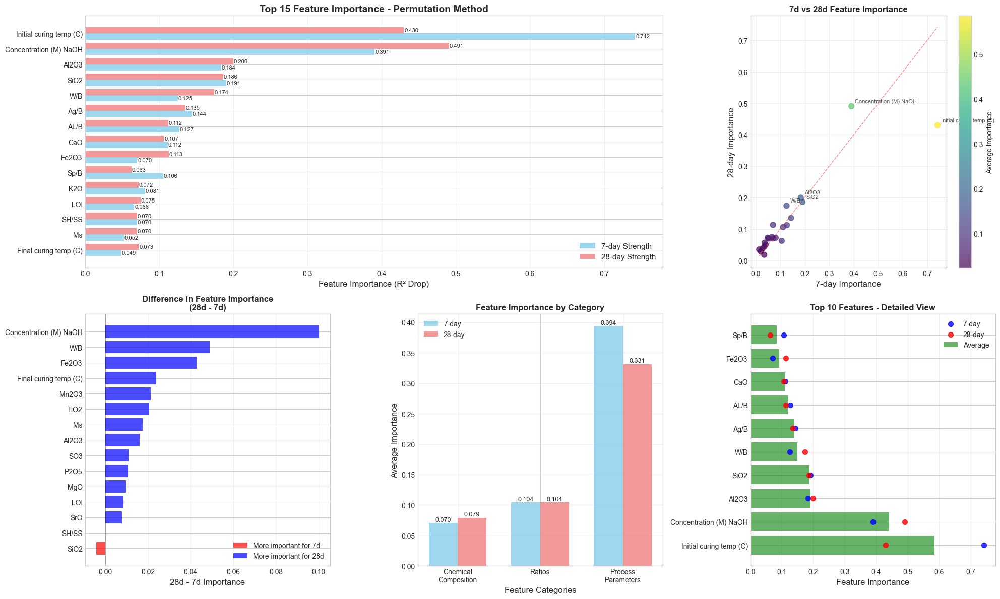


FEATURE IMPORTANCE ANALYSIS SUMMARY
Baseline Model Performance:
  R² (7-day):  0.8143
  R² (28-day): 0.7963

Top 10 Most Important Features (Average):
 1. Initial curing temp (C)   | 7d:  0.742 | 28d:  0.430 | Avg:  0.586
 2. Concentration (M) NaOH    | 7d:  0.391 | 28d:  0.491 | Avg:  0.441
 3. Al2O3                     | 7d:  0.184 | 28d:  0.200 | Avg:  0.192
 4. SiO2                      | 7d:  0.191 | 28d:  0.186 | Avg:  0.189
 5. W/B                       | 7d:  0.125 | 28d:  0.174 | Avg:  0.150
 6. Ag/B                      | 7d:  0.144 | 28d:  0.135 | Avg:  0.140
 7. AL/B                      | 7d:  0.127 | 28d:  0.112 | Avg:  0.120
 8. CaO                       | 7d:  0.112 | 28d:  0.107 | Avg:  0.109
 9. Fe2O3                     | 7d:  0.070 | 28d:  0.113 | Avg:  0.092
10. Sp/B                      | 7d:  0.106 | 28d:  0.063 | Avg:  0.084

Feature Category Averages:
  Chemical
Composition | 7d:  0.070 | 28d:  0.079
  Ratios               | 7d:  0.104 | 28d:  0.104
  Process


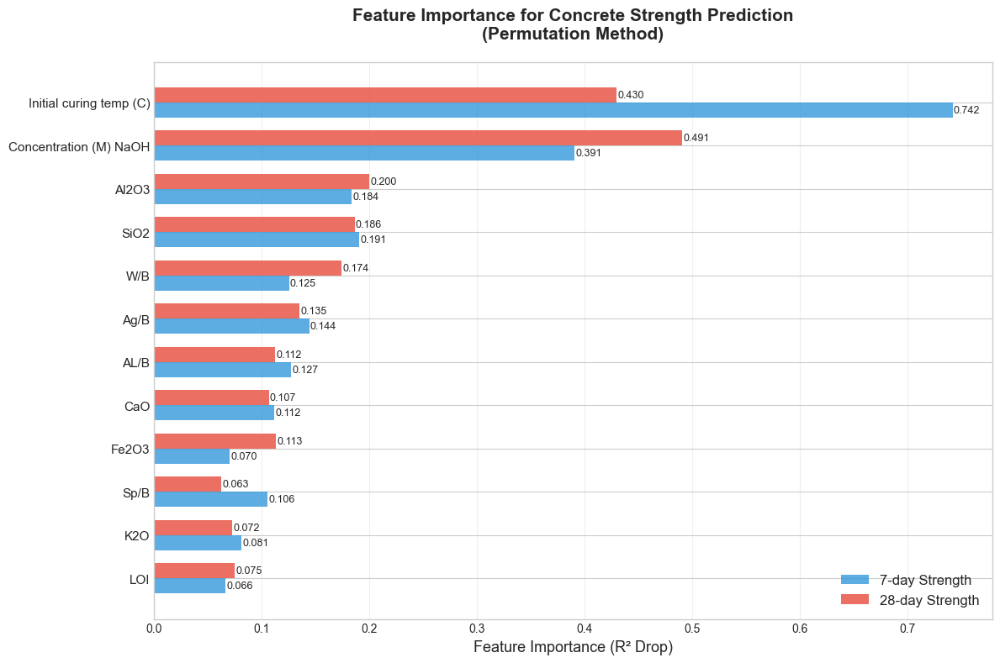

In [29]:

importance_results = run_feature_importance_analysis(
    model=model, 
    test_loader=test_loader, 
    t=t, 
    target_scaler=target_scaler, 
    device=device
)

plot_feature_importance_simple(importance_results, 'simple_feature_importance.png')


In [39]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import torch
from copy import deepcopy
import pandas as pd

def permutation_feature_importance(model, test_loader, t, feature_names, 
                                 target_scaler, num_samples=50, device='cpu'):
    """
    Calculate permutation feature importance for both 7d and 28d predictions.
    
    Args:
        model: Trained AGP model
        test_loader: DataLoader for test data
        t: Time points tensor [7.0, 28.0]
        feature_names: List of feature names
        target_scaler: Target scaler object with max_val attribute
        num_samples: Number of MC dropout samples
        device: Device to run on
    
    Returns:
        Dictionary with importance scores for 7d and 28d predictions
    """
    model.eval()
    
    # Get baseline predictions with MC dropout
    print("Computing baseline predictions...")
    baseline_mean, _, _, _ = mc_predict_with_uncertainty(
        model, test_loader, t, num_samples=num_samples
    )
    
    # Convert to original scale
    baseline_pred = baseline_mean * target_scaler.max_val
    
    # Get true values
    _, _, y_scaled = next(iter(test_loader))
    y_true = y_scaled.numpy() * target_scaler.max_val
    
    # Calculate baseline R² scores
    baseline_r2_7d = r2_score(y_true[:, 0], baseline_pred[:, 0])
    baseline_r2_28d = r2_score(y_true[:, 1], baseline_pred[:, 1])
    
    print(f"Baseline R² - 7d: {baseline_r2_7d:.4f}, 28d: {baseline_r2_28d:.4f}")
    
    # Initialize importance arrays
    n_features = len(feature_names)
    importance_7d = np.zeros(n_features)
    importance_28d = np.zeros(n_features)
    
    # Get original test data
    X_test, _, _ = next(iter(test_loader))
    X_test_np = X_test.numpy()
    
    print("Computing permutation importance for each feature...")
    
    for i, feature_name in enumerate(feature_names):
        print(f"Processing feature {i+1}/{n_features}: {feature_name}")
        
        # Create permuted version of the data
        X_permuted = X_test_np.copy()
        np.random.shuffle(X_permuted[:, i])  # Shuffle the i-th feature
        
        # Create new dataset with permuted feature
        from torch.utils.data import TensorDataset, DataLoader
        permuted_dataset = TensorDataset(
            torch.tensor(X_permuted, dtype=torch.float32),
            torch.zeros(X_permuted.shape[0], dtype=torch.float32),  # dummy
            torch.tensor(y_true / target_scaler.max_val, dtype=torch.float32)  # scaled back
        )
        permuted_loader = DataLoader(permuted_dataset, batch_size=len(permuted_dataset), shuffle=False)
        
        # Get predictions with permuted feature
        permuted_mean, _, _, _ = mc_predict_with_uncertainty(
            model, permuted_loader, t, num_samples=num_samples
        )
        
        # Convert to original scale
        permuted_pred = permuted_mean * target_scaler.max_val
        
        # Calculate R² with permuted feature
        permuted_r2_7d = r2_score(y_true[:, 0], permuted_pred[:, 0])
        permuted_r2_28d = r2_score(y_true[:, 1], permuted_pred[:, 1])
        
        # Importance is the decrease in R² score
        importance_7d[i] = baseline_r2_7d - permuted_r2_7d
        importance_28d[i] = baseline_r2_28d - permuted_r2_28d
        
        print(f"  R² drop - 7d: {importance_7d[i]:.4f}, 28d: {importance_28d[i]:.4f}")
    
    return {
        'feature_names': feature_names,
        'importance_7d': importance_7d,
        'importance_28d': importance_28d,
        'baseline_r2_7d': baseline_r2_7d,
        'baseline_r2_28d': baseline_r2_28d
    }

def plot_feature_importance(importance_results, save_path=None, top_n=15):
    """
    Create comprehensive feature importance plots.
    """
    # Set up plotting style
    sns.set_style("white")
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['DejaVu Serif']
    plt.rcParams['font.size'] = 15
    plt.rcParams['axes.grid'] = False
    sns.set_palette("husl")
    
    # Label mappings
    oxide_labels = {
        "SiO2": "SiO₂", "Al2O3": "Al₂O₃", "Fe2O3": "Fe₂O₃", "CaO": "CaO", "MgO": "MgO",
        "Na2O": "Na₂O", "K2O": "K₂O", "SO3": "SO₃", "TiO2": "TiO₂", "P2O5": "P₂O₅",
        "SrO": "SrO", "Mn2O3": "Mn₂O₃", "LOI": "LOI"
    }
    
    mix_labels = {
        "AL/B": "AL/B", "SH/SS": "SH/SS", "Ms": "Ms", "Ag/B": "Ag/B", "W/B": "W/B", "Sp/B": "Sp/B",
        "Initial curing temp (C)": "Initial Curing Temp (°C)",
        "Final curing temp (C)": "Final Curing Temp (°C)",
        "Concentration (M) NaOH": "NaOH Concentration (M)"
    }
    
    all_labels = {**oxide_labels, **mix_labels}
    
    feature_names = importance_results['feature_names']
    importance_7d = importance_results['importance_7d']
    importance_28d = importance_results['importance_28d']
    
    # Apply label mapping
    formatted_names = [all_labels.get(name, name) for name in feature_names]
    
    # Create DataFrame and sort by average importance (descending)
    df = pd.DataFrame({
        'Feature': formatted_names,
        '7-day Importance': importance_7d,
        '28-day Importance': importance_28d
    })
    df['Average Importance'] = (df['7-day Importance'] + df['28-day Importance']) / 2
    df = df.sort_values('Average Importance', ascending=False)
    
    # Take top N features
    df_top = df.head(top_n)
    
    # Create figure with square proportions
    fig = plt.figure(figsize=(20, 20))
    
    # Plot 1: Main horizontal bar chart for top features
    ax1 = plt.subplot(3, 3, (1, 3))
    y_pos = np.arange(len(df_top))
    
    bars_7d = ax1.barh(y_pos + 0.2, df_top['7-day Importance'], 0.4, 
                       label='7-day Strength', color='skyblue', alpha=0.8)
    bars_28d = ax1.barh(y_pos - 0.2, df_top['28-day Importance'], 0.4, 
                        label='28-day Strength', color='lightcoral', alpha=0.8)
    
    ax1.set_yticks(y_pos)
    ax1.set_yticklabels(df_top['Feature'], fontsize=12)
    ax1.set_xlabel('Feature Importance (R² Drop)', fontsize=14)
    ax1.set_title(f'Top {top_n} Feature Importance - Permutation Method', fontsize=16, fontweight='bold')
    ax1.legend(fontsize=12)
    
    for i, (bar_7d, bar_28d) in enumerate(zip(bars_7d, bars_28d)):
        if bar_7d.get_width() > 0.001:
            ax1.text(bar_7d.get_width() + 0.0005, bar_7d.get_y() + bar_7d.get_height()/2, 
                    f'{bar_7d.get_width():.3f}', ha='left', va='center', fontsize=10)
        if bar_28d.get_width() > 0.001:
            ax1.text(bar_28d.get_width() + 0.0005, bar_28d.get_y() + bar_28d.get_height()/2, 
                    f'{bar_28d.get_width():.3f}', ha='left', va='center', fontsize=10)
    
    # Plot 2: Scatter plot comparing 7d vs 28d importance
    ax2 = plt.subplot(3, 3, 4)
    scatter = ax2.scatter(df['7-day Importance'], df['28-day Importance'], 
                         alpha=0.7, s=80, c=df['Average Importance'], cmap='viridis')
    
    max_imp = max(df['7-day Importance'].max(), df['28-day Importance'].max())
    min_imp = min(df['7-day Importance'].min(), df['28-day Importance'].min())
    ax2.plot([min_imp, max_imp], [min_imp, max_imp], 'r--', alpha=0.5, linewidth=2)
    
    ax2.set_xlabel('7-day Importance', fontsize=14)
    ax2.set_ylabel('28-day Importance', fontsize=14)
    ax2.set_title('7d vs 28d Feature Importance', fontsize=14, fontweight='bold')
    plt.colorbar(scatter, ax=ax2, label='Average Importance')
    
    top_5 = df.head(5)
    for _, row in top_5.iterrows():
        ax2.annotate(row['Feature'], 
                    (row['7-day Importance'], row['28-day Importance']),
                    xytext=(5, 5), textcoords='offset points', 
                    fontsize=10, alpha=0.8)
    
    # Plot 3: Difference between 7d and 28d importance
    ax3 = plt.subplot(3, 3, 5)
    df['Importance Difference'] = df['28-day Importance'] - df['7-day Importance']
    df_diff = df.sort_values('Importance Difference', ascending=False).head(top_n)
    
    colors = ['red' if x < 0 else 'blue' for x in df_diff['Importance Difference']]
    ax3.barh(range(len(df_diff)), df_diff['Importance Difference'], color=colors, alpha=0.7)
    
    ax3.set_yticks(range(len(df_diff)))
    ax3.set_yticklabels(df_diff['Feature'], fontsize=12)
    ax3.set_xlabel('28d - 7d Importance', fontsize=14)
    ax3.set_title('Difference in Feature Importance\n(28d - 7d)', fontsize=14, fontweight='bold')
    ax3.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor='red', alpha=0.7, label='More important for 7d'),
                      Patch(facecolor='blue', alpha=0.7, label='More important for 28d')]
    ax3.legend(handles=legend_elements, fontsize=11, loc='lower right')
    
    # Plot 4: Feature categories analysis
    ax4 = plt.subplot(3, 3, 6)
    
    original_names = importance_results['feature_names']
    chemical_features = ['SiO2', 'Al2O3', 'Fe2O3', 'CaO', 'MgO', 'Na2O', 'K2O', 'SO3', 'TiO2', 'P2O5', 'SrO', 'Mn2O3', 'LOI']
    ratio_features = ['AL/B', 'SH/SS', 'Ms', 'Ag/B', 'W/B', 'Sp/B']
    process_features = ['Initial curing temp (C)', 'Final curing temp (C)', 'Concentration (M) NaOH']
    
    name_to_original = {formatted: original for formatted, original in zip(formatted_names, original_names)}
    
    categories = []
    avg_7d = []
    avg_28d = []
    
    for cat_name, features in [('Chemical\nComposition', chemical_features), 
                              ('Ratios', ratio_features), 
                              ('Process\nParameters', process_features)]:
        categories.append(cat_name)
        cat_mask = df['Feature'].apply(lambda x: name_to_original[x] in features)
        avg_7d.append(df[cat_mask]['7-day Importance'].mean())
        avg_28d.append(df[cat_mask]['28-day Importance'].mean())
    
    x = np.arange(len(categories))
    width = 0.35
    
    bars1 = ax4.bar(x - width/2, avg_7d, width, label='7-day', color='skyblue', alpha=0.8)
    bars2 = ax4.bar(x + width/2, avg_28d, width, label='28-day', color='lightcoral', alpha=0.8)
    
    ax4.set_xlabel('Feature Categories', fontsize=14)
    ax4.set_ylabel('Average Importance', fontsize=14)
    ax4.set_title('Feature Importance by Category', fontsize=14, fontweight='bold')
    ax4.set_xticks(x)
    ax4.set_xticklabels(categories, fontsize=12)
    ax4.legend(fontsize=12)
    
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax4.text(bar.get_x() + bar.get_width()/2., height + 0.0005,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=11)
    
    # Plot 5: Top 10 features detailed comparison
    ax5 = plt.subplot(3, 3, (7, 9))
    top_10 = df.head(10)
    
    y_pos = np.arange(len(top_10))
    ax5.barh(y_pos, top_10['Average Importance'], color='green', alpha=0.6, label='Average')
    ax5.scatter(top_10['7-day Importance'], y_pos, color='blue', s=80, alpha=0.8, label='7-day')
    ax5.scatter(top_10['28-day Importance'], y_pos, color='red', s=80, alpha=0.8, label='28-day')
    
    ax5.set_yticks(y_pos)
    ax5.set_yticklabels(top_10['Feature'], fontsize=12)
    ax5.set_xlabel('Feature Importance', fontsize=14)
    ax5.set_title('Top 10 Features - Detailed View', fontsize=14, fontweight='bold')
    ax5.legend(fontsize=12)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()
    
    # Print summary statistics
    print("\n" + "="*60)
    print("FEATURE IMPORTANCE ANALYSIS SUMMARY")
    print("="*60)
    print(f"Baseline Model Performance:")
    print(f"  R² (7-day):  {importance_results['baseline_r2_7d']:.4f}")
    print(f"  R² (28-day): {importance_results['baseline_r2_28d']:.4f}")
    
    print(f"\nTop 10 Most Important Features (Average):")
    top_10_avg = df.head(10)
    for i, (_, row) in enumerate(top_10_avg.iterrows(), 1):
        print(f"{i:2d}. {row['Feature']:25s} | 7d: {row['7-day Importance']:6.3f} | 28d: {row['28-day Importance']:6.3f} | Avg: {row['Average Importance']:6.3f}")
    
    print(f"\nFeature Category Averages:")
    for i, cat in enumerate(categories):
        print(f"  {cat:20s} | 7d: {avg_7d[i]:6.3f} | 28d: {avg_28d[i]:6.3f}")
    
    print("="*60)

def plot_feature_importance_simple(importance_results, save_path=None):
    """
    Create a simpler, cleaner version of the feature importance plot.
    """
    sns.set_style("white")
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['DejaVu Serif']
    plt.rcParams['font.size'] = 15
    plt.rcParams['axes.grid'] = False
    sns.set_palette("husl")
    
    oxide_labels = {
        "SiO2": "SiO₂", "Al2O3": "Al₂O₃", "Fe2O3": "Fe₂O₃", "CaO": "CaO", "MgO": "MgO",
        "Na2O": "Na₂O", "K2O": "K₂O", "SO3": "SO₃", "TiO2": "TiO₂", "P2O5": "P₂O₅",
        "SrO": "SrO", "Mn2O3": "Mn₂O₃", "LOI": "LOI"
    }
    
    mix_labels = {
        "AL/B": "AL/B", "SH/SS": "SH/SS", "Ms": "Ms", "Ag/B": "Ag/B", "W/B": "W/B", "Sp/B": "Sp/B",
        "Initial curing temp (C)": "Initial Curing Temp (°C)",
        "Final curing temp (C)": "Final Curing Temp (°C)",
        "Concentration (M) NaOH": "NaOH Concentration (M)"
    }
    
    all_labels = {**oxide_labels, **mix_labels}
    
    feature_names = importance_results['feature_names']
    importance_7d = importance_results['importance_7d']
    importance_28d = importance_results['importance_28d']
    
    formatted_names = [all_labels.get(name, name) for name in feature_names]
    
    df = pd.DataFrame({
        'Feature': formatted_names,
        '7-day': importance_7d,
        '28-day': importance_28d
    })
    df['Average'] = (df['7-day'] + df['28-day']) / 2
    df = df.sort_values('Average', ascending=False).head(12)
    
    fig, ax = plt.subplots(figsize=(12, 12))
    
    y_pos = np.arange(len(df))
    width = 0.35
    
    bars1 = ax.barh(y_pos + width/2, df['7-day'], width, 
                   label='7-day Strength', color='#3498db', alpha=0.8)
    bars2 = ax.barh(y_pos - width/2, df['28-day'], width, 
                   label='28-day Strength', color='#e74c3c', alpha=0.8)
    
    ax.set_yticks(y_pos)
    ax.set_yticklabels(df['Feature'], fontsize=13)
    ax.set_xlabel('Feature Importance (R² Drop)', fontsize=15)
    ax.set_title('Feature Importance for Concrete Strength Prediction\n(Permutation Method)', 
                fontsize=17, fontweight='bold', pad=20)
    ax.legend(fontsize=14)
    
    for bars in [bars1, bars2]:
        for bar in bars:
            width_val = bar.get_width()
            if width_val > 0.002:
                ax.text(width_val + 0.001, bar.get_y() + bar.get_height()/2, 
                       f'{width_val:.3f}', ha='left', va='center', fontsize=11)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()

def run_feature_importance_analysis(model, test_loader, t, target_scaler, device='cpu'):
    """
    Complete feature importance analysis workflow.
    """
    
    feature_names = [
        "SiO2", "Al2O3", "Fe2O3", "CaO", "MgO", "Na2O", "K2O", "SO3", 
        "TiO2", "P2O5", "SrO", "Mn2O3", "LOI", "AL/B", "SH/SS", "Ms", 
        "Ag/B", "W/B", "Sp/B", "Initial curing temp (C)", 
        "Final curing temp (C)", "Concentration (M) NaOH"
    ]
    
    print("Starting Feature Importance Analysis...")
    print("This may take several minutes depending on your dataset size and MC samples.")
    
    importance_results = permutation_feature_importance(
        model=model,
        test_loader=test_loader,
        t=t,
        feature_names=feature_names,
        target_scaler=target_scaler,
        num_samples=50,
        device=device
    )
    
    plot_feature_importance(
        importance_results, 
        save_path='feature_importance_analysis.png',
        top_n=15
    )
    
    return importance_results



Starting Feature Importance Analysis...
This may take several minutes depending on your dataset size and MC samples.
Computing baseline predictions...
Baseline R² - 7d: 0.8093, 28d: 0.7938
Computing permutation importance for each feature...
Processing feature 1/22: SiO2
  R² drop - 7d: 0.1428, 28d: 0.1517
Processing feature 2/22: Al2O3
  R² drop - 7d: 0.1947, 28d: 0.1731
Processing feature 3/22: Fe2O3
  R² drop - 7d: 0.1053, 28d: 0.1248
Processing feature 4/22: CaO
  R² drop - 7d: 0.1028, 28d: 0.0935
Processing feature 5/22: MgO
  R² drop - 7d: 0.0479, 28d: 0.0564
Processing feature 6/22: Na2O
  R² drop - 7d: 0.0276, 28d: 0.0187
Processing feature 7/22: K2O
  R² drop - 7d: 0.0824, 28d: 0.1037
Processing feature 8/22: SO3
  R² drop - 7d: 0.0647, 28d: 0.0644
Processing feature 9/22: TiO2
  R² drop - 7d: 0.0467, 28d: 0.0323
Processing feature 10/22: P2O5
  R² drop - 7d: 0.0297, 28d: 0.0257
Processing feature 11/22: SrO
  R² drop - 7d: 0.0377, 28d: 0.0295
Processing feature 12/22: Mn2O3
 

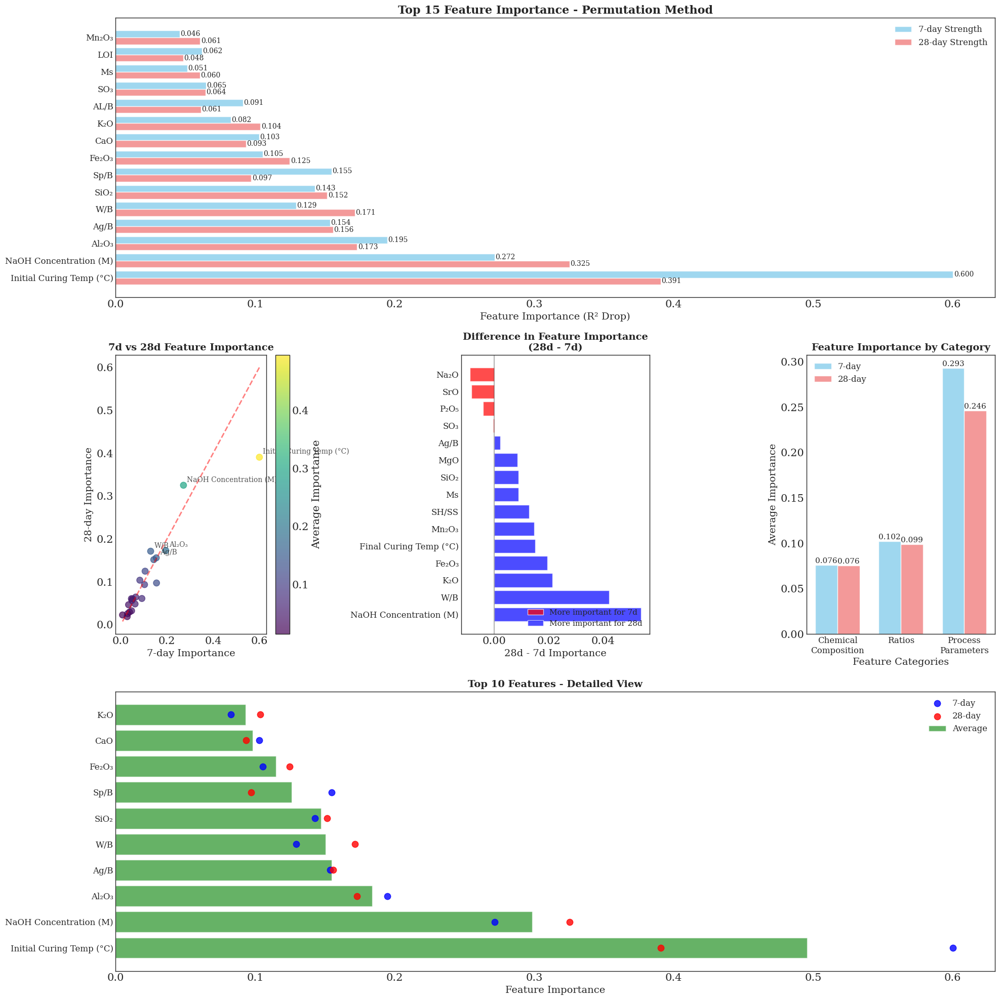


FEATURE IMPORTANCE ANALYSIS SUMMARY
Baseline Model Performance:
  R² (7-day):  0.8093
  R² (28-day): 0.7938

Top 10 Most Important Features (Average):
 1. Initial Curing Temp (°C)  | 7d:  0.600 | 28d:  0.391 | Avg:  0.495
 2. NaOH Concentration (M)    | 7d:  0.272 | 28d:  0.325 | Avg:  0.298
 3. Al₂O₃                     | 7d:  0.195 | 28d:  0.173 | Avg:  0.184
 4. Ag/B                      | 7d:  0.154 | 28d:  0.156 | Avg:  0.155
 5. W/B                       | 7d:  0.129 | 28d:  0.171 | Avg:  0.150
 6. SiO₂                      | 7d:  0.143 | 28d:  0.152 | Avg:  0.147
 7. Sp/B                      | 7d:  0.155 | 28d:  0.097 | Avg:  0.126
 8. Fe₂O₃                     | 7d:  0.105 | 28d:  0.125 | Avg:  0.115
 9. CaO                       | 7d:  0.103 | 28d:  0.093 | Avg:  0.098
10. K₂O                       | 7d:  0.082 | 28d:  0.104 | Avg:  0.093

Feature Category Averages:
  Chemical
Composition | 7d:  0.076 | 28d:  0.076
  Ratios               | 7d:  0.102 | 28d:  0.099
  Process


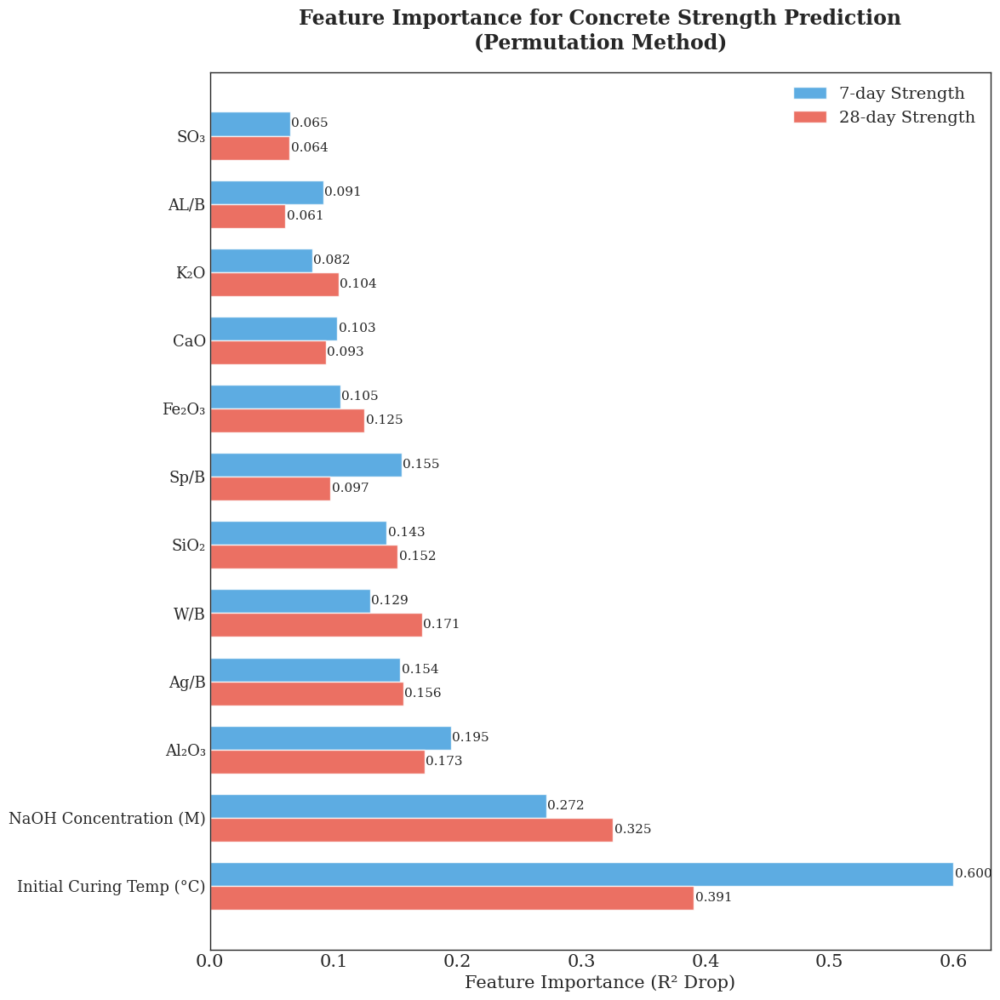

In [41]:

importance_results = run_feature_importance_analysis(
    model=model, 
    test_loader=test_loader, 
    t=t, 
    target_scaler=target_scaler, 
    device=device
)

plot_feature_importance_simple(importance_results, 'simple_feature_importance.png')


In [30]:
import sys
print("Using Python at:", sys.executable)

import numpy
print("NumPy version:", numpy.__version__)

import shap
print("SHAP version:", shap.__version__)


Using Python at: D:\myenv\Scripts\python.exe
NumPy version: 2.2.6
SHAP version: 0.48.0


In [44]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
import torch
from copy import deepcopy
import pandas as pd

def permutation_feature_importance(model, test_loader, t, feature_names, 
                                 target_scaler, num_samples=50, device='cpu'):
    """
    Calculate permutation feature importance for both 7d and 28d predictions.
    
    Args:
        model: Trained AGP model
        test_loader: DataLoader for test data
        t: Time points tensor [7.0, 28.0]
        feature_names: List of feature names
        target_scaler: Target scaler object with max_val attribute
        num_samples: Number of MC dropout samples
        device: Device to run on
    
    Returns:
        Dictionary with importance scores for 7d and 28d predictions
    """
    model.eval()
    
    # Get baseline predictions with MC dropout
    print("Computing baseline predictions...")
    baseline_mean, _, _, _ = mc_predict_with_uncertainty(
        model, test_loader, t, num_samples=num_samples
    )
    
    # Convert to original scale
    baseline_pred = baseline_mean * target_scaler.max_val
    
    # Get true values
    _, _, y_scaled = next(iter(test_loader))
    y_true = y_scaled.numpy() * target_scaler.max_val
    
    # Calculate baseline R² scores
    baseline_r2_7d = r2_score(y_true[:, 0], baseline_pred[:, 0])
    baseline_r2_28d = r2_score(y_true[:, 1], baseline_pred[:, 1])
    
    print(f"Baseline R² - 7d: {baseline_r2_7d:.4f}, 28d: {baseline_r2_28d:.4f}")
    
    # Initialize importance arrays
    n_features = len(feature_names)
    importance_7d = np.zeros(n_features)
    importance_28d = np.zeros(n_features)
    
    # Get original test data
    X_test, _, _ = next(iter(test_loader))
    X_test_np = X_test.numpy()
    
    print("Computing permutation importance for each feature...")
    
    for i, feature_name in enumerate(feature_names):
        print(f"Processing feature {i+1}/{n_features}: {feature_name}")
        
        # Create permuted version of the data
        X_permuted = X_test_np.copy()
        np.random.shuffle(X_permuted[:, i])  # Shuffle the i-th feature
        
        # Create new dataset with permuted feature
        from torch.utils.data import TensorDataset, DataLoader
        permuted_dataset = TensorDataset(
            torch.tensor(X_permuted, dtype=torch.float32),
            torch.zeros(X_permuted.shape[0], dtype=torch.float32),  # dummy
            torch.tensor(y_true / target_scaler.max_val, dtype=torch.float32)  # scaled back
        )
        permuted_loader = DataLoader(permuted_dataset, batch_size=len(permuted_dataset), shuffle=False)
        
        # Get predictions with permuted feature
        permuted_mean, _, _, _ = mc_predict_with_uncertainty(
            model, permuted_loader, t, num_samples=num_samples
        )
        
        # Convert to original scale
        permuted_pred = permuted_mean * target_scaler.max_val
        
        # Calculate R² with permuted feature
        permuted_r2_7d = r2_score(y_true[:, 0], permuted_pred[:, 0])
        permuted_r2_28d = r2_score(y_true[:, 1], permuted_pred[:, 1])
        
        # Importance is the decrease in R² score
        importance_7d[i] = baseline_r2_7d - permuted_r2_7d
        importance_28d[i] = baseline_r2_28d - permuted_r2_28d
        
        print(f"  R² drop - 7d: {importance_7d[i]:.4f}, 28d: {importance_28d[i]:.4f}")
    
    return {
        'feature_names': feature_names,
        'importance_7d': importance_7d,
        'importance_28d': importance_28d,
        'baseline_r2_7d': baseline_r2_7d,
        'baseline_r2_28d': baseline_r2_28d
    }

def plot_feature_importance(importance_results, save_path=None, top_n=15):
    """
    Create comprehensive feature importance plots.
    """
    # Set up plotting style
    sns.set_style("white")
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['DejaVu Serif']
    plt.rcParams['font.size'] = 15
    plt.rcParams['axes.grid'] = False
    sns.set_palette("husl")
    
    # Label mappings
    oxide_labels = {
        "SiO2": "SiO₂", "Al2O3": "Al₂O₃", "Fe2O3": "Fe₂O₃", "CaO": "CaO", "MgO": "MgO",
        "Na2O": "Na₂O", "K2O": "K₂O", "SO3": "SO₃", "TiO2": "TiO₂", "P2O5": "P₂O₅",
        "SrO": "SrO", "Mn2O3": "Mn₂O₃", "LOI": "LOI"
    }
    
    mix_labels = {
        "AL/B": "AL/B", "SH/SS": "SH/SS", "Ms": "Ms", "Ag/B": "Ag/B", "W/B": "W/B", "Sp/B": "Sp/B",
        "Initial curing temp (C)": "Initial Curing Temp (°C)",
        "Final curing temp (C)": "Final Curing Temp (°C)",
        "Concentration (M) NaOH": "NaOH Concentration (M)"
    }
    
    all_labels = {**oxide_labels, **mix_labels}
    
    feature_names = importance_results['feature_names']
    importance_7d = importance_results['importance_7d']
    importance_28d = importance_results['importance_28d']
    
    # Apply label mapping
    formatted_names = [all_labels.get(name, name) for name in feature_names]
    
    # Create DataFrame and sort by average importance (descending)
    df = pd.DataFrame({
        'Feature': formatted_names,
        '7-day Importance': importance_7d,
        '28-day Importance': importance_28d
    })
    df['Average Importance'] = (df['7-day Importance'] + df['28-day Importance']) / 2
    df = df.sort_values('Average Importance', ascending=False)
    
    # Take top N features
    df_top = df.head(top_n)
    
    # Plot 1: Main horizontal bar chart for top features (DESCENDING ORDER)
    df_top_desc = df_top.iloc[::-1]  # Reverse for descending on y-axis
    
    fig1, ax1 = plt.subplots(figsize=(12, 12))
    y_pos = np.arange(len(df_top_desc))
    
    bars_7d = ax1.barh(y_pos + 0.2, df_top_desc['7-day Importance'], 0.4, 
                       label='7-day Strength', color='skyblue', alpha=0.8)
    bars_28d = ax1.barh(y_pos - 0.2, df_top_desc['28-day Importance'], 0.4, 
                        label='28-day Strength', color='lightcoral', alpha=0.8)
    
    ax1.set_yticks(y_pos)
    ax1.set_yticklabels(df_top_desc['Feature'], fontsize=12)
    ax1.set_xlabel('Feature Importance (R² Drop)', fontsize=14)
    ax1.set_title(f'Top {top_n} Feature Importance - Permutation Method', fontsize=16, fontweight='bold')
    ax1.legend(fontsize=12)
    
    for i, (bar_7d, bar_28d) in enumerate(zip(bars_7d, bars_28d)):
        if bar_7d.get_width() > 0.001:
            ax1.text(bar_7d.get_width() + 0.0005, bar_7d.get_y() + bar_7d.get_height()/2, 
                    f'{bar_7d.get_width():.3f}', ha='left', va='center', fontsize=10)
        if bar_28d.get_width() > 0.001:
            ax1.text(bar_28d.get_width() + 0.0005, bar_28d.get_y() + bar_28d.get_height()/2, 
                    f'{bar_28d.get_width():.3f}', ha='left', va='center', fontsize=10)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path.replace('.png', '_main.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    # Plot 2: Scatter plot comparing 7d vs 28d importance
    fig2, ax2 = plt.subplots(figsize=(12, 12))
    scatter = ax2.scatter(df['7-day Importance'], df['28-day Importance'], 
                         alpha=0.7, s=80, c=df['Average Importance'], cmap='viridis')
    
    max_imp = max(df['7-day Importance'].max(), df['28-day Importance'].max())
    min_imp = min(df['7-day Importance'].min(), df['28-day Importance'].min())
    ax2.plot([min_imp, max_imp], [min_imp, max_imp], 'r--', alpha=0.5, linewidth=2)
    
    ax2.set_xlabel('7-day Importance', fontsize=14)
    ax2.set_ylabel('28-day Importance', fontsize=14)
    ax2.set_title('7d vs 28d Feature Importance', fontsize=16, fontweight='bold')
    plt.colorbar(scatter, ax=ax2, label='Average Importance')
    
    top_5 = df.head(5)
    for _, row in top_5.iterrows():
        ax2.annotate(row['Feature'], 
                    (row['7-day Importance'], row['28-day Importance']),
                    xytext=(5, 5), textcoords='offset points', 
                    fontsize=10, alpha=0.8)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path.replace('.png', '_scatter.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    # Plot 3: Difference between 7d and 28d importance
    fig3, ax3 = plt.subplots(figsize=(12, 12))
    df['Importance Difference'] = df['28-day Importance'] - df['7-day Importance']
    df_diff = df.sort_values('Importance Difference', ascending=True).head(top_n)  # Most negative first
    df_diff_desc = df_diff.iloc[::-1]  # Reverse for descending display
    
    colors = ['red' if x < 0 else 'blue' for x in df_diff_desc['Importance Difference']]
    ax3.barh(range(len(df_diff_desc)), df_diff_desc['Importance Difference'], color=colors, alpha=0.7)
    
    ax3.set_yticks(range(len(df_diff_desc)))
    ax3.set_yticklabels(df_diff_desc['Feature'], fontsize=12)
    ax3.set_xlabel('28d - 7d Importance', fontsize=14)
    ax3.set_title('Difference in Feature Importance (28d - 7d)', fontsize=16, fontweight='bold')
    ax3.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor='red', alpha=0.7, label='More important for 7d'),
                      Patch(facecolor='blue', alpha=0.7, label='More important for 28d')]
    ax3.legend(handles=legend_elements, fontsize=12, loc='lower right')
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path.replace('.png', '_difference.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    # Plot 4: Feature categories analysis
    fig4, ax4 = plt.subplots(figsize=(12, 12))
    
    original_names = importance_results['feature_names']
    chemical_features = ['SiO2', 'Al2O3', 'Fe2O3', 'CaO', 'MgO', 'Na2O', 'K2O', 'SO3', 'TiO2', 'P2O5', 'SrO', 'Mn2O3', 'LOI']
    ratio_features = ['AL/B', 'SH/SS', 'Ms', 'Ag/B', 'W/B', 'Sp/B']
    process_features = ['Initial curing temp (C)', 'Final curing temp (C)', 'Concentration (M) NaOH']
    
    name_to_original = {formatted: original for formatted, original in zip(formatted_names, original_names)}
    
    categories = []
    avg_7d = []
    avg_28d = []
    
    for cat_name, features in [('Chemical\nComposition', chemical_features), 
                              ('Ratios', ratio_features), 
                              ('Process\nParameters', process_features)]:
        categories.append(cat_name)
        cat_mask = df['Feature'].apply(lambda x: name_to_original[x] in features)
        avg_7d.append(df[cat_mask]['7-day Importance'].mean())
        avg_28d.append(df[cat_mask]['28-day Importance'].mean())
    
    x = np.arange(len(categories))
    width = 0.35
    
    bars1 = ax4.bar(x - width/2, avg_7d, width, label='7-day', color='skyblue', alpha=0.8)
    bars2 = ax4.bar(x + width/2, avg_28d, width, label='28-day', color='lightcoral', alpha=0.8)
    
    ax4.set_xlabel('Feature Categories', fontsize=14)
    ax4.set_ylabel('Average Importance', fontsize=14)
    ax4.set_title('Feature Importance by Category', fontsize=16, fontweight='bold')
    ax4.set_xticks(x)
    ax4.set_xticklabels(categories, fontsize=12)
    ax4.legend(fontsize=12)
    
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            ax4.text(bar.get_x() + bar.get_width()/2., height + 0.0005,
                    f'{height:.3f}', ha='center', va='bottom', fontsize=11)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path.replace('.png', '_categories.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    # Plot 5: Top 10 features detailed comparison
    fig5, ax5 = plt.subplots(figsize=(12, 12))
    top_10 = df.head(10)
    top_10_desc = top_10.iloc[::-1]  # Reverse for descending display
    
    y_pos = np.arange(len(top_10_desc))
    ax5.barh(y_pos, top_10_desc['Average Importance'], color='green', alpha=0.6, label='Average')
    ax5.scatter(top_10_desc['7-day Importance'], y_pos, color='blue', s=80, alpha=0.8, label='7-day')
    ax5.scatter(top_10_desc['28-day Importance'], y_pos, color='red', s=80, alpha=0.8, label='28-day')
    
    ax5.set_yticks(y_pos)
    ax5.set_yticklabels(top_10_desc['Feature'], fontsize=12)
    ax5.set_xlabel('Feature Importance', fontsize=14)
    ax5.set_title('Top 10 Features - Detailed View', fontsize=16, fontweight='bold')
    ax5.legend(fontsize=12)
    
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path.replace('.png', '_top10.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print summary statistics
    print("\n" + "="*60)
    print("FEATURE IMPORTANCE ANALYSIS SUMMARY")
    print("="*60)
    print(f"Baseline Model Performance:")
    print(f"  R² (7-day):  {importance_results['baseline_r2_7d']:.4f}")
    print(f"  R² (28-day): {importance_results['baseline_r2_28d']:.4f}")
    
    print(f"\nTop 10 Most Important Features (Average):")
    top_10_avg = df.head(10)
    for i, (_, row) in enumerate(top_10_avg.iterrows(), 1):
        print(f"{i:2d}. {row['Feature']:25s} | 7d: {row['7-day Importance']:6.3f} | 28d: {row['28-day Importance']:6.3f} | Avg: {row['Average Importance']:6.3f}")
    
    print(f"\nFeature Category Averages:")
    for i, cat in enumerate(categories):
        print(f"  {cat:20s} | 7d: {avg_7d[i]:6.3f} | 28d: {avg_28d[i]:6.3f}")
    
    print("="*60)

def plot_feature_importance_simple(importance_results, save_path=None):
    """
    Create a simpler, cleaner version of the feature importance plot.
    """
    sns.set_style("white")
    plt.rcParams['font.family'] = 'serif'
    plt.rcParams['font.serif'] = ['DejaVu Serif']
    plt.rcParams['font.size'] = 15
    plt.rcParams['axes.grid'] = False
    sns.set_palette("husl")
    
    oxide_labels = {
        "SiO2": "SiO₂", "Al2O3": "Al₂O₃", "Fe2O3": "Fe₂O₃", "CaO": "CaO", "MgO": "MgO",
        "Na2O": "Na₂O", "K2O": "K₂O", "SO3": "SO₃", "TiO2": "TiO₂", "P2O5": "P₂O₅",
        "SrO": "SrO", "Mn2O3": "Mn₂O₃", "LOI": "LOI"
    }
    
    mix_labels = {
        "AL/B": "AL/B", "SH/SS": "SH/SS", "Ms": "Ms", "Ag/B": "Ag/B", "W/B": "W/B", "Sp/B": "Sp/B",
        "Initial curing temp (C)": "Initial Curing Temp (°C)",
        "Final curing temp (C)": "Final Curing Temp (°C)",
        "Concentration (M) NaOH": "NaOH Concentration (M)"
    }
    
    all_labels = {**oxide_labels, **mix_labels}
    
    feature_names = importance_results['feature_names']
    importance_7d = importance_results['importance_7d']
    importance_28d = importance_results['importance_28d']
    
    formatted_names = [all_labels.get(name, name) for name in feature_names]
    
    df = pd.DataFrame({
        'Feature': formatted_names,
        '7-day': importance_7d,
        '28-day': importance_28d
    })
    df['Average'] = (df['7-day'] + df['28-day']) / 2
    df = df.sort_values('Average', ascending=False).head(12)
    
    fig, ax = plt.subplots(figsize=(12, 12))
    
    y_pos = np.arange(len(df))
    width = 0.35
    
    bars1 = ax.barh(y_pos + width/2, df['7-day'], width, 
                   label='7-day Strength', color='#3498db', alpha=0.8)
    bars2 = ax.barh(y_pos - width/2, df['28-day'], width, 
                   label='28-day Strength', color='#e74c3c', alpha=0.8)
    
    ax.set_yticks(y_pos)
    ax.set_yticklabels(df['Feature'], fontsize=13)
    ax.set_xlabel('Feature Importance (R² Drop)', fontsize=15)
    ax.set_title('Feature Importance for Concrete Strength Prediction\n(Permutation Method)', 
                fontsize=17, fontweight='bold', pad=20)
    ax.legend(fontsize=14)
    
    for bars in [bars1, bars2]:
        for bar in bars:
            width_val = bar.get_width()
            if width_val > 0.002:
                ax.text(width_val + 0.001, bar.get_y() + bar.get_height()/2, 
                       f'{width_val:.3f}', ha='left', va='center', fontsize=11)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    
    plt.show()

def run_feature_importance_analysis(model, test_loader, t, target_scaler, device='cpu'):
    """
    Complete feature importance analysis workflow.
    """
    
    feature_names = [
        "SiO2", "Al2O3", "Fe2O3", "CaO", "MgO", "Na2O", "K2O", "SO3", 
        "TiO2", "P2O5", "SrO", "Mn2O3", "LOI", "AL/B", "SH/SS", "Ms", 
        "Ag/B", "W/B", "Sp/B", "Initial curing temp (C)", 
        "Final curing temp (C)", "Concentration (M) NaOH"
    ]
    
    print("Starting Feature Importance Analysis...")
    print("This may take several minutes depending on your dataset size and MC samples.")
    
    importance_results = permutation_feature_importance(
        model=model,
        test_loader=test_loader,
        t=t,
        feature_names=feature_names,
        target_scaler=target_scaler,
        num_samples=50,
        device=device
    )
    
    plot_feature_importance(
        importance_results, 
        save_path='feature_importance_analysis.png',
        top_n=15
    )
    
    return importance_results



Starting Feature Importance Analysis...
This may take several minutes depending on your dataset size and MC samples.
Computing baseline predictions...
Baseline R² - 7d: 0.8118, 28d: 0.7989
Computing permutation importance for each feature...
Processing feature 1/22: SiO2
  R² drop - 7d: 0.2107, 28d: 0.2128
Processing feature 2/22: Al2O3
  R² drop - 7d: 0.1447, 28d: 0.1480
Processing feature 3/22: Fe2O3
  R² drop - 7d: 0.0691, 28d: 0.1050
Processing feature 4/22: CaO
  R² drop - 7d: 0.0634, 28d: 0.0846
Processing feature 5/22: MgO
  R² drop - 7d: 0.0351, 28d: 0.0404
Processing feature 6/22: Na2O
  R² drop - 7d: 0.0200, 28d: 0.0124
Processing feature 7/22: K2O
  R² drop - 7d: 0.0745, 28d: 0.0891
Processing feature 8/22: SO3
  R² drop - 7d: 0.0857, 28d: 0.0965
Processing feature 9/22: TiO2
  R² drop - 7d: 0.0753, 28d: 0.0683
Processing feature 10/22: P2O5
  R² drop - 7d: 0.1005, 28d: 0.0897
Processing feature 11/22: SrO
  R² drop - 7d: 0.0162, 28d: 0.0486
Processing feature 12/22: Mn2O3
 

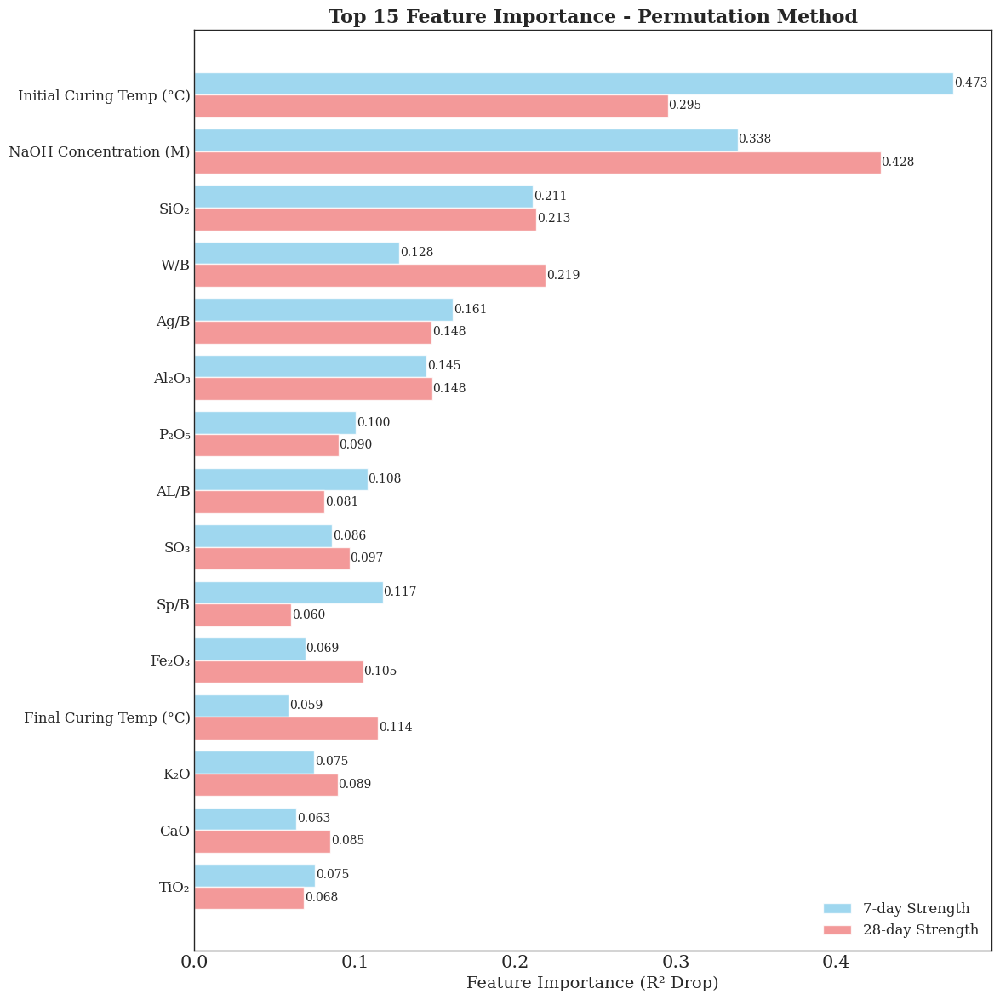

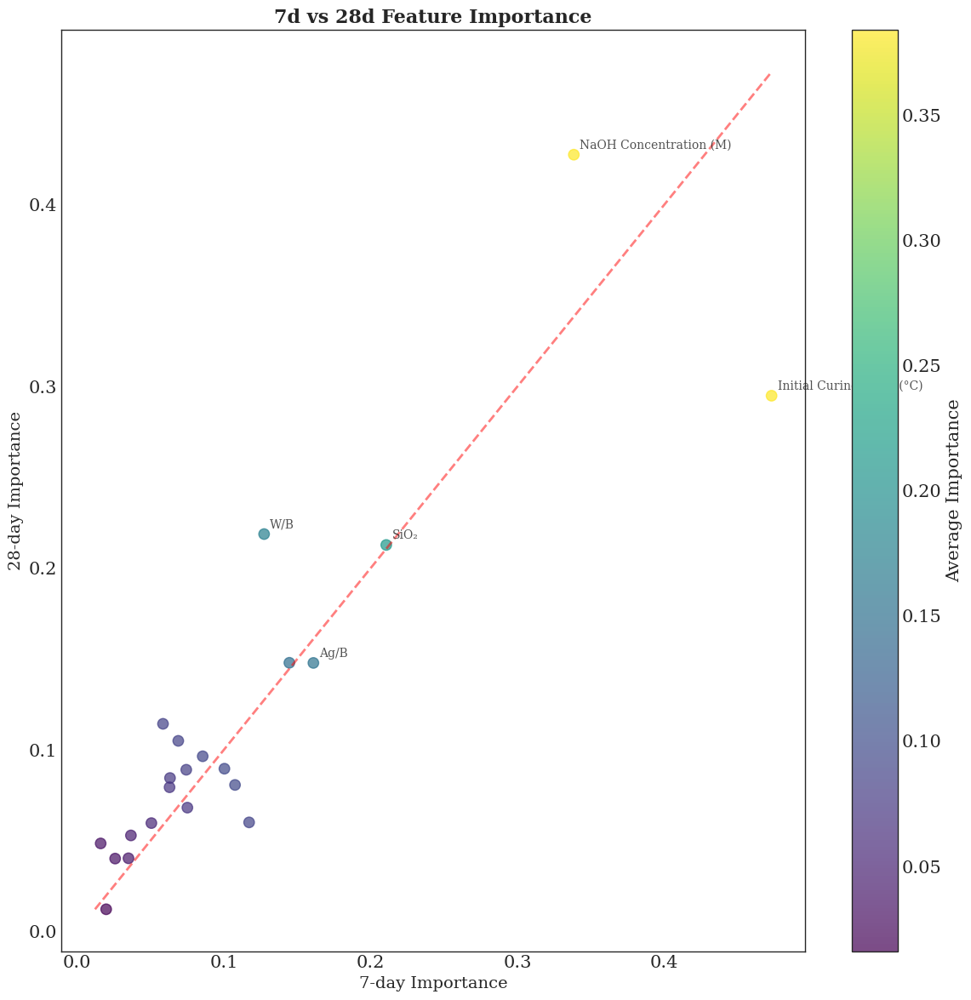

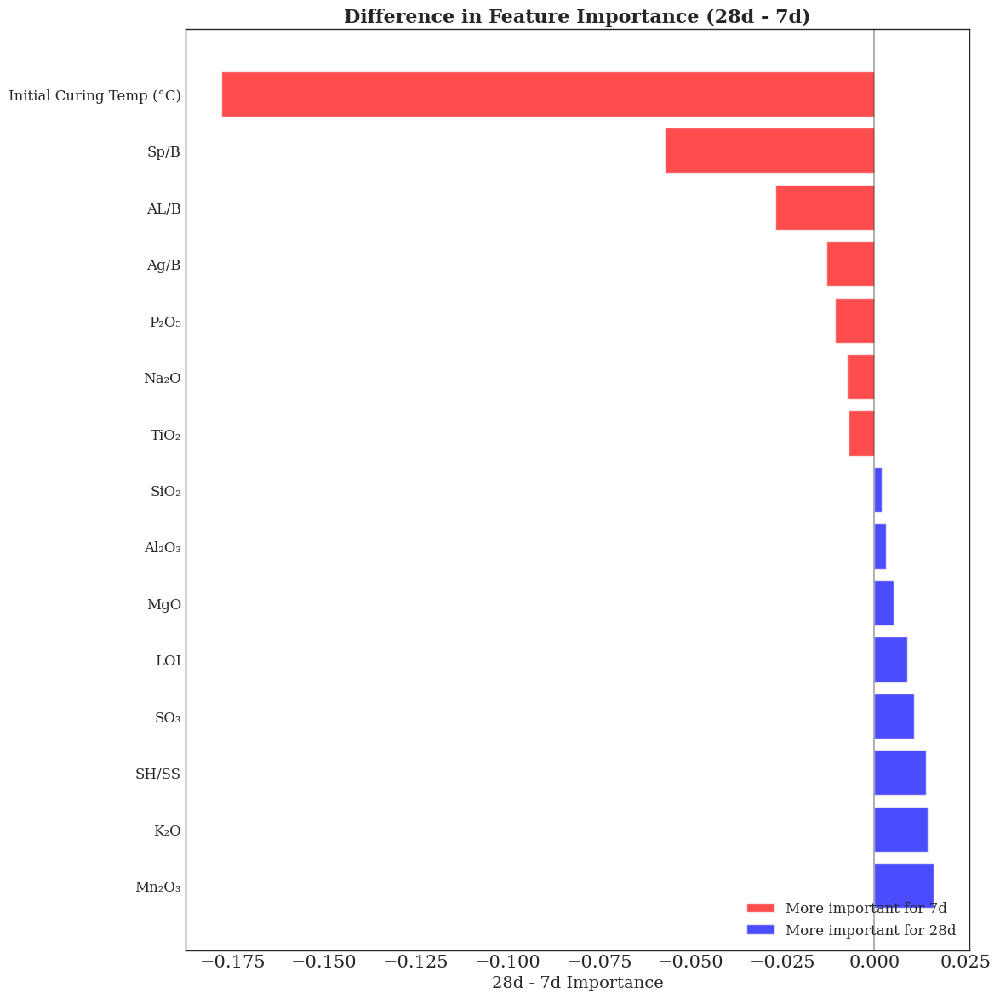

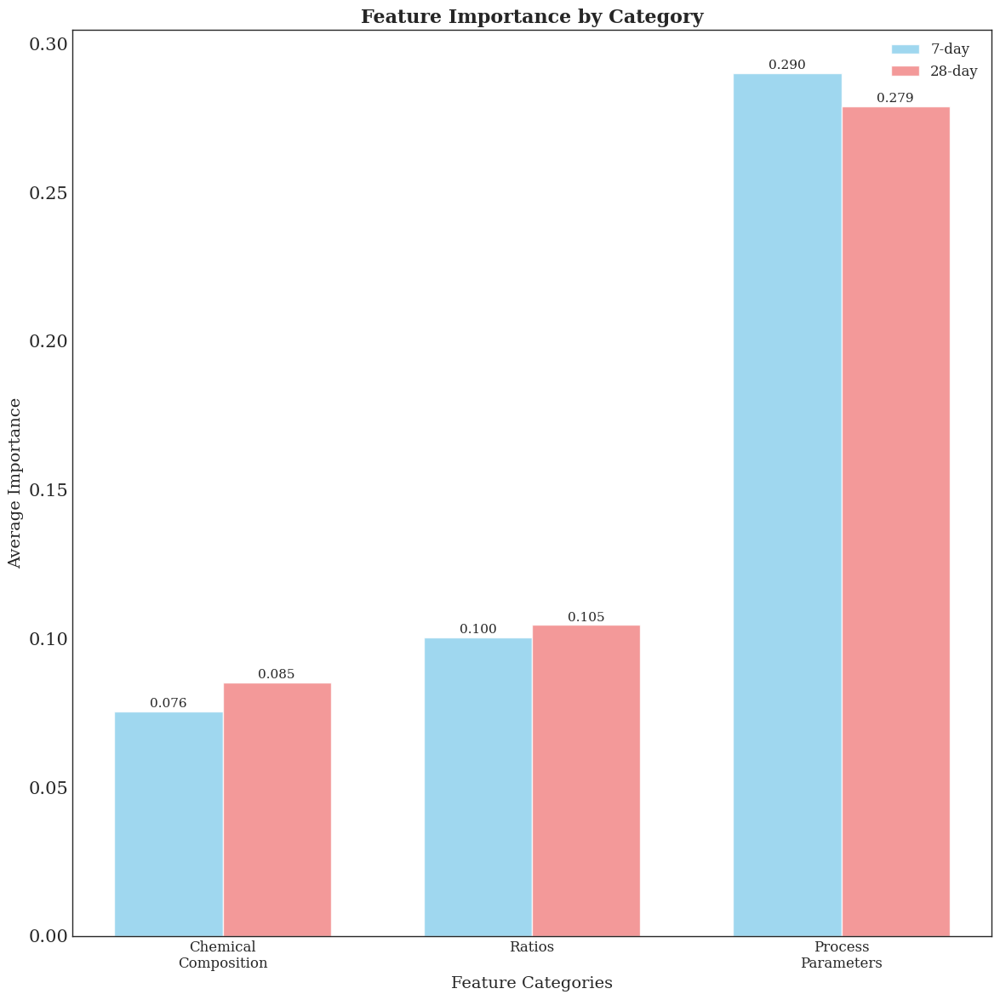

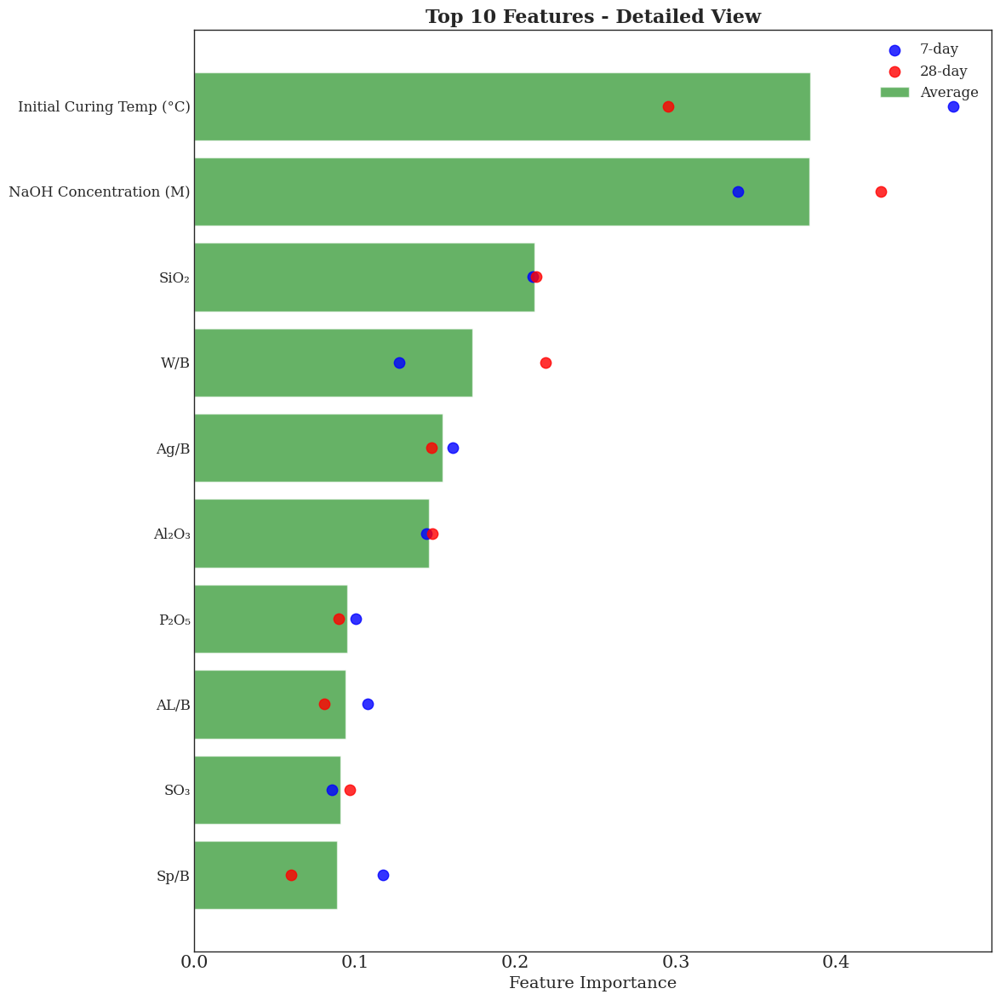


FEATURE IMPORTANCE ANALYSIS SUMMARY
Baseline Model Performance:
  R² (7-day):  0.8118
  R² (28-day): 0.7989

Top 10 Most Important Features (Average):
 1. Initial Curing Temp (°C)  | 7d:  0.473 | 28d:  0.295 | Avg:  0.384
 2. NaOH Concentration (M)    | 7d:  0.338 | 28d:  0.428 | Avg:  0.383
 3. SiO₂                      | 7d:  0.211 | 28d:  0.213 | Avg:  0.212
 4. W/B                       | 7d:  0.128 | 28d:  0.219 | Avg:  0.173
 5. Ag/B                      | 7d:  0.161 | 28d:  0.148 | Avg:  0.154
 6. Al₂O₃                     | 7d:  0.145 | 28d:  0.148 | Avg:  0.146
 7. P₂O₅                      | 7d:  0.100 | 28d:  0.090 | Avg:  0.095
 8. AL/B                      | 7d:  0.108 | 28d:  0.081 | Avg:  0.094
 9. SO₃                       | 7d:  0.086 | 28d:  0.097 | Avg:  0.091
10. Sp/B                      | 7d:  0.117 | 28d:  0.060 | Avg:  0.089

Feature Category Averages:
  Chemical
Composition | 7d:  0.076 | 28d:  0.085
  Ratios               | 7d:  0.100 | 28d:  0.105
  Process


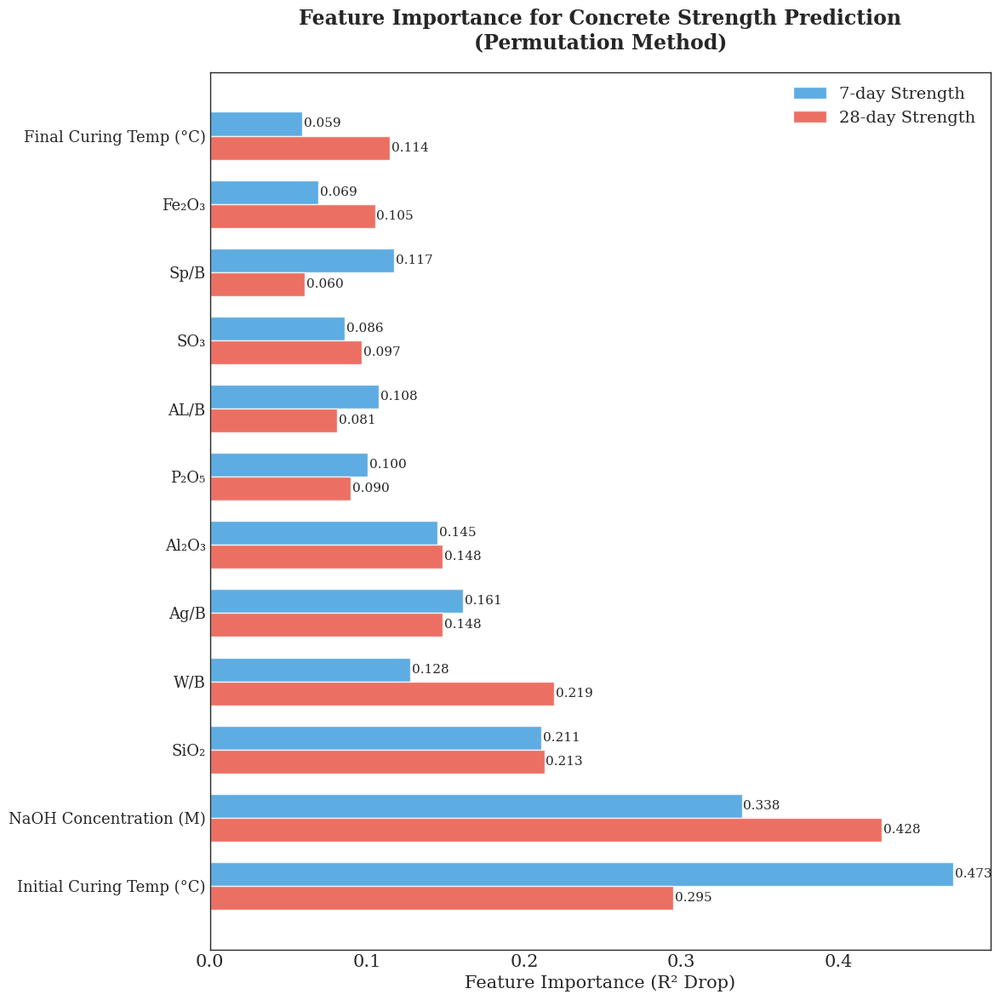

In [45]:
importance_results = run_feature_importance_analysis(
    model=model, 
    test_loader=test_loader, 
    t=t, 
    target_scaler=target_scaler, 
    device=device
)


plot_feature_importance_simple(importance_results, 'simple_feature_importance.png')


In [31]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
import shap
from sklearn.metrics import r2_score
import seaborn as sns
from matplotlib.patches import Rectangle
import warnings
warnings.filterwarnings('ignore')

class SHAPAnalyzer:
    """
    SHAP Analysis wrapper for concrete strength prediction model.
    """
    
    def __init__(self, model, feature_names, target_scaler, device='cpu'):
        self.model = model
        self.feature_names = feature_names
        self.target_scaler = target_scaler
        self.device = device
        self.t = torch.tensor([7.0, 28.0], dtype=torch.float32).to(device)
        
    def predict_function(self, X):
        """
        Prediction function for SHAP that returns predictions for both 7d and 28d.
        X: numpy array of shape (n_samples, n_features)
        Returns: numpy array of shape (n_samples, 2) - [7d_pred, 28d_pred]
        """
        self.model.eval()
        
        with torch.no_grad():
            X_tensor = torch.tensor(X, dtype=torch.float32).to(self.device)
            
            # Get model predictions (similar to your MC dropout approach but deterministic for SHAP)
            theta1, theta2, l, sigma_f, sigma_n = self.model(X_tensor)
            
            # Compute mean predictions
            log_t = torch.log(self.t + 1e-6)
            predictions = torch.zeros(X_tensor.shape[0], 2).to(self.device)
            
            for i in range(X_tensor.shape[0]):
                mean_pred = theta1[i] * log_t + theta2[i]
                predictions[i] = mean_pred
            
            # Convert back to original scale
            predictions_scaled = predictions.cpu().numpy() * self.target_scaler.max_val
            
        return predictions_scaled
    
    def analyze(self, X_background, X_test, max_evals=1000, sample_size=100):
        """
        Perform comprehensive SHAP analysis.
        
        Args:
            X_background: Background dataset for SHAP explainer (training data)
            X_test: Test dataset to explain
            max_evals: Maximum evaluations for SHAP
            sample_size: Sample size for analysis (to manage computation)
        """
        print("Initializing SHAP analysis...")
        
        # Sample data if too large
        if len(X_background) > sample_size:
            bg_indices = np.random.choice(len(X_background), sample_size, replace=False)
            X_bg_sample = X_background[bg_indices]
        else:
            X_bg_sample = X_background
            
        if len(X_test) > sample_size:
            test_indices = np.random.choice(len(X_test), sample_size, replace=False)
            X_test_sample = X_test[test_indices]
        else:
            X_test_sample = X_test
            test_indices = np.arange(len(X_test))
        
        print(f"Using {len(X_bg_sample)} background samples and {len(X_test_sample)} test samples")
        
        # Initialize SHAP explainer
        print("Creating SHAP explainer (this may take a few minutes)...")
        explainer = shap.Explainer(self.predict_function, X_bg_sample, max_evals=max_evals)
        
        # Calculate SHAP values
        print("Computing SHAP values...")
        shap_values = explainer(X_test_sample)
        
        # Get actual predictions
        predictions = self.predict_function(X_test_sample)
        
        self.shap_values = shap_values
        self.X_test_sample = X_test_sample
        self.predictions = predictions
        self.test_indices = test_indices
        
        return shap_values, X_test_sample, predictions
    
    def plot_summary(self, save_path=None):
        """Create SHAP summary plots for both 7d and 28d predictions."""
        
        fig, axes = plt.subplots(2, 2, figsize=(20, 12))
        
        # Summary plot for 7d predictions
        plt.sca(axes[0, 0])
        shap.summary_plot(self.shap_values[:, :, 0], self.X_test_sample, 
                         feature_names=self.feature_names, show=False, max_display=15)
        plt.title('SHAP Summary - 7-day Strength Prediction', fontsize=14, fontweight='bold')
        
        # Summary plot for 28d predictions
        plt.sca(axes[0, 1])
        shap.summary_plot(self.shap_values[:, :, 1], self.X_test_sample, 
                         feature_names=self.feature_names, show=False, max_display=15)
        plt.title('SHAP Summary - 28-day Strength Prediction', fontsize=14, fontweight='bold')
        
        # Bar plot for 7d
        plt.sca(axes[1, 0])
        shap.summary_plot(self.shap_values[:, :, 0], self.X_test_sample, 
                         feature_names=self.feature_names, plot_type="bar", 
                         show=False, max_display=15)
        plt.title('Feature Importance - 7-day Strength', fontsize=14, fontweight='bold')
        
        # Bar plot for 28d
        plt.sca(axes[1, 1])
        shap.summary_plot(self.shap_values[:, :, 1], self.X_test_sample, 
                         feature_names=self.feature_names, plot_type="bar", 
                         show=False, max_display=15)
        plt.title('Feature Importance - 28-day Strength', fontsize=14, fontweight='bold')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        
        plt.show()
    
    def plot_waterfall_examples(self, n_examples=4, save_path=None):
        """Create waterfall plots for individual predictions."""
        
        fig, axes = plt.subplots(n_examples, 2, figsize=(16, 4*n_examples))
        
        for i in range(min(n_examples, len(self.X_test_sample))):
            # 7d waterfall
            plt.sca(axes[i, 0])
            shap.waterfall_plot(self.shap_values[i, :, 0], show=False)
            plt.title(f'Sample {i+1}: 7-day Prediction = {self.predictions[i, 0]:.1f} MPa', 
                     fontsize=12, fontweight='bold')
            
            # 28d waterfall
            plt.sca(axes[i, 1])
            shap.waterfall_plot(self.shap_values[i, :, 1], show=False)
            plt.title(f'Sample {i+1}: 28-day Prediction = {self.predictions[i, 1]:.1f} MPa', 
                     fontsize=12, fontweight='bold')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        
        plt.show()
    
    def plot_feature_comparison(self, save_path=None):
        """Compare feature importance between 7d and 28d predictions."""
        
        # Calculate mean absolute SHAP values for each feature
        mean_shap_7d = np.mean(np.abs(self.shap_values[:, :, 0].values), axis=0)
        mean_shap_28d = np.mean(np.abs(self.shap_values[:, :, 1].values), axis=0)
        
        # Create DataFrame
        df = pd.DataFrame({
            'Feature': self.feature_names,
            '7-day SHAP': mean_shap_7d,
            '28-day SHAP': mean_shap_28d
        })
        df['Average SHAP'] = (df['7-day SHAP'] + df['28-day SHAP']) / 2
        df['Difference'] = df['28-day SHAP'] - df['7-day SHAP']
        df = df.sort_values('Average SHAP', ascending=True)
        
        fig, axes = plt.subplots(2, 2, figsize=(18, 12))
        
        # Plot 1: Comparison bar chart
        ax1 = axes[0, 0]
        top_15 = df.tail(15)
        y_pos = np.arange(len(top_15))
        
        bars1 = ax1.barh(y_pos - 0.2, top_15['7-day SHAP'], 0.4, 
                        label='7-day', color='skyblue', alpha=0.8)
        bars2 = ax1.barh(y_pos + 0.2, top_15['28-day SHAP'], 0.4, 
                        label='28-day', color='lightcoral', alpha=0.8)
        
        ax1.set_yticks(y_pos)
        ax1.set_yticklabels(top_15['Feature'], fontsize=10)
        ax1.set_xlabel('Mean |SHAP Value|', fontsize=12)
        ax1.set_title('Top 15 Features: SHAP Importance Comparison', fontsize=14, fontweight='bold')
        ax1.legend()
        ax1.grid(axis='x', alpha=0.3)
        
        # Plot 2: Scatter plot
        ax2 = axes[0, 1]
        scatter = ax2.scatter(df['7-day SHAP'], df['28-day SHAP'], 
                             alpha=0.7, s=60, c=df['Average SHAP'], cmap='viridis')
        
        # Add diagonal line
        max_val = max(df['7-day SHAP'].max(), df['28-day SHAP'].max())
        ax2.plot([0, max_val], [0, max_val], 'r--', alpha=0.5)
        
        ax2.set_xlabel('7-day SHAP Importance', fontsize=12)
        ax2.set_ylabel('28-day SHAP Importance', fontsize=12)
        ax2.set_title('7d vs 28d SHAP Importance', fontsize=14, fontweight='bold')
        plt.colorbar(scatter, ax=ax2, label='Average SHAP')
        
        # Annotate top features
        top_5 = df.nlargest(5, 'Average SHAP')
        for _, row in top_5.iterrows():
            ax2.annotate(row['Feature'], (row['7-day SHAP'], row['28-day SHAP']),
                        xytext=(5, 5), textcoords='offset points', fontsize=8)
        
        # Plot 3: Difference analysis
        ax3 = axes[1, 0]
        df_diff = df.sort_values('Difference', ascending=True).tail(15)
        colors = ['red' if x < 0 else 'blue' for x in df_diff['Difference']]
        
        ax3.barh(range(len(df_diff)), df_diff['Difference'], color=colors, alpha=0.7)
        ax3.set_yticks(range(len(df_diff)))
        ax3.set_yticklabels(df_diff['Feature'], fontsize=10)
        ax3.set_xlabel('28d - 7d SHAP Importance', fontsize=12)
        ax3.set_title('Difference in SHAP Importance\n(28d - 7d)', fontsize=14, fontweight='bold')
        ax3.axvline(x=0, color='black', linestyle='-', alpha=0.3)
        
        # Plot 4: Category analysis
        ax4 = axes[1, 1]
        
        # Define categories
        chemical_features = ['SiO2', 'Al2O3', 'Fe2O3', 'CaO', 'MgO', 'Na2O', 'K2O', 
                           'SO3', 'TiO2', 'P2O5', 'SrO', 'Mn2O3', 'LOI']
        ratio_features = ['AL/B', 'SH/SS', 'Ms', 'Ag/B', 'W/B', 'Sp/B']
        process_features = ['Initial curing temp (C)', 'Final curing temp (C)', 
                          'Concentration (M) NaOH']
        
        categories = []
        avg_7d = []
        avg_28d = []
        
        for cat_name, features in [('Chemical\nComposition', chemical_features), 
                                  ('Ratios', ratio_features), 
                                  ('Process\nParameters', process_features)]:
            mask = df['Feature'].isin(features)
            categories.append(cat_name)
            avg_7d.append(df[mask]['7-day SHAP'].mean())
            avg_28d.append(df[mask]['28-day SHAP'].mean())
        
        x = np.arange(len(categories))
        width = 0.35
        
        ax4.bar(x - width/2, avg_7d, width, label='7-day', color='skyblue', alpha=0.8)
        ax4.bar(x + width/2, avg_28d, width, label='28-day', color='lightcoral', alpha=0.8)
        
        ax4.set_xlabel('Feature Categories', fontsize=12)
        ax4.set_ylabel('Average SHAP Importance', fontsize=12)
        ax4.set_title('SHAP Importance by Category', fontsize=14, fontweight='bold')
        ax4.set_xticks(x)
        ax4.set_xticklabels(categories)
        ax4.legend()
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        
        plt.show()
        
        return df
    
    def plot_dependence_plots(self, top_features=6, save_path=None):
        """Create SHAP dependence plots for top features."""
        
        # Get top features by average importance
        mean_shap_7d = np.mean(np.abs(self.shap_values[:, :, 0].values), axis=0)
        mean_shap_28d = np.mean(np.abs(self.shap_values[:, :, 1].values), axis=0)
        avg_importance = (mean_shap_7d + mean_shap_28d) / 2
        
        top_indices = np.argsort(avg_importance)[-top_features:]
        top_feature_names = [self.feature_names[i] for i in top_indices]
        
        fig, axes = plt.subplots(top_features, 2, figsize=(16, 4*top_features))
        
        for i, (feat_idx, feat_name) in enumerate(zip(top_indices, top_feature_names)):
            # 7d dependence plot
            plt.sca(axes[i, 0])
            shap.dependence_plot(feat_idx, self.shap_values[:, :, 0].values, 
                               self.X_test_sample, feature_names=self.feature_names,
                               show=False)
            plt.title(f'{feat_name} - 7-day Strength', fontsize=12, fontweight='bold')
            
            # 28d dependence plot
            plt.sca(axes[i, 1])
            shap.dependence_plot(feat_idx, self.shap_values[:, :, 1].values, 
                               self.X_test_sample, feature_names=self.feature_names,
                               show=False)
            plt.title(f'{feat_name} - 28-day Strength', fontsize=12, fontweight='bold')
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
        
        plt.show()
    
    def generate_report(self):
        """Generate a comprehensive SHAP analysis report."""
        
        print("\n" + "="*70)
        print("COMPREHENSIVE SHAP ANALYSIS REPORT")
        print("="*70)
        
        # Calculate feature importance statistics
        mean_shap_7d = np.mean(np.abs(self.shap_values[:, :, 0].values), axis=0)
        mean_shap_28d = np.mean(np.abs(self.shap_values[:, :, 1].values), axis=0)
        
        df = pd.DataFrame({
            'Feature': self.feature_names,
            '7-day SHAP': mean_shap_7d,
            '28-day SHAP': mean_shap_28d
        })
        df['Average SHAP'] = (df['7-day SHAP'] + df['28-day SHAP']) / 2
        df['Difference'] = df['28-day SHAP'] - df['7-day SHAP']
        
        print(f"\nDataset Information:")
        print(f"  Number of samples analyzed: {len(self.X_test_sample)}")
        print(f"  Number of features: {len(self.feature_names)}")
        print(f"  Average 7-day prediction: {self.predictions[:, 0].mean():.1f} ± {self.predictions[:, 0].std():.1f} MPa")
        print(f"  Average 28-day prediction: {self.predictions[:, 1].mean():.1f} ± {self.predictions[:, 1].std():.1f} MPa")
        
        print(f"\nTop 10 Most Important Features (by average SHAP):")
        top_10 = df.nlargest(10, 'Average SHAP')
        for i, (_, row) in enumerate(top_10.iterrows(), 1):
            print(f"{i:2d}. {row['Feature']:25s} | 7d: {row['7-day SHAP']:6.3f} | 28d: {row['28-day SHAP']:6.3f} | Avg: {row['Average SHAP']:6.3f}")
        
        print(f"\nFeatures More Important for 7-day Strength:")
        early_important = df[df['Difference'] < -0.5].sort_values('Difference').head(5)
        for _, row in early_important.iterrows():
            print(f"  {row['Feature']:25s} | Difference: {row['Difference']:6.3f}")
        
        print(f"\nFeatures More Important for 28-day Strength:")
        late_important = df[df['Difference'] > 0.5].sort_values('Difference', ascending=False).head(5)
        for _, row in late_important.iterrows():
            print(f"  {row['Feature']:25s} | Difference: {row['Difference']:6.3f}")
        
        # Category analysis
        chemical_features = ['SiO2', 'Al2O3', 'Fe2O3', 'CaO', 'MgO', 'Na2O', 'K2O', 
                           'SO3', 'TiO2', 'P2O5', 'SrO', 'Mn2O3', 'LOI']
        ratio_features = ['AL/B', 'SH/SS', 'Ms', 'Ag/B', 'W/B', 'Sp/B']
        process_features = ['Initial curing temp (C)', 'Final curing temp (C)', 
                          'Concentration (M) NaOH']
        
        print(f"\nFeature Category Analysis:")
        for cat_name, features in [('Chemical Composition', chemical_features), 
                                  ('Ratios', ratio_features), 
                                  ('Process Parameters', process_features)]:
            mask = df['Feature'].isin(features)
            avg_7d = df[mask]['7-day SHAP'].mean()
            avg_28d = df[mask]['28-day SHAP'].mean()
            print(f"  {cat_name:20s} | 7d: {avg_7d:6.3f} | 28d: {avg_28d:6.3f}")
        
        print("="*70)

def run_complete_shap_analysis(model, X_train, X_test, target_scaler, device='cpu'):
    """
    Run complete SHAP analysis workflow.
    
    Args:
        model: Trained AGP model
        X_train: Training features (numpy array)
        X_test: Test features (numpy array)
        target_scaler: Target scaler with max_val attribute
        device: Device to run on
    
    Usage:
        # After training your model
        run_complete_shap_analysis(model, X_train_scaled, X_test_scaled, target_scaler, device)
    """
    
    feature_names = [
        "SiO2", "Al2O3", "Fe2O3", "CaO", "MgO", "Na2O", "K2O", "SO3", 
        "TiO2", "P2O5", "SrO", "Mn2O3", "LOI", "AL/B", "SH/SS", "Ms", 
        "Ag/B", "W/B", "Sp/B", "Initial curing temp (C)", 
        "Final curing temp (C)", "Concentration (M) NaOH"
    ]
    
    print("Initializing SHAP Analyzer...")
    analyzer = SHAPAnalyzer(model, feature_names, target_scaler, device)
    
    print("Running SHAP analysis (this may take 5-10 minutes)...")
    shap_values, X_test_sample, predictions = analyzer.analyze(
        X_train, X_test, max_evals=1000, sample_size=100
    )
    
    print("Creating visualizations...")
    
    # 1. Summary plots
    print("1. Creating summary plots...")
    analyzer.plot_summary('shap_summary.png')
    
    # 2. Waterfall examples
    print("2. Creating waterfall plots...")
    analyzer.plot_waterfall_examples(n_examples=4, save_path='shap_waterfall.png')
    
    # 3. Feature comparison
    print("3. Creating feature comparison plots...")
    df_results = analyzer.plot_feature_comparison('shap_comparison.png')
    
    # 4. Dependence plots
    print("4. Creating dependence plots...")
    analyzer.plot_dependence_plots(top_features=6, save_path='shap_dependence.png')
    
    # 5. Generate report
    print("5. Generating analysis report...")
    analyzer.generate_report()
    
    print("\nSHAP Analysis Complete!")
    print("Generated files:")
    print("  - shap_summary.png: Overview of feature importance")
    print("  - shap_waterfall.png: Individual prediction explanations")
    print("  - shap_comparison.png: 7d vs 28d comparison")
    print("  - shap_dependence.png: Feature interaction effects")
    
    return analyzer, df_results

# Quick analysis for specific samples
def explain_specific_predictions(analyzer, sample_indices=[0, 1, 2]):
    """
    Provide detailed explanations for specific predictions.
    """
    print("\n" + "="*60)
    print("DETAILED PREDICTION EXPLANATIONS")
    print("="*60)
    
    for idx in sample_indices:
        if idx >= len(analyzer.X_test_sample):
            continue
            
        print(f"\nSample {idx + 1}:")
        print(f"  Predicted 7-day strength:  {analyzer.predictions[idx, 0]:.1f} MPa")
        print(f"  Predicted 28-day strength: {analyzer.predictions[idx, 1]:.1f} MPa")
        
        # Get top contributing features for this sample
        shap_7d = analyzer.shap_values[idx, :, 0].values
        shap_28d = analyzer.shap_values[idx, :, 1].values
        
        print(f"  Top positive contributors (7d):")
        top_pos_7d = np.argsort(shap_7d)[-3:][::-1]
        for i, feat_idx in enumerate(top_pos_7d):
            if shap_7d[feat_idx] > 0:
                print(f"    {i+1}. {analyzer.feature_names[feat_idx]:25s}: +{shap_7d[feat_idx]:.3f}")
        
        print(f"  Top negative contributors (7d):")
        top_neg_7d = np.argsort(shap_7d)[:3]
        for i, feat_idx in enumerate(top_neg_7d):
            if shap_7d[feat_idx] < 0:
                print(f"    {i+1}. {analyzer.feature_names[feat_idx]:25s}: {shap_7d[feat_idx]:.3f}")
        
        print(f"  Top positive contributors (28d):")
        top_pos_28d = np.argsort(shap_28d)[-3:][::-1]
        for i, feat_idx in enumerate(top_pos_28d):
            if shap_28d[feat_idx] > 0:
                print(f"    {i+1}. {analyzer.feature_names[feat_idx]:25s}: +{shap_28d[feat_idx]:.3f}")



Initializing SHAP Analyzer...
Running SHAP analysis (this may take 5-10 minutes)...
Initializing SHAP analysis...
Using 100 background samples and 100 test samples
Creating SHAP explainer (this may take a few minutes)...
Computing SHAP values...


PermutationExplainer explainer: 101it [10:19,  6.19s/it]                                                               


Creating visualizations...
1. Creating summary plots...


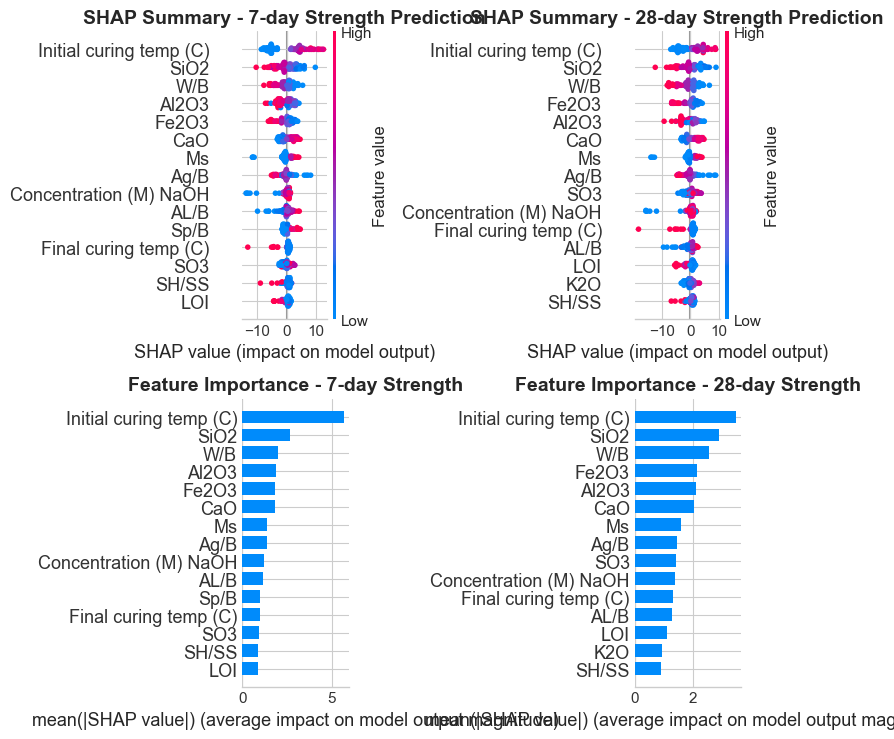

2. Creating waterfall plots...


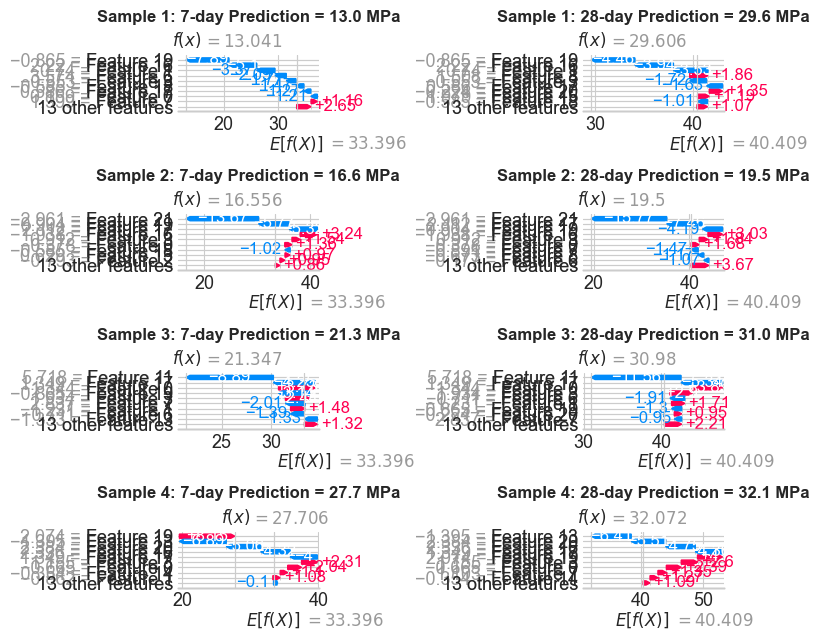

3. Creating feature comparison plots...


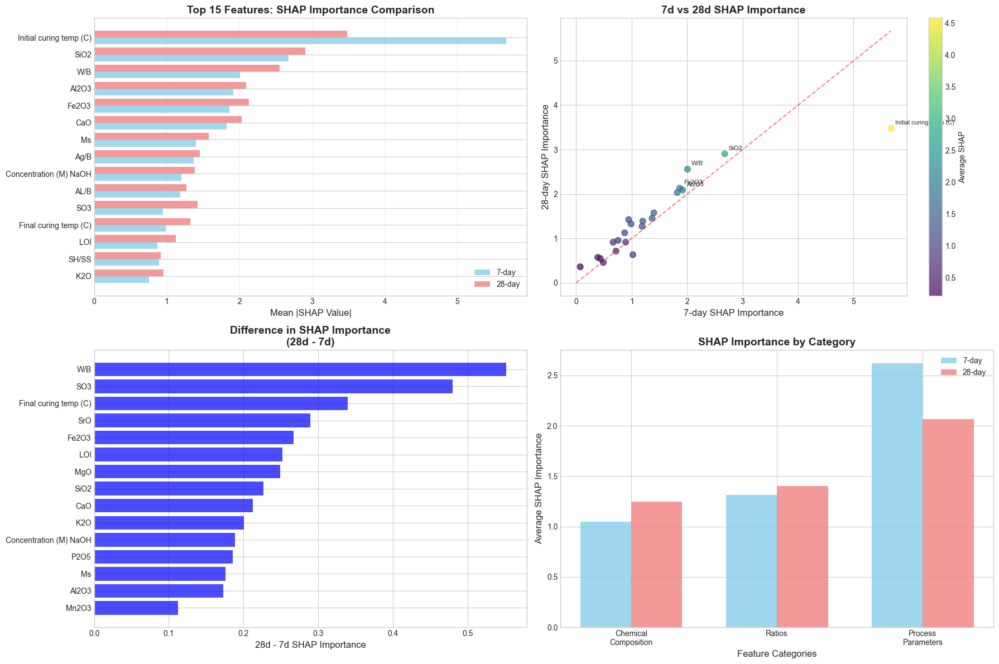

4. Creating dependence plots...


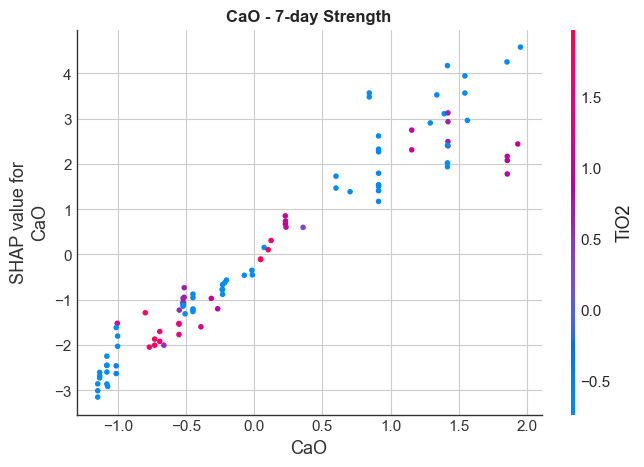

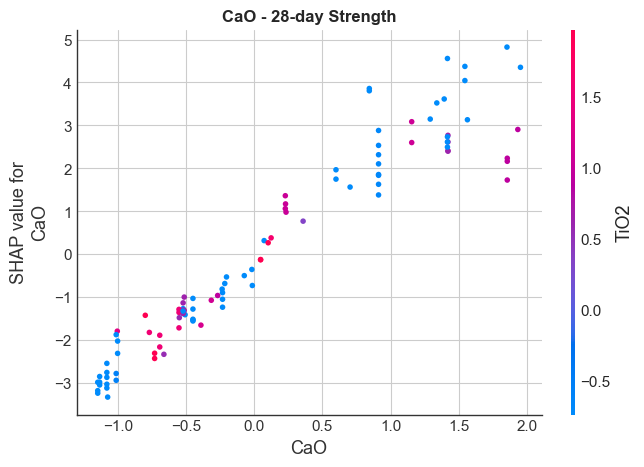

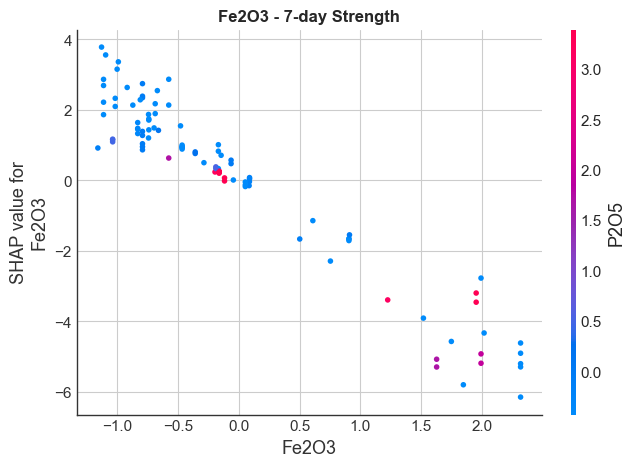

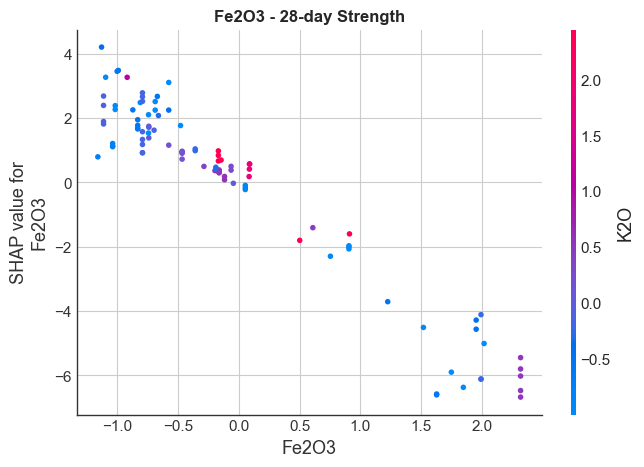

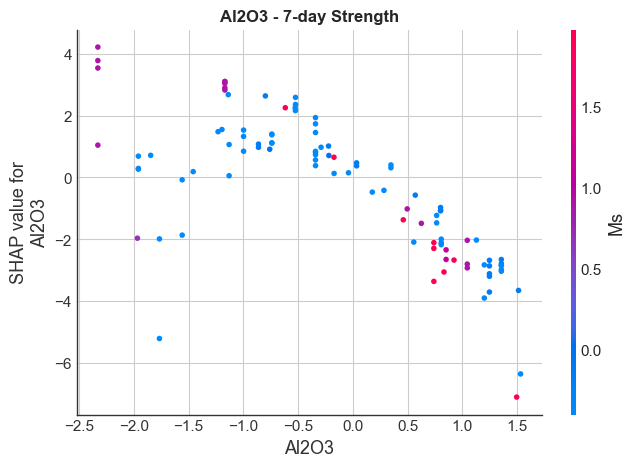

...

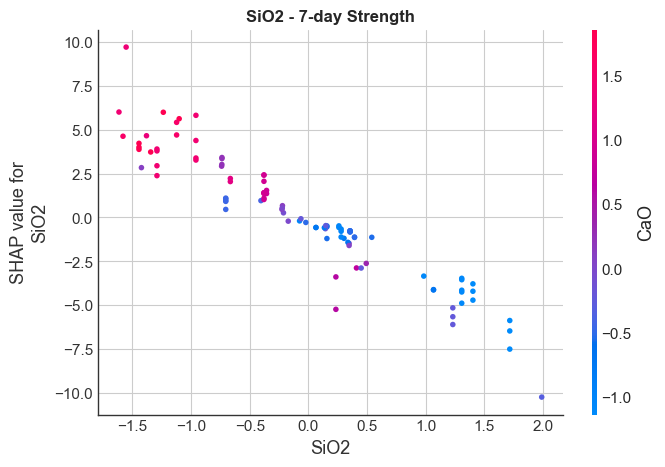

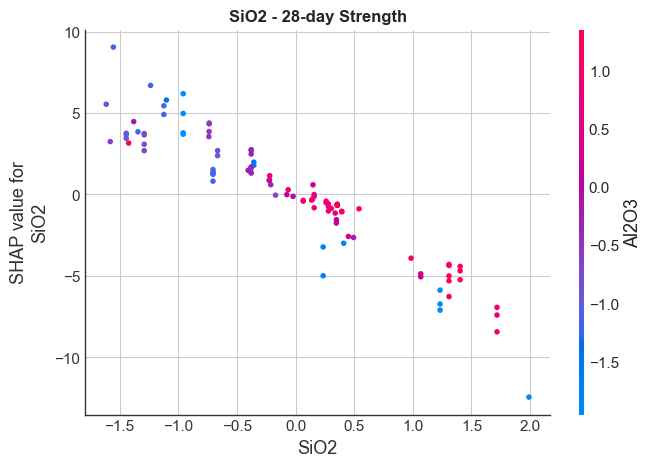

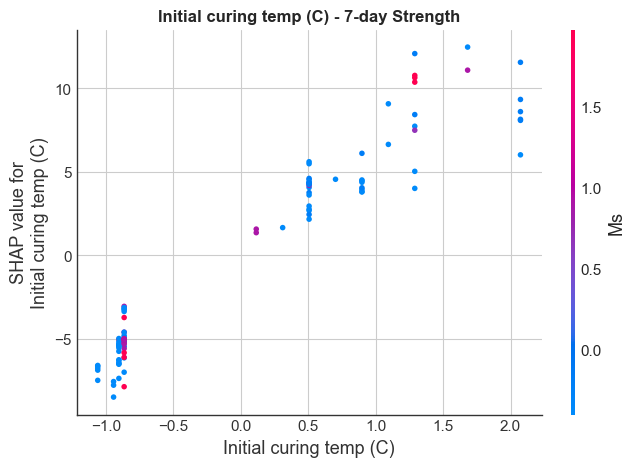

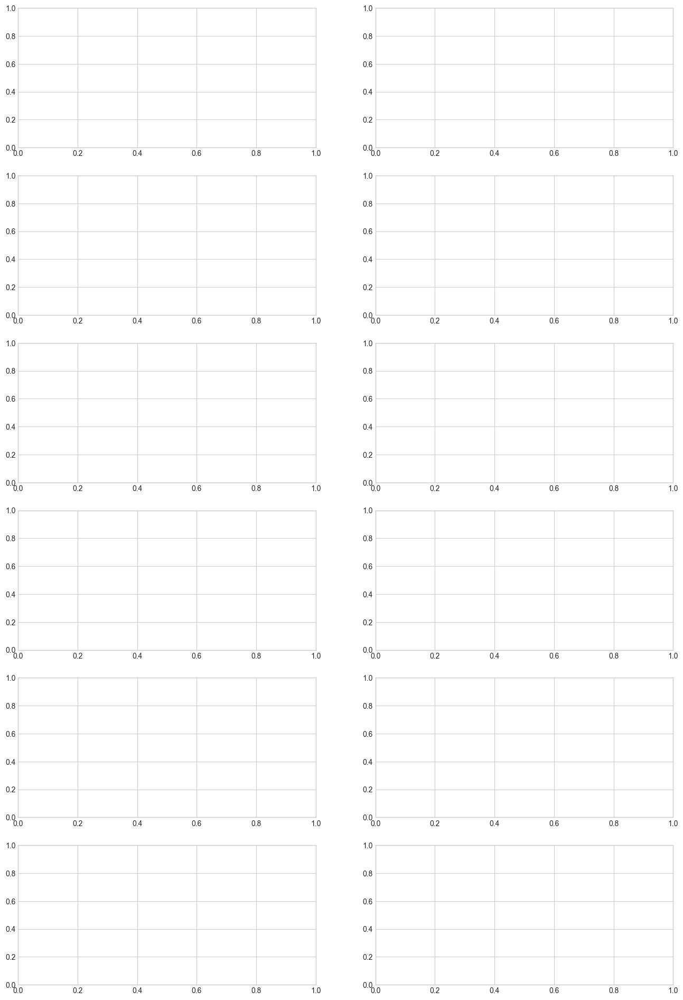

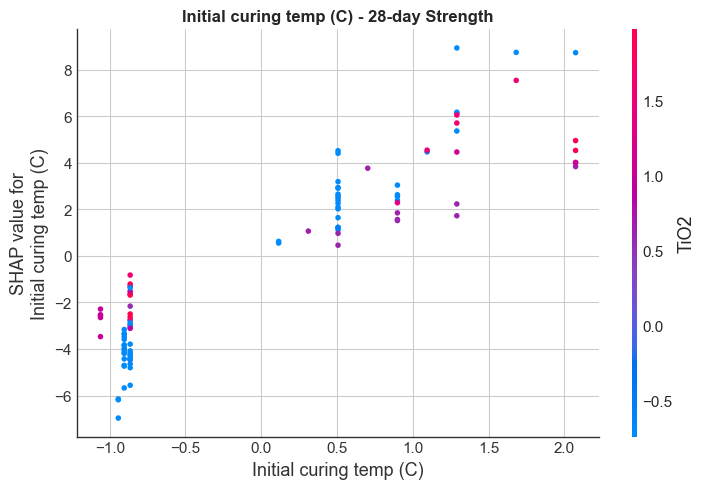

5. Generating analysis report...

COMPREHENSIVE SHAP ANALYSIS REPORT

Dataset Information:
  Number of samples analyzed: 100
  Number of features: 22
  Average 7-day prediction: 31.4 ± 11.0 MPa
  Average 28-day prediction: 37.5 ± 11.9 MPa

Top 10 Most Important Features (by average SHAP):
 1. Initial curing temp (C)   | 7d:  5.676 | 28d:  3.482 | Avg:  4.579
 2. SiO2                      | 7d:  2.677 | 28d:  2.904 | Avg:  2.791
 3. W/B                       | 7d:  2.005 | 28d:  2.557 | Avg:  2.281
 4. Al2O3                     | 7d:  1.917 | 28d:  2.090 | Avg:  2.004
 5. Fe2O3                     | 7d:  1.864 | 28d:  2.131 | Avg:  1.997
 6. CaO                       | 7d:  1.820 | 28d:  2.033 | Avg:  1.927
 7. Ms                        | 7d:  1.400 | 28d:  1.576 | Avg:  1.488
 8. Ag/B                      | 7d:  1.367 | 28d:  1.453 | Avg:  1.410
 9. Concentration (M) NaOH    | 7d:  1.200 | 28d:  1.389 | Avg:  1.294
10. AL/B                      | 7d:  1.187 | 28d:  1.272 | Avg:  1.229


In [32]:
analyzer, results_df = run_complete_shap_analysis(
    model=model,
    X_train=X_train_scaled,
    X_test=X_test_scaled, 
    target_scaler=target_scaler,
    device=device
)

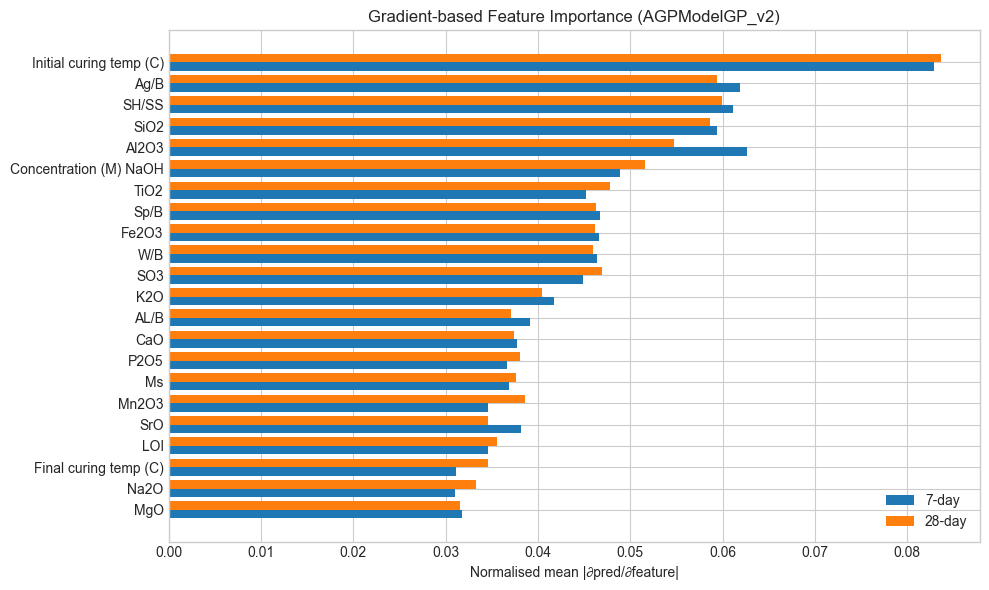

In [33]:
import torch
import numpy as np
import matplotlib.pyplot as plt

def compute_agp_gradient_importance(
    model, X_test_scaled, device, feature_names, batch_size=256
):
    #
    # ------------- make absolutely sure grads are ON -----------------
    #
    with torch.enable_grad():           # ← key line
        model.train()                   # keep dropout active if desired

        # prepare leaf tensor
        X_tensor = torch.tensor(
            X_test_scaled[:batch_size],
            dtype=torch.float32, device=device, requires_grad=True
        )

        # forward
        theta1, theta2, _, _, _ = model(X_tensor)
        log7,  log28 = map(lambda t: torch.log(torch.tensor(t, device=device)), (7.0, 28.0))
        pred7  = theta1 * log7  + theta2
        pred28 = theta1 * log28 + theta2

        # backward for 7-day
        (pred7.sum()).backward(retain_graph=True)
        grads7  = X_tensor.grad.abs().mean(dim=0).cpu().numpy()

        # zero grad, backward for 28-day
        X_tensor.grad.zero_()
        (pred28.sum()).backward()
        grads28 = X_tensor.grad.abs().mean(dim=0).cpu().numpy()

    # normalise
    imp7  = grads7  / grads7.sum()
    imp28 = grads28 / grads28.sum()
    return imp7, imp28


# -------------------------------------------------------------------
# run it
# -------------------------------------------------------------------
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
imp7, imp28 = compute_agp_gradient_importance(
    model, X_test_scaled, device, feature_cols, batch_size=256
)

# plot
avg = (imp7 + imp28) / 2
order = np.argsort(avg)[::-1]
names = np.array(feature_cols)[order]
plt.figure(figsize=(10,6))
y = np.arange(len(names))
plt.barh(y+0.2, imp7[order],  0.4, label='7-day')
plt.barh(y-0.2, imp28[order], 0.4, label='28-day')
plt.gca().invert_yaxis()
plt.yticks(y, names)
plt.xlabel("Normalised mean |∂pred/∂feature|")
plt.title("Gradient-based Feature Importance (AGPModelGP_v2)")
plt.legend()
plt.tight_layout()
plt.show()


In [34]:
import shap, torch, numpy as np, matplotlib.pyplot as plt
shap.initjs()                              # optional for Jupyter

# -----------------------------------------------------------------
# 1.  Wrap your model in a NumPy → NumPy prediction function
# -----------------------------------------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.eval()                               # turn off dropout for deterministic SHAP

def agp_predict(x_numpy: np.ndarray) -> np.ndarray:
    """Return an (N, 2) array: columns = [7-day, 28-day] preds (scaled units)."""
    with torch.no_grad():
        x_tensor = torch.tensor(x_numpy, dtype=torch.float32, device=device)
        θ1, θ2, _, _, _ = model(x_tensor)
        log7, log28 = map(lambda v: torch.log(torch.tensor(v, device=device)), (7.0, 28.0))
        pred7  = (θ1 * log7  + θ2).cpu().numpy()
        pred28 = (θ1 * log28 + θ2).cpu().numpy()
    return np.stack([pred7, pred28], axis=1)        # shape (N, 2)

# -----------------------------------------------------------------
# 2.  Choose a small *background* set for Kernel SHAP
# -----------------------------------------------------------------
rng = np.random.default_rng(42)
bg_idx = rng.choice(X_train_scaled.shape[0], 100, replace=False)
background = X_train_scaled[bg_idx]

# -----------------------------------------------------------------
# 3.  Build an explainer and compute SHAP values on a test subset
# -----------------------------------------------------------------
explainer = shap.Explainer(agp_predict, background, feature_names=feature_cols)

# Use up to 300 random test instances for speed
test_subset = X_test_scaled[rng.choice(X_test_scaled.shape[0], 300, replace=False)]
shap_values = explainer(test_subset, max_evals="auto", batch_size=64)
# shap_values.data  -> (N, n_feat)
# shap_values.values-> (N, 2, n_feat)   2 outputs: [0]=7-day, [1]=28-day

# -----------------------------------------------------------------
# 4.  Summary plots
# -----------------------------------------------------------------
# By default summary_plot shows the first output.  Pass `plot_type="bar"` for bar chart.
shap.summary_plot(shap_values[..., 0], feature_names=feature_cols,
                  show=False, plot_size=(10,6), plot_type="bar")
plt.title("SHAP Feature Importance – 7-day strength (scaled units)")
plt.tight_layout(); plt.show()

shap.summary_plot(shap_values[..., 1], feature_names=feature_cols,
                  show=False, plot_size=(10,6), plot_type="bar")
plt.title("SHAP Feature Importance – 28-day strength (scaled units)")
plt.tight_layout(); plt.show()

# Optional: beeswarm style for richer view
# shap.summary_plot(shap_values[..., 0], feature_names=feature_cols, plot_size=(11,6))
# shap.summary_plot(shap_values[..., 1], feature_names=feature_cols, plot_size=(11,6))


ValueError: Cannot take a larger sample than population when replace is False


Running Comprehensive Analysis for Amortized GP Model

Amortized GP Model - Detailed Results Table:
----------------------------------------------------------------------------------------------------
 Sample  Test_Index Actual_7d Prior_7d Posterior_7d Actual_28d Prior_28d Posterior_28d Prior_Error_7d Post_Error_7d Prior_Error_28d Post_Error_28d Improvement_7d Improvement_28d
      1         110      53.8     43.6         52.7       55.0      47.0          55.9           10.1           1.0             8.0            0.9            9.1             7.1
      2         527      30.0     38.3         29.7       33.7      43.7          34.8            8.3           0.3            10.0            1.2            8.0             8.8
      3         567      56.4     50.3         54.0       59.1      57.1          60.7            6.1           2.4             2.1            1.6            3.7             0.4
      4          77      46.2     43.0         46.5       48.9      45.0          48.5

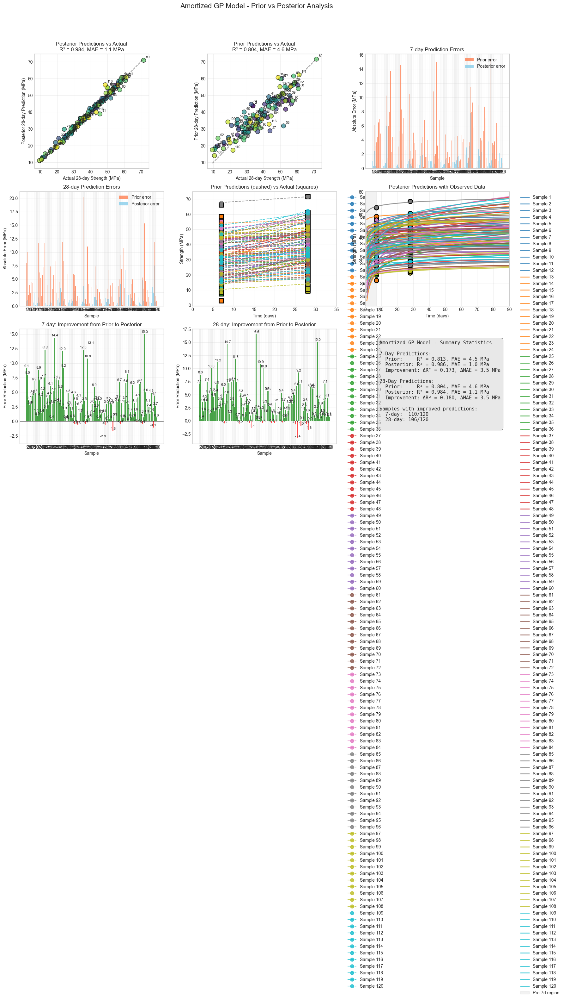

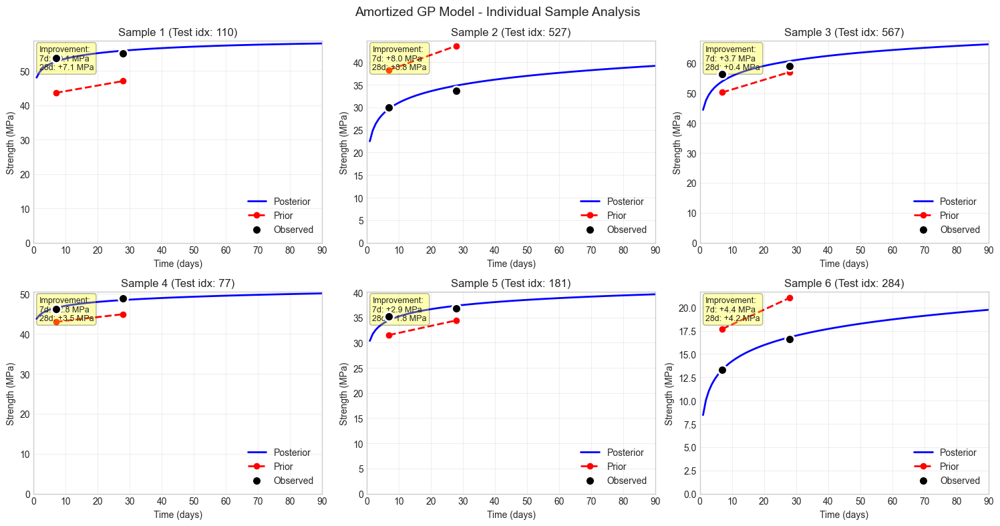


Amortized GP Model - SUMMARY METRICS

7-Day Predictions:
  Prior:     R² = 0.8128, MAE = 4.53 MPa
  Posterior: R² = 0.9862, MAE = 1.05 MPa
  Improvement: ΔR² = +0.1734, ΔMAE = +3.48 MPa

28-Day Predictions:
  Prior:     R² = 0.8037, MAE = 4.55 MPa
  Posterior: R² = 0.9841, MAE = 1.09 MPa
  Improvement: ΔR² = +0.1804, ΔMAE = +3.46 MPa

Samples with improved predictions:
  7-day:  110/120
  28-day: 106/120

FEATURE ANALYSIS (First 3 samples)

Sample 1 (Test index: 110):
  Top 5 scaled features:
    P2O5: 3.009
    Sp/B: 2.713
    MgO: -1.202
    SO3: 0.956
    Al2O3: 0.901

Sample 2 (Test index: 527):
  Top 5 scaled features:
    Sp/B: 1.834
    LOI: 1.432
    Concentration (M) NaOH: -1.096
    AL/B: 1.078
    K2O: -0.997

Sample 3 (Test index: 567):
  Top 5 scaled features:
    W/B: 2.112
    Ag/B: -2.054
    CaO: 0.912
    Initial curing temp (C): -0.904
    SO3: -0.891


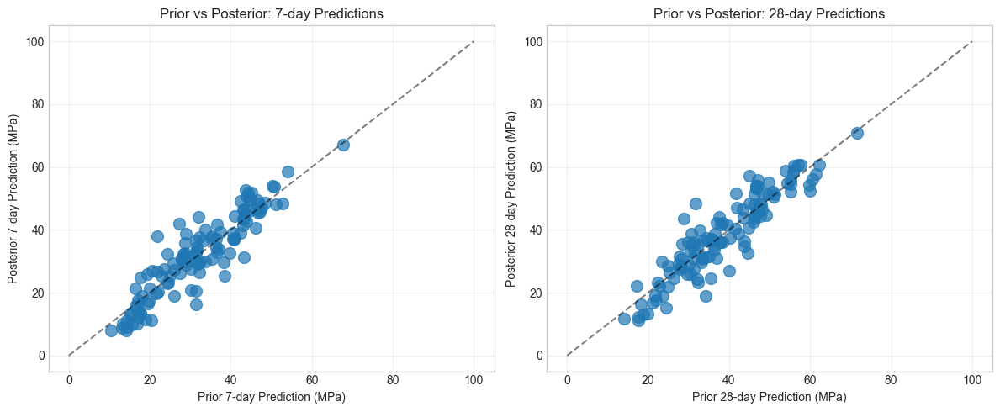

In [35]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import seaborn as sns

def enable_dropout(model):
    """Enable dropout modules while keeping BatchNorm in eval mode."""
    for module in model.modules():
        if isinstance(module, nn.Dropout):
            module.train()

def get_prior_predictions(model, X_scaled, target_scaler, device, n_mc_samples=100):
    """
    Get prior predictions (without using observed data) at 7 and 28 days.
    """
    model.eval()
    enable_dropout(model)
    
    t_pred = torch.tensor([7.0, 28.0], dtype=torch.float32).to(device)
    
    prior_preds = []
    for i in range(X_scaled.shape[0]):
        x_sample = torch.tensor(X_scaled[i:i+1], dtype=torch.float32).to(device)
        
        mc_preds = []
        for _ in range(n_mc_samples):
            with torch.no_grad():
                theta1, theta2, l, sigma_f, sigma_n = model(x_sample)
                # Prior mean (no data conditioning)
                log_t = torch.log(t_pred + 1e-6)
                mean_pred = theta1[0] * log_t + theta2[0]
                mc_preds.append(mean_pred.cpu().numpy())
        
        prior_preds.append(np.mean(mc_preds, axis=0))
    
    model.eval()
    return np.array(prior_preds) * target_scaler.max_val

def get_posterior_predictions(model, X_scaled, y_true_scaled, target_scaler, device, n_mc_samples=100):
    """
    Get posterior predictions (using observed data) for multiple time points.
    """
    model.eval()
    enable_dropout(model)
    
    t_obs = torch.tensor([7.0, 28.0], dtype=torch.float32).to(device)
    t_pred_full = torch.linspace(1, 90, 100).to(device)
    
    posterior_preds_7_28 = []
    posterior_preds_full = []
    
    for i in range(X_scaled.shape[0]):
        x_sample = torch.tensor(X_scaled[i:i+1], dtype=torch.float32).to(device)
        y_sample = torch.tensor(y_true_scaled[i:i+1], dtype=torch.float32).to(device)
        
        mc_preds_7_28 = []
        mc_preds_full = []
        
        for _ in range(n_mc_samples):
            with torch.no_grad():
                theta1, theta2, l, sigma_f, sigma_n = model(x_sample)
                
                # Predictions at 7 and 28 days
                mean_7_28, _ = gp_posterior_mean_var(
                    theta1[0], theta2[0], l[0], sigma_f[0], sigma_n[0],
                    t_obs, y_sample[0], t_obs, epsilon=1e-6
                )
                mc_preds_7_28.append(mean_7_28.cpu().numpy())
                
                # Full time range predictions
                mean_full, _ = gp_posterior_mean_var(
                    theta1[0], theta2[0], l[0], sigma_f[0], sigma_n[0],
                    t_obs, y_sample[0], t_pred_full, epsilon=1e-6
                )
                mc_preds_full.append(mean_full.cpu().numpy())
        
        posterior_preds_7_28.append(np.mean(mc_preds_7_28, axis=0))
        posterior_preds_full.append(np.mean(mc_preds_full, axis=0))
    
    model.eval()
    
    posterior_preds_7_28 = np.array(posterior_preds_7_28) * target_scaler.max_val
    posterior_preds_full = np.array(posterior_preds_full) * target_scaler.max_val
    
    return posterior_preds_7_28, posterior_preds_full, t_pred_full.cpu().numpy()

def enhanced_agp_analysis(model, X_test_scaled, y7_test, y28_test, target_scaler, 
                         test_indices, device, n_analyze=20, n_mc_samples=100):
    """
    Perform enhanced analysis comparing prior and posterior predictions.
    """
    # Prepare data
    y_test_scaled = np.column_stack((y7_test, y28_test)) / target_scaler.max_val
    y_test_true = np.column_stack((y7_test, y28_test))
    
    # Select samples to analyze
    analyze_idx = np.arange(min(n_analyze, len(X_test_scaled)))
    X_analyze = X_test_scaled[analyze_idx]
    y_analyze_scaled = y_test_scaled[analyze_idx]
    y_analyze_true = y_test_true[analyze_idx]
    
    # Get predictions
    prior_preds = get_prior_predictions(model, X_analyze, target_scaler, device, n_mc_samples)
    posterior_preds_7_28, posterior_preds_full, time_range = get_posterior_predictions(
        model, X_analyze, y_analyze_scaled, target_scaler, device, n_mc_samples
    )
    
    # Calculate improvements
    prior_errors_7 = np.abs(y_analyze_true[:, 0] - prior_preds[:, 0])
    prior_errors_28 = np.abs(y_analyze_true[:, 1] - prior_preds[:, 1])
    posterior_errors_7 = np.abs(y_analyze_true[:, 0] - posterior_preds_7_28[:, 0])
    posterior_errors_28 = np.abs(y_analyze_true[:, 1] - posterior_preds_7_28[:, 1])
    
    improvements_7 = prior_errors_7 - posterior_errors_7
    improvements_28 = prior_errors_28 - posterior_errors_28
    
    results = {
        'actual_7': y_analyze_true[:, 0],
        'actual_28': y_analyze_true[:, 1],
        'prior_pred_7': prior_preds[:, 0],
        'prior_pred_28': prior_preds[:, 1],
        'posterior_pred_7': posterior_preds_7_28[:, 0],
        'posterior_pred_28': posterior_preds_7_28[:, 1],
        'posterior_full': posterior_preds_full,
        'time_range': time_range,
        'improvement_7': improvements_7,
        'improvement_28': improvements_28,
        'test_indices': test_indices[analyze_idx] if test_indices is not None else analyze_idx
    }
    
    return results

def create_detailed_table(analysis_results):
    """
    Create a detailed results table.
    """
    n_samples = len(analysis_results['actual_7'])
    
    table_data = []
    for i in range(n_samples):
        row = {
            'Sample': i + 1,
            'Test_Index': analysis_results['test_indices'][i],
            'Actual_7d': f"{analysis_results['actual_7'][i]:.1f}",
            'Prior_7d': f"{analysis_results['prior_pred_7'][i]:.1f}",
            'Posterior_7d': f"{analysis_results['posterior_pred_7'][i]:.1f}",
            'Actual_28d': f"{analysis_results['actual_28'][i]:.1f}",
            'Prior_28d': f"{analysis_results['prior_pred_28'][i]:.1f}",
            'Posterior_28d': f"{analysis_results['posterior_pred_28'][i]:.1f}",
            'Prior_Error_7d': f"{abs(analysis_results['actual_7'][i] - analysis_results['prior_pred_7'][i]):.1f}",
            'Post_Error_7d': f"{abs(analysis_results['actual_7'][i] - analysis_results['posterior_pred_7'][i]):.1f}",
            'Prior_Error_28d': f"{abs(analysis_results['actual_28'][i] - analysis_results['prior_pred_28'][i]):.1f}",
            'Post_Error_28d': f"{abs(analysis_results['actual_28'][i] - analysis_results['posterior_pred_28'][i]):.1f}",
            'Improvement_7d': f"{analysis_results['improvement_7'][i]:.1f}",
            'Improvement_28d': f"{analysis_results['improvement_28'][i]:.1f}"
        }
        table_data.append(row)
    
    return pd.DataFrame(table_data)

def plot_prior_posterior_comparison(analysis_results, model_name="AGP Model"):
    """
    Create comprehensive visualization comparing prior and posterior predictions.
    """
    fig = plt.figure(figsize=(20, 16))
    
    n_analyze = len(analysis_results['actual_7'])
    
    # 1. Posterior vs Actual scatter plot (28-day)
    ax1 = plt.subplot(3, 3, 1)
    actual_28 = analysis_results['actual_28']
    posterior_28 = analysis_results['posterior_pred_28']
    
    scatter1 = ax1.scatter(actual_28, posterior_28, s=100, alpha=0.7, 
                          c=range(n_analyze), cmap='viridis', 
                          edgecolors='black', linewidth=1)
    
    min_val = min(min(actual_28), min(posterior_28))
    max_val = max(max(actual_28), max(posterior_28))
    ax1.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5)
    
    for i, (x, y) in enumerate(zip(actual_28, posterior_28)):
        ax1.annotate(f'{i+1}', (x, y), xytext=(5, 5), 
                    textcoords='offset points', fontsize=8)
    
    r2_posterior = r2_score(actual_28, posterior_28)
    mae_posterior = mean_absolute_error(actual_28, posterior_28)
    
    ax1.set_xlabel('Actual 28-day Strength (MPa)')
    ax1.set_ylabel('Posterior 28-day Prediction (MPa)')
    ax1.set_title(f'Posterior Predictions vs Actual\nR² = {r2_posterior:.3f}, MAE = {mae_posterior:.1f} MPa')
    ax1.grid(True, alpha=0.3)
    ax1.set_aspect('equal', adjustable='box')
    
    # 2. Prior vs Actual scatter plot (28-day)
    ax2 = plt.subplot(3, 3, 2)
    prior_28 = analysis_results['prior_pred_28']
    
    scatter2 = ax2.scatter(actual_28, prior_28, s=100, alpha=0.7, 
                          c=range(n_analyze), cmap='viridis', 
                          edgecolors='black', linewidth=1)
    
    min_val = min(min(actual_28), min(prior_28))
    max_val = max(max(actual_28), max(prior_28))
    ax2.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5)
    
    for i, (x, y) in enumerate(zip(actual_28, prior_28)):
        ax2.annotate(f'{i+1}', (x, y), xytext=(5, 5), 
                    textcoords='offset points', fontsize=8)
    
    r2_prior = r2_score(actual_28, prior_28)
    mae_prior = mean_absolute_error(actual_28, prior_28)
    
    ax2.set_xlabel('Actual 28-day Strength (MPa)')
    ax2.set_ylabel('Prior 28-day Prediction (MPa)')
    ax2.set_title(f'Prior Predictions vs Actual\nR² = {r2_prior:.3f}, MAE = {mae_prior:.1f} MPa')
    ax2.grid(True, alpha=0.3)
    ax2.set_aspect('equal', adjustable='box')
    
    # 3. Error comparison (7-day)
    ax3 = plt.subplot(3, 3, 3)
    prior_errors_7 = [abs(analysis_results['actual_7'][i] - analysis_results['prior_pred_7'][i]) 
                     for i in range(n_analyze)]
    posterior_errors_7 = [abs(analysis_results['actual_7'][i] - analysis_results['posterior_pred_7'][i]) 
                         for i in range(n_analyze)]
    
    x = np.arange(n_analyze)
    width = 0.35
    ax3.bar(x - width/2, prior_errors_7, width, label='Prior error', alpha=0.8, color='coral')
    ax3.bar(x + width/2, posterior_errors_7, width, label='Posterior error', alpha=0.8, color='skyblue')
    
    ax3.set_xlabel('Sample')
    ax3.set_ylabel('Absolute Error (MPa)')
    ax3.set_title('7-day Prediction Errors')
    ax3.set_xticks(x)
    ax3.set_xticklabels([f'{i+1}' for i in range(n_analyze)])
    ax3.legend()
    ax3.grid(True, alpha=0.3)
    
    # 4. Error comparison (28-day)
    ax4 = plt.subplot(3, 3, 4)
    prior_errors_28 = [abs(analysis_results['actual_28'][i] - analysis_results['prior_pred_28'][i]) 
                      for i in range(n_analyze)]
    posterior_errors_28 = [abs(analysis_results['actual_28'][i] - analysis_results['posterior_pred_28'][i]) 
                          for i in range(n_analyze)]
    
    ax4.bar(x - width/2, prior_errors_28, width, label='Prior error', alpha=0.8, color='coral')
    ax4.bar(x + width/2, posterior_errors_28, width, label='Posterior error', alpha=0.8, color='skyblue')
    
    ax4.set_xlabel('Sample')
    ax4.set_ylabel('Absolute Error (MPa)')
    ax4.set_title('28-day Prediction Errors')
    ax4.set_xticks(x)
    ax4.set_xticklabels([f'{i+1}' for i in range(n_analyze)])
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # 5. All samples strength development (Prior)
    ax5 = plt.subplot(3, 3, 5)
    time_points = np.array([7, 28])
    colors = plt.cm.tab10(np.linspace(0, 1, n_analyze))
    
    for i in range(n_analyze):
        # Plot prior
        ax5.plot(time_points, [analysis_results['prior_pred_7'][i], analysis_results['prior_pred_28'][i]], 
                'o--', color=colors[i], alpha=0.8, label=f'Sample {i+1}', markersize=8)
        # Plot actual
        ax5.scatter([7, 28], [analysis_results['actual_7'][i], analysis_results['actual_28'][i]], 
                   color=colors[i], s=100, edgecolors='black', linewidth=2, marker='s')
    
    ax5.set_xlabel('Time (days)')
    ax5.set_ylabel('Strength (MPa)')
    ax5.set_title('Prior Predictions (dashed) vs Actual (squares)')
    ax5.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax5.grid(True, alpha=0.3)
    ax5.set_xlim(0, 35)
    
    # 6. All samples strength development (Posterior)
    ax6 = plt.subplot(3, 3, 6)
    time_range = analysis_results['time_range']
    
    for i in range(n_analyze):
        # Plot posterior
        ax6.plot(time_range, analysis_results['posterior_full'][i], 
                '-', color=colors[i], alpha=0.8, label=f'Sample {i+1}', linewidth=2)
        # Plot actual
        ax6.scatter([7, 28], [analysis_results['actual_7'][i], analysis_results['actual_28'][i]], 
                   color=colors[i], s=100, edgecolors='black', linewidth=2)
    
    ax6.axvspan(0, 7, alpha=0.1, color='gray', label='Pre-7d region')
    ax6.set_xlabel('Time (days)')
    ax6.set_ylabel('Strength (MPa)')
    ax6.set_title('Posterior Predictions with Observed Data')
    ax6.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax6.grid(True, alpha=0.3)
    ax6.set_xlim(0, 90)
    
    # 7. Improvement visualization (7-day)
    ax7 = plt.subplot(3, 3, 7)
    improvements_7 = analysis_results['improvement_7']
    colors_imp = ['green' if imp > 0 else 'red' for imp in improvements_7]
    bars = ax7.bar(x, improvements_7, color=colors_imp, alpha=0.7)
    
    ax7.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
    ax7.set_xlabel('Sample')
    ax7.set_ylabel('Error Reduction (MPa)')
    ax7.set_title('7-day: Improvement from Prior to Posterior')
    ax7.set_xticks(x)
    ax7.set_xticklabels([f'{i+1}' for i in range(n_analyze)])
    ax7.grid(True, alpha=0.3)
    
    # Add value labels
    for i, (bar, val) in enumerate(zip(bars, improvements_7)):
        ax7.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1, 
                f'{val:.1f}', ha='center', va='bottom', fontsize=8)
    
    # 8. Improvement visualization (28-day)
    ax8 = plt.subplot(3, 3, 8)
    improvements_28 = analysis_results['improvement_28']
    colors_imp = ['green' if imp > 0 else 'red' for imp in improvements_28]
    bars = ax8.bar(x, improvements_28, color=colors_imp, alpha=0.7)
    
    ax8.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
    ax8.set_xlabel('Sample')
    ax8.set_ylabel('Error Reduction (MPa)')
    ax8.set_title('28-day: Improvement from Prior to Posterior')
    ax8.set_xticks(x)
    ax8.set_xticklabels([f'{i+1}' for i in range(n_analyze)])
    ax8.grid(True, alpha=0.3)
    
    # Add value labels
    for i, (bar, val) in enumerate(zip(bars, improvements_28)):
        ax8.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1, 
                f'{val:.1f}', ha='center', va='bottom', fontsize=8)
    
    # 9. Summary statistics
    ax9 = plt.subplot(3, 3, 9)
    ax9.axis('off')
    
    # Calculate additional metrics
    r2_prior_7 = r2_score(analysis_results['actual_7'], analysis_results['prior_pred_7'])
    r2_posterior_7 = r2_score(analysis_results['actual_7'], analysis_results['posterior_pred_7'])
    mae_prior_7 = mean_absolute_error(analysis_results['actual_7'], analysis_results['prior_pred_7'])
    mae_posterior_7 = mean_absolute_error(analysis_results['actual_7'], analysis_results['posterior_pred_7'])
    
    summary_text = f"{model_name} - Summary Statistics\n\n"
    summary_text += "7-Day Predictions:\n"
    summary_text += f"  Prior:     R² = {r2_prior_7:.3f}, MAE = {mae_prior_7:.1f} MPa\n"
    summary_text += f"  Posterior: R² = {r2_posterior_7:.3f}, MAE = {mae_posterior_7:.1f} MPa\n"
    summary_text += f"  Improvement: ΔR² = {r2_posterior_7 - r2_prior_7:.3f}, ΔMAE = {mae_prior_7 - mae_posterior_7:.1f} MPa\n\n"
    
    summary_text += "28-Day Predictions:\n"
    summary_text += f"  Prior:     R² = {r2_prior:.3f}, MAE = {mae_prior:.1f} MPa\n"
    summary_text += f"  Posterior: R² = {r2_posterior:.3f}, MAE = {mae_posterior:.1f} MPa\n"
    summary_text += f"  Improvement: ΔR² = {r2_posterior - r2_prior:.3f}, ΔMAE = {mae_prior - mae_posterior:.1f} MPa\n\n"
    
    summary_text += f"Samples with improved predictions:\n"
    summary_text += f"  7-day:  {sum(1 for imp in improvements_7 if imp > 0)}/{n_analyze}\n"
    summary_text += f"  28-day: {sum(1 for imp in improvements_28 if imp > 0)}/{n_analyze}\n"
    
    ax9.text(0.1, 0.9, summary_text, transform=ax9.transAxes, 
            fontsize=11, verticalalignment='top', family='monospace',
            bbox=dict(boxstyle="round,pad=0.5", facecolor="lightgray", alpha=0.5))
    
    plt.suptitle(f'{model_name} - Prior vs Posterior Analysis', fontsize=16, y=0.98)
    plt.tight_layout()
    
    return fig

def plot_individual_samples(analysis_results, model_name="AGP Model", samples_to_plot=None):
    """
    Create individual plots for each sample showing prior and posterior.
    """
    n_samples = len(analysis_results['actual_7'])
    if samples_to_plot is None:
        samples_to_plot = list(range(min(6, n_samples)))
    
    n_plots = len(samples_to_plot)
    cols = 3
    rows = int(np.ceil(n_plots / cols))
    
    fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    time_range = analysis_results['time_range']
    
    for idx, sample_idx in enumerate(samples_to_plot):
        row = idx // cols
        col = idx % cols
        ax = axes[row, col]
        
        # Plot posterior prediction
        ax.plot(time_range, analysis_results['posterior_full'][sample_idx], 
               'b-', linewidth=2, label='Posterior')
        
        # Plot prior prediction (just connect 7 and 28 day points)
        ax.plot([7, 28], 
               [analysis_results['prior_pred_7'][sample_idx], 
                analysis_results['prior_pred_28'][sample_idx]], 
               'r--', linewidth=2, label='Prior', marker='o', markersize=6)
        
        # Plot actual data
        ax.scatter([7, 28], 
                  [analysis_results['actual_7'][sample_idx], 
                   analysis_results['actual_28'][sample_idx]], 
                  color='black', s=100, zorder=5, label='Observed', 
                  edgecolors='white', linewidth=2)
        
        # Add text with improvements
        imp_7 = analysis_results['improvement_7'][sample_idx]
        imp_28 = analysis_results['improvement_28'][sample_idx]
        
        ax.text(0.02, 0.98, 
               f'Improvement:\n7d: {imp_7:+.1f} MPa\n28d: {imp_28:+.1f} MPa',
               transform=ax.transAxes, fontsize=9,
               verticalalignment='top',
               bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.3))
        
        ax.set_xlabel('Time (days)')
        ax.set_ylabel('Strength (MPa)')
        ax.set_title(f'Sample {sample_idx + 1} (Test idx: {analysis_results["test_indices"][sample_idx]})')
        ax.grid(True, alpha=0.3)
        ax.legend(loc='lower right')
        ax.set_xlim(0, 90)
        ax.set_ylim(bottom=0)
    
    # Remove empty subplots
    for idx in range(n_plots, rows * cols):
        row = idx // cols
        col = idx % cols
        fig.delaxes(axes[row, col])
    
    plt.suptitle(f'{model_name} - Individual Sample Analysis', fontsize=14)
    plt.tight_layout()
    
    return fig

def run_comprehensive_agp_analysis(model, X_test_scaled, y7_test, y28_test, 
                                  target_scaler, test_indices, device,
                                  n_analyze=20, n_mc_samples=100,
                                  save_results=True, model_name="AGP Model"):
    """
    Run comprehensive analysis and create all visualizations.
    """
    print(f"\nRunning Comprehensive Analysis for {model_name}")
    print("="*60)
    
    # Perform analysis
    analysis_results = enhanced_agp_analysis(
        model, X_test_scaled, y7_test, y28_test, 
        target_scaler, test_indices, device, 
        n_analyze=n_analyze, n_mc_samples=n_mc_samples
    )
    
    # Create detailed table
    print(f"\n{model_name} - Detailed Results Table:")
    print("-" * 100)
    table_df = create_detailed_table(analysis_results)
    print(table_df.to_string(index=False))
    
    if save_results:
        table_filename = f"{model_name.replace(' ', '_')}_analysis_results.csv"
        table_df.to_csv(table_filename, index=False)
        print(f"\nTable saved to: {table_filename}")
    
    # Create visualizations
    print("\nCreating visualizations...")
    
    # Main comparison plot
    fig1 = plot_prior_posterior_comparison(analysis_results, model_name)
    if save_results:
        fig1.savefig(f"{model_name.replace(' ', '_')}_prior_posterior_comparison.png", 
                    dpi=300, bbox_inches='tight')
    plt.show()
    
    # Individual sample plots
    fig2 = plot_individual_samples(analysis_results, model_name)
    if save_results:
        fig2.savefig(f"{model_name.replace(' ', '_')}_individual_samples.png", 
                    dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print summary metrics
    print("\n" + "="*60)
    print(f"{model_name} - SUMMARY METRICS")
    print("="*60)
    
    # 7-day metrics
    r2_prior_7 = r2_score(analysis_results['actual_7'], analysis_results['prior_pred_7'])
    r2_post_7 = r2_score(analysis_results['actual_7'], analysis_results['posterior_pred_7'])
    mae_prior_7 = mean_absolute_error(analysis_results['actual_7'], analysis_results['prior_pred_7'])
    mae_post_7 = mean_absolute_error(analysis_results['actual_7'], analysis_results['posterior_pred_7'])
    
    print("\n7-Day Predictions:")
    print(f"  Prior:     R² = {r2_prior_7:.4f}, MAE = {mae_prior_7:.2f} MPa")
    print(f"  Posterior: R² = {r2_post_7:.4f}, MAE = {mae_post_7:.2f} MPa")
    print(f"  Improvement: ΔR² = {r2_post_7 - r2_prior_7:+.4f}, ΔMAE = {mae_prior_7 - mae_post_7:+.2f} MPa")
    
    # 28-day metrics
    r2_prior_28 = r2_score(analysis_results['actual_28'], analysis_results['prior_pred_28'])
    r2_post_28 = r2_score(analysis_results['actual_28'], analysis_results['posterior_pred_28'])
    mae_prior_28 = mean_absolute_error(analysis_results['actual_28'], analysis_results['prior_pred_28'])
    mae_post_28 = mean_absolute_error(analysis_results['actual_28'], analysis_results['posterior_pred_28'])
    
    print("\n28-Day Predictions:")
    print(f"  Prior:     R² = {r2_prior_28:.4f}, MAE = {mae_prior_28:.2f} MPa")
    print(f"  Posterior: R² = {r2_post_28:.4f}, MAE = {mae_post_28:.2f} MPa")
    print(f"  Improvement: ΔR² = {r2_post_28 - r2_prior_28:+.4f}, ΔMAE = {mae_prior_28 - mae_post_28:+.2f} MPa")
    
    print("\nSamples with improved predictions:")
    print(f"  7-day:  {sum(1 for imp in analysis_results['improvement_7'] if imp > 0)}/{n_analyze}")
    print(f"  28-day: {sum(1 for imp in analysis_results['improvement_28'] if imp > 0)}/{n_analyze}")
    
    print("="*60)
    
    return analysis_results, table_df


# Example usage with the AGP model
if __name__ == "__main__":
    # Assuming you have already trained your AGP model and have test data
    
    # Get test indices (indices of test samples in the original dataset)
    # This assumes you used train_test_split with shuffle=True
    from sklearn.model_selection import train_test_split
    _, _, _, _, _, _, train_idx, test_idx = train_test_split(
        X, y_7, y_28, np.arange(len(X)),
        test_size=0.20,
        random_state=42,
        shuffle=True
    )
    
    # Run comprehensive analysis
    results, table = run_comprehensive_agp_analysis(
        model=model,
        X_test_scaled=X_test_scaled,
        y7_test=y7_test,
        y28_test=y28_test,
        target_scaler=target_scaler,
        test_indices=test_idx,
        device=device,
        n_analyze=120,  # Analyze first 10 test samples
        n_mc_samples=100,
        save_results=True,
        model_name="Amortized GP Model"
    )
    
    # Additional analysis: Show feature importance (optional)
    print("\n" + "="*60)
    print("FEATURE ANALYSIS (First 3 samples)")
    print("="*60)
    
    for i in range(min(3, len(X_test_scaled))):
        print(f"\nSample {i+1} (Test index: {test_idx[i]}):")
        print("  Top 5 scaled features:")
        feature_values = X_test_scaled[i]
        top_features = np.argsort(np.abs(feature_values))[-5:][::-1]
        
        for j, feat_idx in enumerate(top_features):
            if feat_idx < len(feature_cols):
                print(f"    {feature_cols[feat_idx]}: {feature_values[feat_idx]:.3f}")
            else:
                print(f"    Feature {feat_idx}: {feature_values[feat_idx]:.3f}")
    
    # Create a correlation plot between prior and posterior predictions
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.scatter(results['prior_pred_7'], results['posterior_pred_7'], alpha=0.7, s=100)
    plt.plot([0, 100], [0, 100], 'k--', alpha=0.5)
    plt.xlabel('Prior 7-day Prediction (MPa)')
    plt.ylabel('Posterior 7-day Prediction (MPa)')
    plt.title('Prior vs Posterior: 7-day Predictions')
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 2, 2)
    plt.scatter(results['prior_pred_28'], results['posterior_pred_28'], alpha=0.7, s=100)
    plt.plot([0, 100], [0, 100], 'k--', alpha=0.5)
    plt.xlabel('Prior 28-day Prediction (MPa)')
    plt.ylabel('Posterior 28-day Prediction (MPa)')
    plt.title('Prior vs Posterior: 28-day Predictions')
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig('prior_vs_posterior_correlation.png', dpi=300, bbox_inches='tight')
    plt.show()


Processing Mix 1...
  Prior at 7d: 50.0 MPa (true: 53.8, error: 3.8)
  Adjusted at 7d: 53.7 MPa (error: 0.1)
  Prior at 28d: 52.8 MPa (true: 55.0, error: 2.2)
  Adjusted at 28d: 54.9 MPa (error: 0.1)
  Improvement at 28d: +2.1 MPa

Processing Mix 2...
  Prior at 7d: 38.7 MPa (true: 30.0, error: 8.7)
  Adjusted at 7d: 29.9 MPa (error: 0.1)
  Prior at 28d: 43.8 MPa (true: 33.7, error: 10.1)
  Adjusted at 28d: 38.6 MPa (error: 4.9)
  Improvement at 28d: +5.2 MPa

Processing Mix 3...
  Prior at 7d: 49.6 MPa (true: 56.4, error: 6.8)
  Adjusted at 7d: 56.3 MPa (error: 0.1)
  Prior at 28d: 56.2 MPa (true: 59.1, error: 2.9)
  Adjusted at 28d: 60.1 MPa (error: 1.0)
  Improvement at 28d: +1.9 MPa

Processing Mix 4...
  Prior at 7d: 45.0 MPa (true: 46.2, error: 1.2)
  Adjusted at 7d: 46.1 MPa (error: 0.1)
  Prior at 28d: 48.2 MPa (true: 48.9, error: 0.7)
  Adjusted at 28d: 48.9 MPa (error: 0.0)
  Improvement at 28d: +0.6 MPa

Processing Mix 5...
  Prior at 7d: 29.3 MPa (true: 35.2, error: 5.9)
 

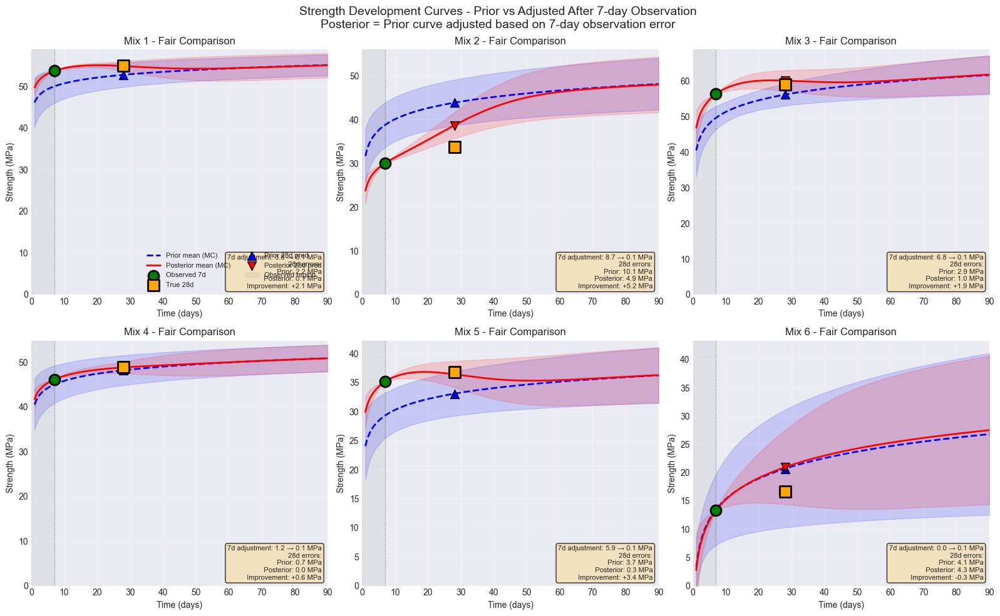

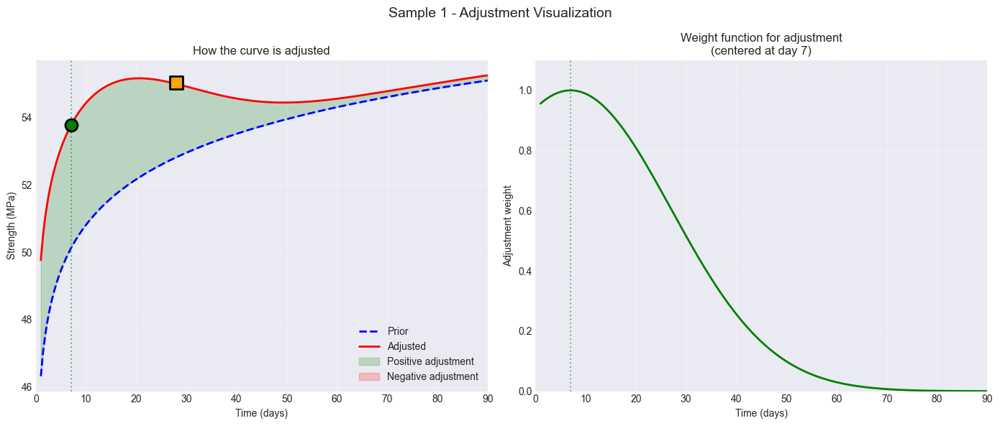

In [65]:
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

def enable_dropout(model):
    """Enable dropout modules while keeping BatchNorm in eval mode."""
    for module in model.modules():
        if isinstance(module, nn.Dropout):
            module.train()

def compute_prior_curve(model, x_sample, time_points, device, target_scaler, n_mc_samples=100):
    """
    Compute prior strength development curve (before seeing any data)
    """
    model.eval()
    enable_dropout(model)
    
    prior_curves = []
    
    for _ in range(n_mc_samples):
        with torch.no_grad():
            theta1, theta2, l, sigma_f, sigma_n = model(x_sample.unsqueeze(0))
            
            # Prior mean function: strength = θ₁ * log(t) + θ₂
            log_times = torch.log(time_points + 1e-6)
            curve = (theta1 * log_times + theta2).squeeze()
            prior_curves.append(curve.cpu().numpy())
    
    # Average over MC samples
    prior_curves = np.array(prior_curves)
    prior_mean = np.mean(prior_curves, axis=0) * target_scaler.max_val
    prior_std = np.std(prior_curves, axis=0) * target_scaler.max_val
    
    return prior_mean, prior_std

def compute_adjusted_curve(model, x_sample, y7_obs, time_points, device, target_scaler, n_mc_samples=100):
    """
    Compute adjusted strength development curve after observing 7-day strength.
    
    The idea is to use the 7-day observation to calibrate/adjust the entire curve.
    This could be done by:
    1. Computing the error at day 7
    2. Using this error to adjust the entire curve
    3. Or learning a correction factor based on the observation
    """
    model.eval()
    enable_dropout(model)
    
    y7_scaled = y7_obs / target_scaler.max_val
    adjusted_curves = []
    
    for _ in range(n_mc_samples):
        with torch.no_grad():
            theta1, theta2, l, sigma_f, sigma_n = model(x_sample.unsqueeze(0))
            
            # Original prior curve
            log_times = torch.log(time_points + 1e-6)
            prior_curve = (theta1 * log_times + theta2).squeeze()
            
            # Compute prior prediction at day 7
            log_7 = torch.log(torch.tensor(7.0) + 1e-6)
            prior_at_7 = (theta1 * log_7 + theta2).squeeze()
            
            # Compute adjustment based on observation
            # Method 1: Simple shift (additive correction)
            # error_at_7 = y7_scaled - prior_at_7
            # adjusted_curve = prior_curve + error_at_7
            
            # Method 2: Multiplicative correction
            # ratio_at_7 = y7_scaled / (prior_at_7 + 1e-6)
            # adjusted_curve = prior_curve * ratio_at_7
            
            # Method 3: Weighted adjustment that decreases with time
            # This gives more weight to the observation near day 7 and less as we go further
            error_at_7 = y7_scaled - prior_at_7
            
            # Weight function: stronger near day 7, weaker far away
            # Using a Gaussian-like weight centered at day 7
            weight = torch.exp(-0.5 * ((time_points - 7) / 20)**2)  # 20 is the "influence radius"
            
            # Apply weighted correction
            adjusted_curve = prior_curve + weight * error_at_7
            
            adjusted_curves.append(adjusted_curve.cpu().numpy())
    
    # Average over MC samples
    adjusted_curves = np.array(adjusted_curves)
    adjusted_mean = np.mean(adjusted_curves, axis=0) * target_scaler.max_val
    adjusted_std = np.std(adjusted_curves, axis=0) * target_scaler.max_val
    
    return adjusted_mean, adjusted_std

def plot_adjusted_strength_curves(model, X_test_scaled, y7_test, y28_test,
                                 target_scaler, device, sample_indices=None,
                                 n_mc_samples=100, adjustment_method='weighted',
                                 figsize=(16, 10)):
    """
    Plot strength development curves showing:
    - Prior curve (before seeing any data)
    - Adjusted curve (after observing 7-day data)
    - All relevant data points and predictions
    """
    if sample_indices is None:
        sample_indices = list(range(min(6, len(X_test_scaled))))
    
    n_samples = len(sample_indices)
    
    # Time points for smooth curves
    time_range = torch.linspace(1, 90, 200, device=device, dtype=torch.float32)
    
    # Create figure
    cols = 3
    rows = int(np.ceil(n_samples / cols))
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    if rows == 1:
        axes = axes.reshape(1, -1)
    if cols == 1:
        axes = axes.reshape(-1, 1)
    
    for idx, sample_idx in enumerate(sample_indices):
        row = idx // cols
        col = idx % cols
        ax = axes[row, col]
        
        # Get sample data
        x_sample = torch.tensor(X_test_scaled[sample_idx], dtype=torch.float32).to(device)
        y7_true = y7_test[sample_idx]
        y28_true = y28_test[sample_idx]
        
        print(f"\nProcessing Mix {sample_idx + 1}...")
        
        # 1. Compute PRIOR curve (no data)
        prior_mean, prior_std = compute_prior_curve(
            model, x_sample, time_range, device, target_scaler, n_mc_samples
        )
        
        # 2. Compute ADJUSTED curve (after observing 7-day)
        adjusted_mean, adjusted_std = compute_adjusted_curve(
            model, x_sample, y7_true, time_range, device, target_scaler, n_mc_samples
        )
        
        # 3. Extract predictions at specific days
        time_np = time_range.cpu().numpy()
        idx_7 = np.argmin(np.abs(time_np - 7))
        idx_28 = np.argmin(np.abs(time_np - 28))
        
        prior_7 = prior_mean[idx_7]
        prior_28 = prior_mean[idx_28]
        adjusted_7 = adjusted_mean[idx_7]
        adjusted_28 = adjusted_mean[idx_28]
        
        # 4. Plot curves
        # Prior curve
        ax.plot(time_np, prior_mean, 'b--', linewidth=2, label='Prior mean (MC)')
        ax.fill_between(time_np, 
                       prior_mean - 2*prior_std,
                       prior_mean + 2*prior_std,
                       color='blue', alpha=0.15)
        
        # Adjusted curve
        ax.plot(time_np, adjusted_mean, 'r-', linewidth=2, label='Posterior mean (MC)')
        ax.fill_between(time_np, 
                       adjusted_mean - 2*adjusted_std,
                       adjusted_mean + 2*adjusted_std,
                       color='red', alpha=0.15)
        
        # Observed data points
        ax.scatter(7, y7_true, color='green', s=150, marker='o', 
                  edgecolors='black', linewidth=2, zorder=5, label='Observed 7d')
        ax.scatter(28, y28_true, color='orange', s=150, marker='s', 
                  edgecolors='black', linewidth=2, zorder=5, label='True 28d')
        
        # Predictions at 28 days
        ax.scatter(28, prior_28, color='blue', s=100, marker='^', 
                  edgecolors='black', linewidth=1, zorder=4, label='Prior 28d pred')
        ax.scatter(28, adjusted_28, color='red', s=100, marker='v', 
                  edgecolors='black', linewidth=1, zorder=4, label='Posterior 28d pred')
        
        # Highlight observation region
        ax.axvspan(0, 7, alpha=0.1, color='gray', label='Observed region')
        ax.axvline(x=7, color='green', linestyle=':', alpha=0.5, linewidth=1)
        
        # Add metrics box
        error_prior_7 = abs(y7_true - prior_7)
        error_prior_28 = abs(y28_true - prior_28)
        error_adjusted_7 = abs(y7_true - adjusted_7)
        error_adjusted_28 = abs(y28_true - adjusted_28)
        improvement_28 = error_prior_28 - error_adjusted_28
        
        textstr = f'7d adjustment: {error_prior_7:.1f} → {error_adjusted_7:.1f} MPa\n'
        textstr += f'28d errors:\n'
        textstr += f'  Prior: {error_prior_28:.1f} MPa\n'
        textstr += f'  Posterior: {error_adjusted_28:.1f} MPa\n'
        textstr += f'  Improvement: {improvement_28:+.1f} MPa'
        
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
        ax.text(0.98, 0.02, textstr, transform=ax.transAxes, fontsize=8,
                verticalalignment='bottom', horizontalalignment='right', bbox=props)
        
        # Formatting
        ax.set_xlabel('Time (days)')
        ax.set_ylabel('Strength (MPa)')
        ax.set_title(f'Mix {sample_idx + 1} - Fair Comparison')
        ax.grid(True, alpha=0.3)
        ax.set_xlim(0, 90)
        ax.set_ylim(bottom=0)
        
        if idx == 0:
            ax.legend(loc='lower right', fontsize=8, ncol=2)
        
        # Print diagnostics
        print(f"  Prior at 7d: {prior_7:.1f} MPa (true: {y7_true:.1f}, error: {error_prior_7:.1f})")
        print(f"  Adjusted at 7d: {adjusted_7:.1f} MPa (error: {error_adjusted_7:.1f})")
        print(f"  Prior at 28d: {prior_28:.1f} MPa (true: {y28_true:.1f}, error: {error_prior_28:.1f})")
        print(f"  Adjusted at 28d: {adjusted_28:.1f} MPa (error: {error_adjusted_28:.1f})")
        print(f"  Improvement at 28d: {improvement_28:+.1f} MPa")
    
    # Remove empty subplots
    for idx in range(n_samples, rows * cols):
        row = idx // cols
        col = idx % cols
        fig.delaxes(axes[row, col])
    
    plt.suptitle('Strength Development Curves - Prior vs Adjusted After 7-day Observation\n' +
                'Posterior = Prior curve adjusted based on 7-day observation error', 
                fontsize=14)
    plt.tight_layout()
    
    return fig

def plot_adjustment_visualization(model, X_test_scaled, y7_test, y28_test,
                                target_scaler, device, sample_idx=0,
                                n_mc_samples=100, figsize=(14, 6)):
    """
    Visualize how the adjustment works for a single sample
    """
    x_sample = torch.tensor(X_test_scaled[sample_idx], dtype=torch.float32).to(device)
    y7_true = y7_test[sample_idx]
    y28_true = y28_test[sample_idx]
    
    time_range = torch.linspace(1, 90, 200, device=device, dtype=torch.float32)
    
    # Get curves
    prior_mean, prior_std = compute_prior_curve(
        model, x_sample, time_range, device, target_scaler, n_mc_samples
    )
    adjusted_mean, adjusted_std = compute_adjusted_curve(
        model, x_sample, y7_true, time_range, device, target_scaler, n_mc_samples
    )
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    time_np = time_range.cpu().numpy()
    
    # Left plot: Show the adjustment
    ax1.plot(time_np, prior_mean, 'b--', linewidth=2, label='Prior')
    ax1.plot(time_np, adjusted_mean, 'r-', linewidth=2, label='Adjusted')
    
    # Show adjustment magnitude
    adjustment = adjusted_mean - prior_mean
    ax1.fill_between(time_np, prior_mean, adjusted_mean, 
                    where=(adjustment > 0), color='green', alpha=0.2, label='Positive adjustment')
    ax1.fill_between(time_np, prior_mean, adjusted_mean, 
                    where=(adjustment < 0), color='red', alpha=0.2, label='Negative adjustment')
    
    ax1.scatter(7, y7_true, color='green', s=150, marker='o', 
               edgecolors='black', linewidth=2, zorder=5)
    ax1.scatter(28, y28_true, color='orange', s=150, marker='s', 
               edgecolors='black', linewidth=2, zorder=5)
    
    ax1.axvline(x=7, color='green', linestyle=':', alpha=0.5)
    ax1.set_xlabel('Time (days)')
    ax1.set_ylabel('Strength (MPa)')
    ax1.set_title('How the curve is adjusted')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    ax1.set_xlim(0, 90)
    
    # Right plot: Show the weight function
    ax2.plot(time_np, np.exp(-0.5 * ((time_np - 7) / 20)**2), 'g-', linewidth=2)
    ax2.axvline(x=7, color='green', linestyle=':', alpha=0.5)
    ax2.set_xlabel('Time (days)')
    ax2.set_ylabel('Adjustment weight')
    ax2.set_title('Weight function for adjustment\n(centered at day 7)')
    ax2.grid(True, alpha=0.3)
    ax2.set_xlim(0, 90)
    ax2.set_ylim(0, 1.1)
    
    plt.suptitle(f'Sample {sample_idx + 1} - Adjustment Visualization', fontsize=14)
    plt.tight_layout()
    
    return fig

# Alternative adjustment methods
def compute_adjusted_curve_multiplicative(model, x_sample, y7_obs, time_points, device, target_scaler, n_mc_samples=100):
    """
    Multiplicative adjustment: scale the entire curve by the ratio at day 7
    """
    model.eval()
    enable_dropout(model)
    
    y7_scaled = y7_obs / target_scaler.max_val
    adjusted_curves = []
    
    for _ in range(n_mc_samples):
        with torch.no_grad():
            theta1, theta2, l, sigma_f, sigma_n = model(x_sample.unsqueeze(0))
            
            # Prior curve
            log_times = torch.log(time_points + 1e-6)
            prior_curve = (theta1 * log_times + theta2).squeeze()
            
            # Prior at day 7
            log_7 = torch.log(torch.tensor(7.0) + 1e-6)
            prior_at_7 = (theta1 * log_7 + theta2).squeeze()
            
            # Multiplicative adjustment
            ratio = y7_scaled / (prior_at_7 + 1e-6)
            adjusted_curve = prior_curve * ratio
            
            adjusted_curves.append(adjusted_curve.cpu().numpy())
    
    adjusted_curves = np.array(adjusted_curves)
    adjusted_mean = np.mean(adjusted_curves, axis=0) * target_scaler.max_val
    adjusted_std = np.std(adjusted_curves, axis=0) * target_scaler.max_val
    
    return adjusted_mean, adjusted_std

# Example usage
if __name__ == "__main__":
    # Main plot
    fig1 = plot_adjusted_strength_curves(
        model, X_test_scaled, y7_test, y28_test,
        target_scaler, device,
        sample_indices=[0, 1, 2, 3, 4, 5],
        n_mc_samples=100
    )
    plt.show()
    
    # Adjustment visualization
    fig2 = plot_adjustment_visualization(
        model, X_test_scaled, y7_test, y28_test,
        target_scaler, device,
        sample_idx=0,
        n_mc_samples=100
    )
    plt.show()

In [117]:
def enable_dropout(model):
    """Enable dropout modules while keeping BatchNorm in eval mode."""
    for module in model.modules():
        if isinstance(module, nn.Dropout):
            module.train()

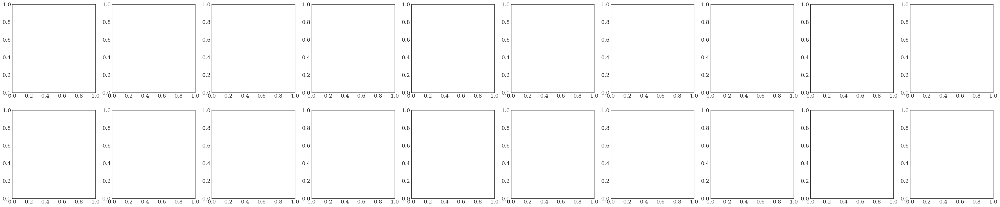

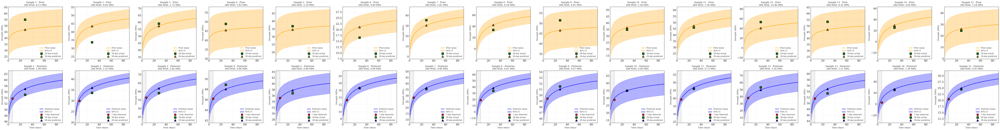


28-day Prediction Summary (15 samples):

Prior (without 7-day data):
  Mean MAE: 5.04 MPa
  Std MAE: 3.29 MPa
  Min MAE: 1.38 MPa
  Max MAE: 12.46 MPa
  R² Score: 0.766

Posterior (with 7-day data):
  Mean MAE: 1.52 MPa
  Std MAE: 1.28 MPa
  Min MAE: 0.00 MPa
  Max MAE: 4.61 MPa
  R² Score: 0.975

Improvement:
  Mean MAE reduction: 3.53 MPa
  R² improvement: 0.209

Actual vs Predicted 28-day values:
Sample   Actual     Prior      Posterior  Prior Err  Post Err  
----------------------------------------------------------
1        55.02      46.91      57.01      8.11       1.99      
2        33.68      43.53      36.00      9.85       2.32      
3        59.12      57.40      61.93      1.72       2.82      
4        48.90      45.48      48.04      3.42       0.86      
5        36.80      34.61      37.78      2.19       0.98      
6        16.60      21.09      16.69      4.49       0.09      
7        35.44      30.39      36.40      5.05       0.96      
8        33.83      42.37

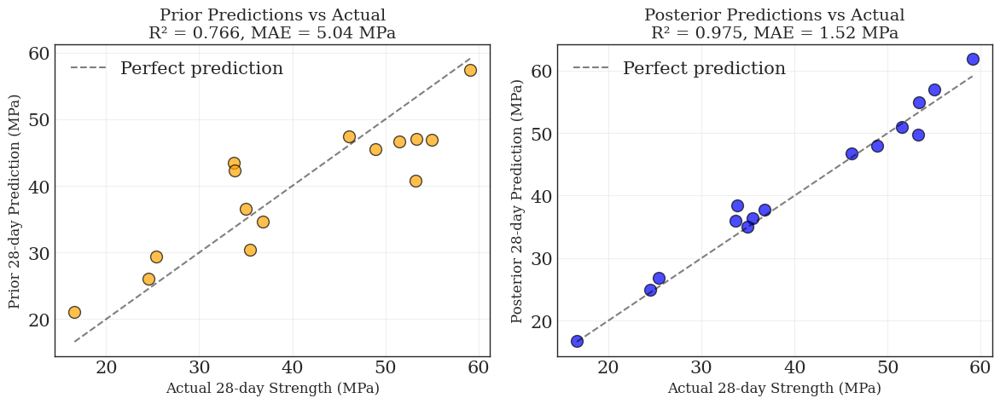

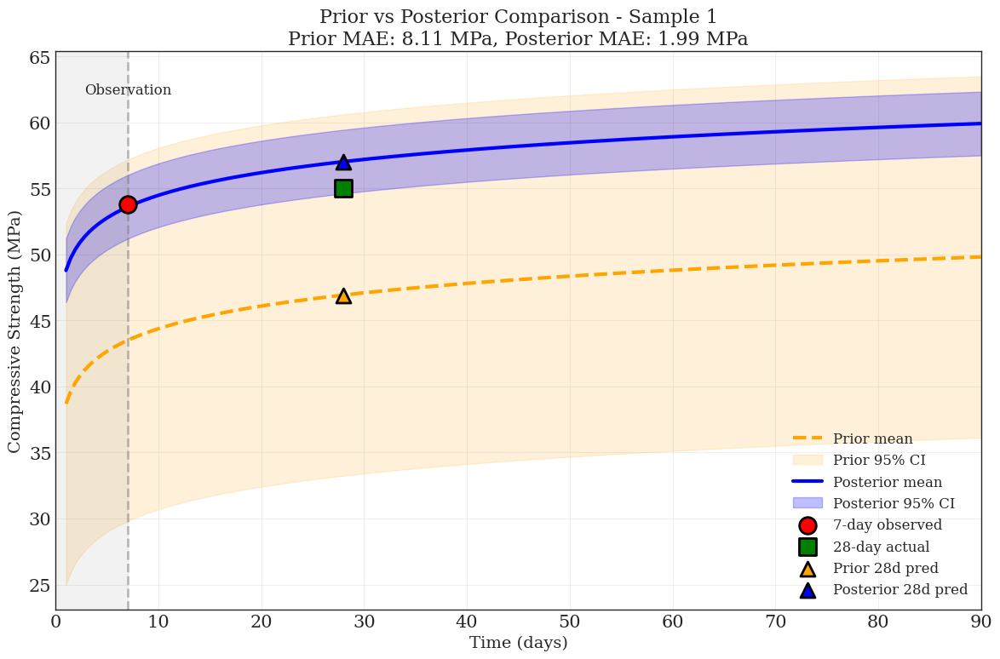

In [79]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_absolute_error

def predict_prior_trajectory(model, X_sample, t_pred, target_scaler, device='cpu'):
    """
    Predict prior strength trajectory (without observing any data).
    
    Args:
        model: trained AGPModelGP_v2
        X_sample: single sample features (1D array)
        t_pred: prediction time points (tensor)
        target_scaler: scaler to unscale predictions
        device: torch device
    
    Returns:
        times: prediction time points
        mean_pred: prior mean predictions (unscaled)
        std_pred: prior std predictions (unscaled)
    """
    model.eval()
    
    # Convert inputs to tensors
    X_tensor = torch.tensor(X_sample, dtype=torch.float32).unsqueeze(0).to(device)
    
    # Get GP parameters from the model
    with torch.no_grad():
        theta1, theta2, l, sigma_f, sigma_n = model(X_tensor)
    
    # Use the first (and only) sample
    theta1 = theta1[0]
    theta2 = theta2[0]
    sigma_f = sigma_f[0]
    sigma_n = sigma_n[0]
    
    # Calculate prior mean
    log_t = torch.log(t_pred + 1e-6)
    mean_pred = theta1 * log_t + theta2
    
    # Prior variance is just signal variance + noise variance
    var_pred = sigma_f**2 + sigma_n**2
    std_pred = torch.sqrt(var_pred)
    
    # Convert to numpy and unscale
    mean_pred_np = mean_pred.cpu().numpy()
    std_pred_np = std_pred.cpu().numpy() * torch.ones_like(mean_pred).cpu().numpy()
    
    # Unscale predictions
    mean_pred_unscaled = target_scaler.inverse_transform(mean_pred_np.reshape(-1, 1)).flatten()
    std_pred_unscaled = target_scaler.inverse_transform(std_pred_np.reshape(-1, 1)).flatten()
    
    return t_pred.cpu().numpy(), mean_pred_unscaled, std_pred_unscaled


def predict_posterior_trajectory(model, X_sample, y7_observed, t_train, t_pred, 
                                target_scaler, epsilon=1e-6):
    """
    Predict posterior strength trajectory after observing 7-day strength.
    
    Args:
        model: trained AGPModelGP_v2
        X_sample: single sample features (1D array)
        y7_observed: observed 7-day strength (scaled)
        t_train: training time points (tensor) - just [7.0]
        t_pred: prediction time points (tensor) - e.g., [1, 2, ..., 90]
        target_scaler: scaler to unscale predictions
        epsilon: small value for numerical stability
    
    Returns:
        times: prediction time points
        mean_pred: posterior mean predictions (unscaled)
        std_pred: posterior std predictions (unscaled)
    """
    device = next(model.parameters()).device
    model.eval()
    
    # Convert inputs to tensors
    X_tensor = torch.tensor(X_sample, dtype=torch.float32).unsqueeze(0).to(device)
    y_train = torch.tensor([y7_observed], dtype=torch.float32).to(device)
    
    # Get GP parameters from the model
    with torch.no_grad():
        theta1, theta2, l, sigma_f, sigma_n = model(X_tensor)
    
    # Use the first (and only) sample
    theta1 = theta1[0]
    theta2 = theta2[0]
    l = l[0]
    sigma_f = sigma_f[0]
    sigma_n = sigma_n[0]
    
    # Calculate posterior mean and variance
    mean_pred, var_pred = gp_posterior_mean_var(
        theta1, theta2, l, sigma_f, sigma_n,
        t_train, y_train, t_pred, epsilon
    )
    
    # Convert to numpy and unscale
    mean_pred_np = mean_pred.cpu().numpy()
    std_pred_np = torch.sqrt(var_pred).cpu().numpy()
    
    # Unscale predictions
    mean_pred_unscaled = target_scaler.inverse_transform(mean_pred_np.reshape(-1, 1)).flatten()
    std_pred_unscaled = target_scaler.inverse_transform(std_pred_np.reshape(-1, 1)).flatten()
    
    return t_pred.cpu().numpy(), mean_pred_unscaled, std_pred_unscaled


def plot_prior_posterior_comparison(model, X_test, y7_test, y28_test, 
                                   target_scaler, n_samples=5, device='cpu'):
    """
    Plot both prior and posterior strength trajectories for multiple test samples.
    """
    # Time points for prediction
    t_train = torch.tensor([7.0], dtype=torch.float32).to(device)
    t_pred = torch.linspace(1, 90, 200).to(device)
    
    # Create figure
    fig, axes = plt.subplots(2, n_samples, figsize=(5*n_samples, 10))
    if n_samples == 1:
        axes = axes.reshape(2, 1)
    
    # Storage for metrics
    prior_mae_list = []
    posterior_mae_list = []
    prior_28_preds = []
    posterior_28_preds = []
    actual_28_vals = []
    
    for i in range(n_samples):
        # Get prior predictions
        times, prior_mean, prior_std = predict_prior_trajectory(
            model, X_test[i], t_pred, target_scaler, device
        )
        
        # Get posterior predictions
        _, posterior_mean, posterior_std = predict_posterior_trajectory(
            model, X_test[i], y7_test[i], t_train, t_pred, 
            target_scaler, epsilon=1e-6
        )
        
        # Unscale actual values
        y7_actual = target_scaler.inverse_transform(np.array([y7_test[i]]).reshape(-1, 1)).flatten()[0]
        y28_actual = target_scaler.inverse_transform(np.array([y28_test[i]]).reshape(-1, 1)).flatten()[0]
        
        # Find 28-day predictions
        idx_28 = np.argmin(np.abs(times - 28))
        prior_28_pred = prior_mean[idx_28]
        posterior_28_pred = posterior_mean[idx_28]
        
        # Store for R² calculation
        prior_28_preds.append(prior_28_pred)
        posterior_28_preds.append(posterior_28_pred)
        actual_28_vals.append(y28_actual)
        
        # Calculate MAE
        prior_mae = np.abs(y28_actual - prior_28_pred)
        posterior_mae = np.abs(y28_actual - posterior_28_pred)
        prior_mae_list.append(prior_mae)
        posterior_mae_list.append(posterior_mae)
        
        # Top row: Prior predictions
        ax_top = axes[0, i]
        ax_top.plot(times, prior_mean, 'orange', linewidth=2, label='Prior mean')
        ax_top.fill_between(times, 
                           prior_mean - 2*prior_std, 
                           prior_mean + 2*prior_std, 
                           alpha=0.3, color='orange', label='95% CI')
        ax_top.scatter(28, y28_actual, s=100, c='green', marker='s', 
                      edgecolors='black', linewidth=2, label='28-day actual', zorder=5)
        ax_top.scatter(28, prior_28_pred, s=100, c='orange', marker='^', 
                      edgecolors='black', linewidth=2, label='28-day predicted', zorder=5)
        ax_top.set_title(f'Sample {i+1} - Prior\n28d MAE: {prior_mae:.2f} MPa', fontsize=12)
        ax_top.grid(True, alpha=0.3)
        ax_top.legend(fontsize=10)
        ax_top.set_xlim(0, 90)
        ax_top.set_ylabel('Strength (MPa)', fontsize=11)
        
        # Bottom row: Posterior predictions
        ax_bot = axes[1, i]
        ax_bot.plot(times, posterior_mean, 'b-', linewidth=2, label='Posterior mean')
        ax_bot.fill_between(times, 
                           posterior_mean - 2*posterior_std, 
                           posterior_mean + 2*posterior_std, 
                           alpha=0.3, color='blue', label='95% CI')
        ax_bot.scatter(7, y7_actual, s=100, c='red', marker='o', 
                      edgecolors='black', linewidth=2, label='7-day observed', zorder=5)
        ax_bot.scatter(28, y28_actual, s=100, c='green', marker='s', 
                      edgecolors='black', linewidth=2, label='28-day actual', zorder=5)
        ax_bot.scatter(28, posterior_28_pred, s=100, c='blue', marker='^', 
                      edgecolors='black', linewidth=2, label='28-day predicted', zorder=5)
        ax_bot.axvline(x=7, color='gray', linestyle='--', alpha=0.5)
        ax_bot.axvspan(0, 7, alpha=0.1, color='gray')
        ax_bot.set_title(f'Sample {i+1} - Posterior\n28d MAE: {posterior_mae:.2f} MPa', fontsize=12)
        ax_bot.grid(True, alpha=0.3)
        ax_bot.legend(fontsize=10)
        ax_bot.set_xlim(0, 90)
        ax_bot.set_xlabel('Time (days)', fontsize=11)
        ax_bot.set_ylabel('Strength (MPa)', fontsize=11)
    
    plt.tight_layout()
    plt.show()
    
    # Calculate R² scores
    prior_r2 = r2_score(actual_28_vals[:n_samples], prior_28_preds[:n_samples])
    posterior_r2 = r2_score(actual_28_vals[:n_samples], posterior_28_preds[:n_samples])
    
    # Print summary statistics
    print(f"\n28-day Prediction Summary ({n_samples} samples):")
    print(f"\nPrior (without 7-day data):")
    print(f"  Mean MAE: {np.mean(prior_mae_list):.2f} MPa")
    print(f"  Std MAE: {np.std(prior_mae_list):.2f} MPa")
    print(f"  Min MAE: {np.min(prior_mae_list):.2f} MPa")
    print(f"  Max MAE: {np.max(prior_mae_list):.2f} MPa")
    print(f"  R² Score: {prior_r2:.3f}")
    
    print(f"\nPosterior (with 7-day data):")
    print(f"  Mean MAE: {np.mean(posterior_mae_list):.2f} MPa")
    print(f"  Std MAE: {np.std(posterior_mae_list):.2f} MPa")
    print(f"  Min MAE: {np.min(posterior_mae_list):.2f} MPa")
    print(f"  Max MAE: {np.max(posterior_mae_list):.2f} MPa")
    print(f"  R² Score: {posterior_r2:.3f}")
    
    print(f"\nImprovement:")
    print(f"  Mean MAE reduction: {np.mean(prior_mae_list) - np.mean(posterior_mae_list):.2f} MPa")
    print(f"  R² improvement: {posterior_r2 - prior_r2:.3f}")
    
    # Print actual vs predicted values
    print(f"\nActual vs Predicted 28-day values:")
    print(f"{'Sample':<8} {'Actual':<10} {'Prior':<10} {'Posterior':<10} {'Prior Err':<10} {'Post Err':<10}")
    print("-" * 58)
    for i in range(n_samples):
        print(f"{i+1:<8} {actual_28_vals[i]:<10.2f} {prior_28_preds[i]:<10.2f} "
              f"{posterior_28_preds[i]:<10.2f} {prior_mae_list[i]:<10.2f} {posterior_mae_list[i]:<10.2f}")
    
    return fig, (prior_28_preds, posterior_28_preds, actual_28_vals)


def plot_predictions_scatter(prior_preds, posterior_preds, actual_vals, n_samples):
    """
    Create scatter plots of Prior vs Actual and Posterior vs Actual predictions.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    
    # Prior vs Actual
    ax1.scatter(actual_vals[:n_samples], prior_preds[:n_samples], 
                s=100, alpha=0.7, c='orange', edgecolors='black', linewidth=1)
    min_val = min(min(actual_vals[:n_samples]), min(prior_preds[:n_samples]))
    max_val = max(max(actual_vals[:n_samples]), max(prior_preds[:n_samples]))
    ax1.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='Perfect prediction')
    
    prior_r2 = r2_score(actual_vals[:n_samples], prior_preds[:n_samples])
    prior_mae = mean_absolute_error(actual_vals[:n_samples], prior_preds[:n_samples])
    
    ax1.set_xlabel('Actual 28-day Strength (MPa)', fontsize=12)
    ax1.set_ylabel('Prior 28-day Prediction (MPa)', fontsize=12)
    ax1.set_title(f'Prior Predictions vs Actual\nR² = {prior_r2:.3f}, MAE = {prior_mae:.2f} MPa', fontsize=14)
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    
    # Posterior vs Actual
    ax2.scatter(actual_vals[:n_samples], posterior_preds[:n_samples], 
                s=100, alpha=0.7, c='blue', edgecolors='black', linewidth=1)
    ax2.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='Perfect prediction')
    
    posterior_r2 = r2_score(actual_vals[:n_samples], posterior_preds[:n_samples])
    posterior_mae = mean_absolute_error(actual_vals[:n_samples], posterior_preds[:n_samples])
    
    ax2.set_xlabel('Actual 28-day Strength (MPa)', fontsize=12)
    ax2.set_ylabel('Posterior 28-day Prediction (MPa)', fontsize=12)
    ax2.set_title(f'Posterior Predictions vs Actual\nR² = {posterior_r2:.3f}, MAE = {posterior_mae:.2f} MPa', fontsize=14)
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    
    plt.tight_layout()
    plt.show()
    
    return fig


def plot_single_comparison(model, X_sample, y7_observed, y28_actual, 
                          target_scaler, sample_idx=0, device='cpu'):
    """
    Plot both prior and posterior trajectories on the same graph for a single sample.
    """
    # Time points
    t_train = torch.tensor([7.0], dtype=torch.float32).to(device)
    t_pred = torch.linspace(1, 90, 200).to(device)
    
    # Get prior predictions
    times, prior_mean, prior_std = predict_prior_trajectory(
        model, X_sample, t_pred, target_scaler, device
    )
    
    # Get posterior predictions
    _, posterior_mean, posterior_std = predict_posterior_trajectory(
        model, X_sample, y7_observed, t_train, t_pred, 
        target_scaler, epsilon=1e-6
    )
    
    # Unscale actual values
    y7_actual = target_scaler.inverse_transform(np.array([y7_observed]).reshape(-1, 1)).flatten()[0]
    y28_actual_unscaled = target_scaler.inverse_transform(np.array([y28_actual]).reshape(-1, 1)).flatten()[0]
    
    # Create plot
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Plot prior
    ax.plot(times, prior_mean, 'orange', linewidth=3, label='Prior mean', linestyle='--')
    ax.fill_between(times, 
                    prior_mean - 2*prior_std, 
                    prior_mean + 2*prior_std, 
                    alpha=0.15, color='orange', label='Prior 95% CI')
    
    # Plot posterior
    ax.plot(times, posterior_mean, 'b-', linewidth=3, label='Posterior mean')
    ax.fill_between(times, 
                    posterior_mean - 2*posterior_std, 
                    posterior_mean + 2*posterior_std, 
                    alpha=0.25, color='blue', label='Posterior 95% CI')
    
    # Plot observations
    ax.scatter(7, y7_actual, s=200, c='red', marker='o', 
              edgecolors='black', linewidth=2, label='7-day observed', zorder=5)
    ax.scatter(28, y28_actual_unscaled, s=200, c='green', marker='s', 
              edgecolors='black', linewidth=2, label='28-day actual', zorder=5)
    
    # Find 28-day predictions
    idx_28 = np.argmin(np.abs(times - 28))
    prior_28_pred = prior_mean[idx_28]
    posterior_28_pred = posterior_mean[idx_28]
    
    # Add prediction points
    ax.scatter(28, prior_28_pred, s=150, c='orange', marker='^', 
              edgecolors='black', linewidth=2, label='Prior 28d pred', zorder=5)
    ax.scatter(28, posterior_28_pred, s=150, c='blue', marker='^', 
              edgecolors='black', linewidth=2, label='Posterior 28d pred', zorder=5)
    
    # Calculate MAEs
    prior_mae = np.abs(y28_actual_unscaled - prior_28_pred)
    posterior_mae = np.abs(y28_actual_unscaled - posterior_28_pred)
    
    # Styling
    ax.set_xlabel('Time (days)', fontsize=14)
    ax.set_ylabel('Compressive Strength (MPa)', fontsize=14)
    ax.set_title(f'Prior vs Posterior Comparison - Sample {sample_idx+1}\n' + 
                f'Prior MAE: {prior_mae:.2f} MPa, Posterior MAE: {posterior_mae:.2f} MPa', 
                fontsize=16)
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=12, loc='lower right')
    ax.set_xlim(0, 90)
    
    # Add vertical line at observation time
    ax.axvline(x=7, color='gray', linestyle='--', alpha=0.5, linewidth=2)
    ax.text(7, ax.get_ylim()[1]*0.95, 'Observation', ha='center', fontsize=12)
    
    # Add shaded region for observed period
    ax.axvspan(0, 7, alpha=0.1, color='gray')
    
    plt.tight_layout()
    plt.show()
    
    return fig


# Example usage:
if __name__ == "__main__":
    # Assuming you have already trained your model and have test data
    
    # Plot comparison for multiple samples
    n_test_samples = min(15, len(X_test_scaled))
    fig_comparison, predictions = plot_prior_posterior_comparison(
        model, X_test_scaled, y7_test_scaled, y28_test_scaled, 
        target_scaler, n_samples=n_test_samples, device=device
    )
    
    # Create scatter plots
    prior_preds, posterior_preds, actual_vals = predictions
    fig_scatter = plot_predictions_scatter(prior_preds, posterior_preds, actual_vals, n_test_samples)
    
    # Plot a single sample comparison
    sample_idx = 0
    fig_single = plot_single_comparison(
        model, X_test_scaled[sample_idx], y7_test_scaled[sample_idx], 
        y28_test_scaled[sample_idx], target_scaler, 
        sample_idx=sample_idx, device=device
    )


28-day Prediction Summary (120 samples):

Prior (without 7-day data):
  Mean MAE: 4.47 MPa
  Std MAE: 3.85 MPa
  Min MAE: 0.05 MPa
  Max MAE: 21.74 MPa
  R² Score: 0.806

Posterior (with 7-day data):
  Mean MAE: 2.00 MPa
  Std MAE: 2.20 MPa
  Min MAE: 0.00 MPa
  Max MAE: 12.71 MPa
  R² Score: 0.951

Improvement:
  Mean MAE reduction: 2.46 MPa
  R² improvement: 0.145

Actual vs Predicted 28-day values:
Sample   Actual     Prior      Posterior  Prior Err  Post Err  
----------------------------------------------------------
1        55.02      46.91      57.01      8.11       1.99      
2        33.68      43.53      36.00      9.85       2.32      
3        59.12      57.40      61.93      1.72       2.82      
4        48.90      45.48      48.04      3.42       0.86      
5        36.80      34.61      37.78      2.19       0.98      
6        16.60      21.09      16.69      4.49       0.09      
7        35.44      30.39      36.40      5.05       0.96      
8        33.83      42.

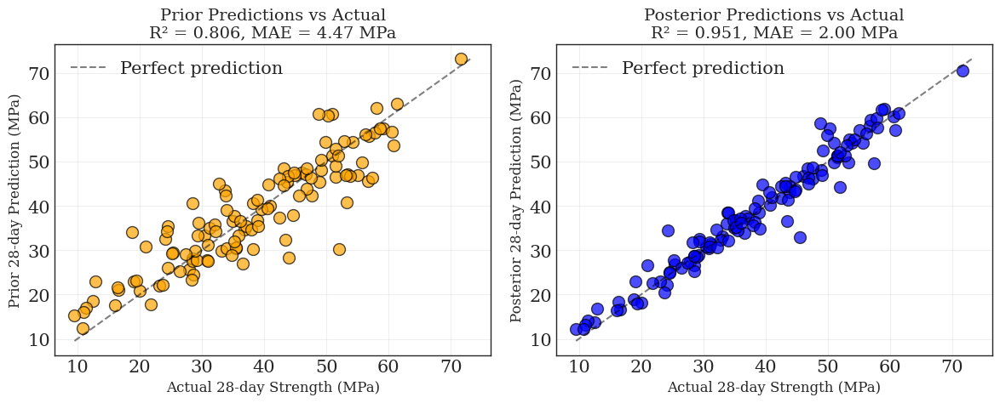

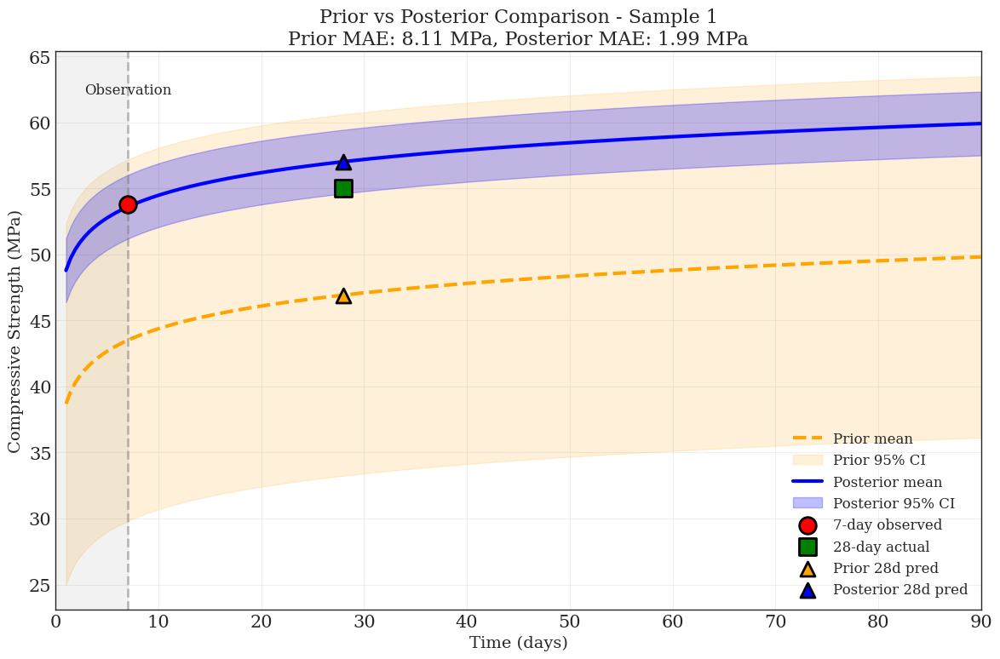

In [80]:
# Example usage:
if __name__ == "__main__":
    # Assuming you have already trained your model and have test data
    
    # Plot comparison for multiple samples
    n_test_samples = min(120, len(X_test_scaled))
    fig_comparison, predictions = plot_prior_posterior_comparison(
        model, X_test_scaled, y7_test_scaled, y28_test_scaled, 
        target_scaler, n_samples=n_test_samples, device=device
    )
    
    # Create scatter plots
    prior_preds, posterior_preds, actual_vals = predictions
    fig_scatter = plot_predictions_scatter(prior_preds, posterior_preds, actual_vals, n_test_samples)
    
    # Plot a single sample comparison
    sample_idx = 0
    fig_single = plot_single_comparison(
        model, X_test_scaled[sample_idx], y7_test_scaled[sample_idx], 
        y28_test_scaled[sample_idx], target_scaler, 
        sample_idx=sample_idx, device=device
    )

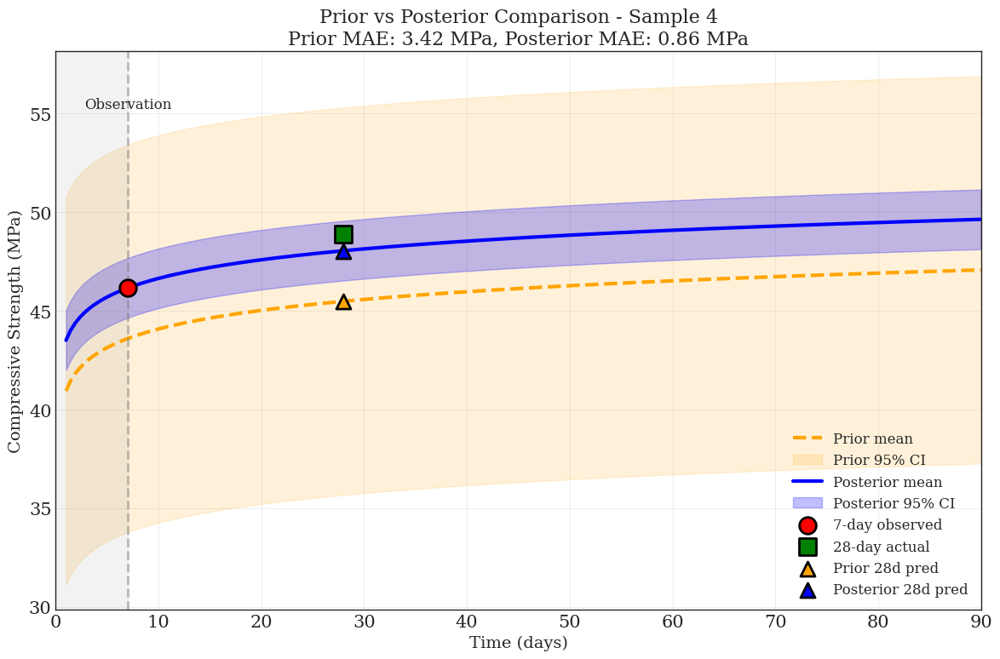

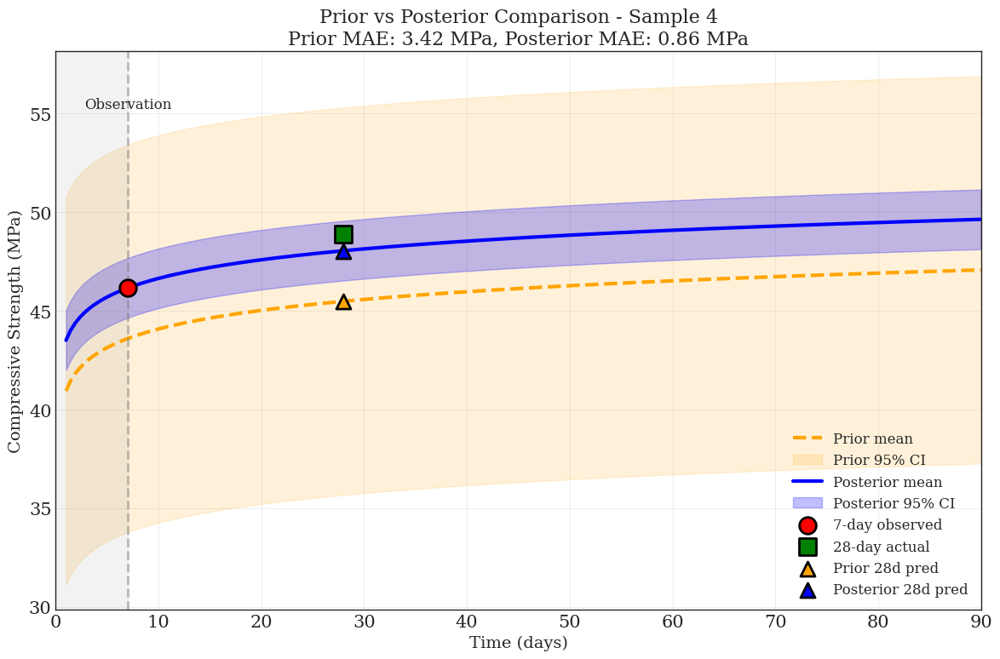

In [81]:
plot_single_comparison(
        model, X_test_scaled[3], y7_test_scaled[3], 
        y28_test_scaled[3], target_scaler, 
        sample_idx=3, device=device
    )

In [97]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_absolute_error


def enable_dropout(model):
    """Enable dropout layers during inference for uncertainty estimation."""
    for module in model.modules():
        if module.__class__.__name__.startswith('Dropout'):
            module.train()


def predict_prior_trajectory_new(model, X_sample, t_pred, target_scaler, device='cpu', n_dropout_samples=100):
    """
    Predict prior strength trajectory (without observing any data).
    
    Args:
        model: trained AGPModelGP_v2
        X_sample: single sample features (1D array)
        t_pred: prediction time points (tensor)
        target_scaler: scaler to unscale predictions
        device: torch device
        n_dropout_samples: number of dropout samples for uncertainty estimation
    
    Returns:
        times: prediction time points
        mean_pred: prior mean predictions (unscaled)
        std_pred: prior std predictions (unscaled) - includes all uncertainty sources
    """
    model.eval()  # Set to eval to avoid batch norm issues
    enable_dropout(model)  # But enable dropout for uncertainty
    
    # Convert inputs to tensors
    X_tensor = torch.tensor(X_sample, dtype=torch.float32).unsqueeze(0).to(device)
    
    # Collect multiple forward passes for dropout uncertainty
    all_means = []
    all_gp_vars = []
    all_noise_vars = []
    
    for _ in range(n_dropout_samples):
        with torch.no_grad():
            theta1, theta2, l, sigma_f, sigma_n = model(X_tensor)
        
        # Use the first (and only) sample
        theta1 = theta1[0]
        theta2 = theta2[0]
        sigma_f = sigma_f[0]
        sigma_n = sigma_n[0]
        
        # Calculate prior mean (just the mean function, no data conditioning)
        log_t = torch.log(t_pred + 1e-6)
        mean_pred = theta1 * log_t + theta2
        
        # For prior, the variance is just the kernel variance (no data to condition on)
        # K(t,t) = sigma_f^2 for each time point independently
        gp_var = sigma_f**2 * torch.ones_like(t_pred)
        noise_var = sigma_n**2
        
        all_means.append(mean_pred.cpu().numpy())
        all_gp_vars.append(gp_var.cpu().numpy())
        all_noise_vars.append(noise_var.cpu().numpy())
    
    # Calculate dropout uncertainty from variation in means
    all_means = np.array(all_means)
    mean_of_means = np.mean(all_means, axis=0)
    dropout_var = np.var(all_means, axis=0)
    
    # Average GP variance and noise variance across dropout samples
    mean_gp_var = np.mean(all_gp_vars, axis=0)
    mean_noise_var = np.mean(all_noise_vars)
    
    # Total variance = dropout_var + GP_latent_var + noise_var
    total_var = dropout_var + mean_gp_var + mean_noise_var
    total_std = np.sqrt(total_var)
    
    # Unscale predictions
    mean_pred_unscaled = target_scaler.inverse_transform(mean_of_means.reshape(-1, 1)).flatten()
    
    # For std, we need to handle the scaling properly
    # Since variance scales with the square of the scale factor
    scale_factor = target_scaler.max_val
    std_pred_unscaled = total_std * scale_factor
    
    return t_pred.cpu().numpy(), mean_pred_unscaled, std_pred_unscaled


def predict_posterior_trajectory_new(model, X_sample, y7_observed, t_train, t_pred, 
                                    target_scaler, epsilon=1e-6, n_dropout_samples=100):
    """
    Predict posterior strength trajectory after observing 7-day strength.
    
    Args:
        model: trained AGPModelGP_v2
        X_sample: single sample features (1D array)
        y7_observed: observed 7-day strength (scaled)
        t_train: training time points (tensor) - just [7.0]
        t_pred: prediction time points (tensor) - e.g., [1, 2, ..., 90]
        target_scaler: scaler to unscale predictions
        epsilon: small value for numerical stability
        n_dropout_samples: number of dropout samples for uncertainty estimation
    
    Returns:
        times: prediction time points
        mean_pred: posterior mean predictions (unscaled)
        std_pred: posterior std predictions (unscaled) - includes all uncertainty sources
    """
    device = next(model.parameters()).device
    model.eval()  # Set to eval to avoid batch norm issues
    enable_dropout(model)  # But enable dropout for uncertainty
    
    # Convert inputs to tensors
    X_tensor = torch.tensor(X_sample, dtype=torch.float32).unsqueeze(0).to(device)
    y_train = torch.tensor([y7_observed], dtype=torch.float32).to(device)
    
    # Collect multiple forward passes for dropout uncertainty
    all_means = []
    all_vars = []
    
    for _ in range(n_dropout_samples):
        with torch.no_grad():
            theta1, theta2, l, sigma_f, sigma_n = model(X_tensor)
        
        # Use the first (and only) sample
        theta1 = theta1[0]
        theta2 = theta2[0]
        l = l[0]
        sigma_f = sigma_f[0]
        sigma_n = sigma_n[0]
        
        # Calculate posterior mean and variance
        mean_pred, var_pred = gp_posterior_mean_var_new(
            theta1, theta2, l, sigma_f, sigma_n,
            t_train, y_train, t_pred, epsilon
        )
        
        all_means.append(mean_pred.cpu().numpy())
        all_vars.append(var_pred.cpu().numpy())
    
    # Calculate dropout uncertainty
    all_means = np.array(all_means)
    mean_of_means = np.mean(all_means, axis=0)
    dropout_var = np.var(all_means, axis=0)
    
    # Average GP posterior variance across dropout samples
    mean_gp_var = np.mean(all_vars, axis=0)
    
    # Total variance = dropout_var + GP_posterior_var (which already includes noise)
    total_var = dropout_var + mean_gp_var
    total_std = np.sqrt(total_var)
    
    # Unscale predictions
    mean_pred_unscaled = target_scaler.inverse_transform(mean_of_means.reshape(-1, 1)).flatten()
    
    # For std, handle scaling properly
    scale_factor = target_scaler.max_val
    std_pred_unscaled = total_std * scale_factor
    
    return t_pred.cpu().numpy(), mean_pred_unscaled, std_pred_unscaled


def plot_prior_posterior_comparison_new(model, X_test, y7_test, y28_test, 
                                       target_scaler, n_samples=5, device='cpu', n_dropout_samples=100):
    """
    Plot both prior and posterior strength trajectories for multiple test samples.
    """
    # Time points for prediction
    t_train = torch.tensor([7.0], dtype=torch.float32).to(device)
    t_pred = torch.linspace(1, 90, 200).to(device)
    
    # Create figure
    fig, axes = plt.subplots(2, n_samples, figsize=(5*n_samples, 10))
    if n_samples == 1:
        axes = axes.reshape(2, 1)
    
    # Storage for metrics
    prior_mae_list = []
    posterior_mae_list = []
    prior_28_preds = []
    posterior_28_preds = []
    actual_28_vals = []
    
    for i in range(n_samples):
        # Get prior predictions with total uncertainty
        times, prior_mean, prior_std = predict_prior_trajectory_new(
            model, X_test[i], t_pred, target_scaler, device, n_dropout_samples
        )
        
        # Get posterior predictions with total uncertainty
        _, posterior_mean, posterior_std = predict_posterior_trajectory_new(
            model, X_test[i], y7_test[i], t_train, t_pred, 
            target_scaler, epsilon=1e-6, n_dropout_samples=n_dropout_samples
        )
        
        # Unscale actual values
        y7_actual = target_scaler.inverse_transform(np.array([y7_test[i]]).reshape(-1, 1)).flatten()[0]
        y28_actual = target_scaler.inverse_transform(np.array([y28_test[i]]).reshape(-1, 1)).flatten()[0]
        
        # Find 28-day predictions
        idx_28 = np.argmin(np.abs(times - 28))
        prior_28_pred = prior_mean[idx_28]
        posterior_28_pred = posterior_mean[idx_28]
        
        # Store for R² calculation
        prior_28_preds.append(prior_28_pred)
        posterior_28_preds.append(posterior_28_pred)
        actual_28_vals.append(y28_actual)
        
        # Calculate MAE
        prior_mae = np.abs(y28_actual - prior_28_pred)
        posterior_mae = np.abs(y28_actual - posterior_28_pred)
        prior_mae_list.append(prior_mae)
        posterior_mae_list.append(posterior_mae)
        
        # Top row: Prior predictions
        ax_top = axes[0, i]
        ax_top.plot(times, prior_mean, 'orange', linewidth=2, label='Prior mean')
        ax_top.fill_between(times, 
                           prior_mean - 2*prior_std, 
                           prior_mean + 2*prior_std, 
                           alpha=0.3, color='orange', label='95% CI (Total Unc.)')
        ax_top.scatter(28, y28_actual, s=100, c='green', marker='s', 
                      edgecolors='black', linewidth=2, label='28-day actual', zorder=5)
        ax_top.scatter(28, prior_28_pred, s=100, c='orange', marker='^', 
                      edgecolors='black', linewidth=2, label='28-day predicted', zorder=5)
        ax_top.set_title(f'Sample {i+1} - Prior\n28d MAE: {prior_mae:.2f} MPa', fontsize=12)
        ax_top.grid(True, alpha=0.3)
        ax_top.legend(fontsize=10)
        ax_top.set_xlim(0, 90)
        ax_top.set_ylabel('Strength (MPa)', fontsize=11)
        
        # Bottom row: Posterior predictions
        ax_bot = axes[1, i]
        ax_bot.plot(times, posterior_mean, 'b-', linewidth=2, label='Posterior mean')
        ax_bot.fill_between(times, 
                           posterior_mean - 2*posterior_std, 
                           posterior_mean + 2*posterior_std, 
                           alpha=0.3, color='blue', label='95% CI (Total Unc.)')
        ax_bot.scatter(7, y7_actual, s=100, c='red', marker='o', 
                      edgecolors='black', linewidth=2, label='7-day observed', zorder=5)
        ax_bot.scatter(28, y28_actual, s=100, c='green', marker='s', 
                      edgecolors='black', linewidth=2, label='28-day actual', zorder=5)
        ax_bot.scatter(28, posterior_28_pred, s=100, c='blue', marker='^', 
                      edgecolors='black', linewidth=2, label='28-day predicted', zorder=5)
        ax_bot.axvline(x=7, color='gray', linestyle='--', alpha=0.5)
        ax_bot.axvspan(0, 7, alpha=0.1, color='gray')
        ax_bot.set_title(f'Sample {i+1} - Posterior\n28d MAE: {posterior_mae:.2f} MPa', fontsize=12)
        ax_bot.grid(True, alpha=0.3)
        ax_bot.legend(fontsize=10)
        ax_bot.set_xlim(0, 90)
        ax_bot.set_xlabel('Time (days)', fontsize=11)
        ax_bot.set_ylabel('Strength (MPa)', fontsize=11)
    
    plt.tight_layout()
    plt.show()
    
    # Calculate R² scores
    prior_r2 = r2_score(actual_28_vals[:n_samples], prior_28_preds[:n_samples])
    posterior_r2 = r2_score(actual_28_vals[:n_samples], posterior_28_preds[:n_samples])
    
    # Print summary statistics
    print(f"\n28-day Prediction Summary ({n_samples} samples):")
    print(f"\nPrior (without 7-day data):")
    print(f"  Mean MAE: {np.mean(prior_mae_list):.2f} MPa")
    print(f"  Std MAE: {np.std(prior_mae_list):.2f} MPa")
    print(f"  Min MAE: {np.min(prior_mae_list):.2f} MPa")
    print(f"  Max MAE: {np.max(prior_mae_list):.2f} MPa")
    print(f"  R² Score: {prior_r2:.3f}")
    
    print(f"\nPosterior (with 7-day data):")
    print(f"  Mean MAE: {np.mean(posterior_mae_list):.2f} MPa")
    print(f"  Std MAE: {np.std(posterior_mae_list):.2f} MPa")
    print(f"  Min MAE: {np.min(posterior_mae_list):.2f} MPa")
    print(f"  Max MAE: {np.max(posterior_mae_list):.2f} MPa")
    print(f"  R² Score: {posterior_r2:.3f}")
    
    print(f"\nImprovement:")
    print(f"  Mean MAE reduction: {np.mean(prior_mae_list) - np.mean(posterior_mae_list):.2f} MPa")
    print(f"  R² improvement: {posterior_r2 - prior_r2:.3f}")
    
    # Print actual vs predicted values
    print(f"\nActual vs Predicted 28-day values:")
    print(f"{'Sample':<8} {'Actual':<10} {'Prior':<10} {'Posterior':<10} {'Prior Err':<10} {'Post Err':<10}")
    print("-" * 58)
    for i in range(n_samples):
        print(f"{i+1:<8} {actual_28_vals[i]:<10.2f} {prior_28_preds[i]:<10.2f} "
              f"{posterior_28_preds[i]:<10.2f} {prior_mae_list[i]:<10.2f} {posterior_mae_list[i]:<10.2f}")
    
    return fig, (prior_28_preds, posterior_28_preds, actual_28_vals)


def plot_predictions_scatter_new(prior_preds, posterior_preds, actual_vals, n_samples):
    """
    Create scatter plots of Prior vs Actual and Posterior vs Actual predictions.
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    
    # Prior vs Actual
    ax1.scatter(actual_vals[:n_samples], prior_preds[:n_samples], 
                s=100, alpha=0.7, c='orange', edgecolors='black', linewidth=1)
    min_val = min(min(actual_vals[:n_samples]), min(prior_preds[:n_samples]))
    max_val = max(max(actual_vals[:n_samples]), max(prior_preds[:n_samples]))
    ax1.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='Perfect prediction')
    
    prior_r2 = r2_score(actual_vals[:n_samples], prior_preds[:n_samples])
    prior_mae = mean_absolute_error(actual_vals[:n_samples], prior_preds[:n_samples])
    
    ax1.set_xlabel('Actual 28-day Strength (MPa)', fontsize=12)
    ax1.set_ylabel('Prior 28-day Prediction (MPa)', fontsize=12)
    ax1.set_title(f'Prior Predictions vs Actual\nR² = {prior_r2:.3f}, MAE = {prior_mae:.2f} MPa', fontsize=14)
    ax1.grid(True, alpha=0.3)
    ax1.legend()
    
    # Posterior vs Actual
    ax2.scatter(actual_vals[:n_samples], posterior_preds[:n_samples], 
                s=100, alpha=0.7, c='blue', edgecolors='black', linewidth=1)
    ax2.plot([min_val, max_val], [min_val, max_val], 'k--', alpha=0.5, label='Perfect prediction')
    
    posterior_r2 = r2_score(actual_vals[:n_samples], posterior_preds[:n_samples])
    posterior_mae = mean_absolute_error(actual_vals[:n_samples], posterior_preds[:n_samples])
    
    ax2.set_xlabel('Actual 28-day Strength (MPa)', fontsize=12)
    ax2.set_ylabel('Posterior 28-day Prediction (MPa)', fontsize=12)
    ax2.set_title(f'Posterior Predictions vs Actual\nR² = {posterior_r2:.3f}, MAE = {posterior_mae:.2f} MPa', fontsize=14)
    ax2.grid(True, alpha=0.3)
    ax2.legend()
    
    plt.tight_layout()
    plt.show()
    
    return fig


def plot_single_comparison_new(model, X_sample, y7_observed, y28_actual, 
                              target_scaler, sample_idx=0, device='cpu', n_dropout_samples=100):
    """
    Plot both prior and posterior trajectories on the same graph for a single sample.
    Shows decomposition of uncertainty sources.
    """
    # Time points
    t_train = torch.tensor([7.0], dtype=torch.float32).to(device)
    t_pred = torch.linspace(1, 90, 200).to(device)
    
    # Get prior predictions with total uncertainty
    times, prior_mean, prior_std = predict_prior_trajectory_new(
        model, X_sample, t_pred, target_scaler, device, n_dropout_samples
    )
    
    # Get posterior predictions with total uncertainty
    _, posterior_mean, posterior_std = predict_posterior_trajectory_new(
        model, X_sample, y7_observed, t_train, t_pred, 
        target_scaler, epsilon=1e-6, n_dropout_samples=n_dropout_samples
    )
    
    # Unscale actual values
    y7_actual = target_scaler.inverse_transform(np.array([y7_observed]).reshape(-1, 1)).flatten()[0]
    y28_actual_unscaled = target_scaler.inverse_transform(np.array([y28_actual]).reshape(-1, 1)).flatten()[0]
    
    # Create plot
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Plot prior
    ax.plot(times, prior_mean, 'orange', linewidth=3, label='Prior mean', linestyle='--')
    ax.fill_between(times, 
                    prior_mean - 2*prior_std, 
                    prior_mean + 2*prior_std, 
                    alpha=0.15, color='orange', label='Prior 95% CI (Total)')
    
    # Plot posterior
    ax.plot(times, posterior_mean, 'b-', linewidth=3, label='Posterior mean')
    ax.fill_between(times, 
                    posterior_mean - 2*posterior_std, 
                    posterior_mean + 2*posterior_std, 
                    alpha=0.25, color='blue', label='Posterior 95% CI (Total)')
    
    # Plot observations
    ax.scatter(7, y7_actual, s=200, c='red', marker='o', 
              edgecolors='black', linewidth=2, label='7-day observed', zorder=5)
    ax.scatter(28, y28_actual_unscaled, s=200, c='green', marker='s', 
              edgecolors='black', linewidth=2, label='28-day actual', zorder=5)
    
    # Find 28-day predictions
    idx_28 = np.argmin(np.abs(times - 28))
    prior_28_pred = prior_mean[idx_28]
    posterior_28_pred = posterior_mean[idx_28]
    
    # Add prediction points
    ax.scatter(28, prior_28_pred, s=150, c='orange', marker='^', 
              edgecolors='black', linewidth=2, label='Prior 28d pred', zorder=5)
    ax.scatter(28, posterior_28_pred, s=150, c='blue', marker='^', 
              edgecolors='black', linewidth=2, label='Posterior 28d pred', zorder=5)
    
    # Calculate MAEs
    prior_mae = np.abs(y28_actual_unscaled - prior_28_pred)
    posterior_mae = np.abs(y28_actual_unscaled - posterior_28_pred)
    
    # Styling
    ax.set_xlabel('Time (days)', fontsize=14)
    ax.set_ylabel('Compressive Strength (MPa)', fontsize=14)
    ax.set_title(f'Prior vs Posterior Comparison - Sample {sample_idx+1}\n' + 
                f'Prior MAE: {prior_mae:.2f} MPa, Posterior MAE: {posterior_mae:.2f} MPa\n' +
                f'(Total Uncertainty = Dropout + GP + Noise)', 
                fontsize=16)
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=12, loc='lower right')
    ax.set_xlim(0, 90)
    
    # Add vertical line at observation time
    ax.axvline(x=7, color='gray', linestyle='--', alpha=0.5, linewidth=2)
    ax.text(7, ax.get_ylim()[1]*0.95, 'Observation', ha='center', fontsize=12)
    
    # Add shaded region for observed period
    ax.axvspan(0, 7, alpha=0.1, color='gray')
    
    plt.tight_layout()
    plt.show()
    
    return fig


def plot_uncertainty_decomposition_new(model, X_sample, y7_observed, target_scaler, sample_idx=0,
                                      device='cpu', n_dropout_samples=100):
    """
    Plot the decomposition of uncertainty sources over time for both prior and posterior.
    """
    # Time points
    t_train = torch.tensor([7.0], dtype=torch.float32).to(device)
    t_pred = torch.linspace(1, 90, 200).to(device)
    
    # Convert inputs
    X_tensor = torch.tensor(X_sample, dtype=torch.float32).unsqueeze(0).to(device)
    y_train = torch.tensor([y7_observed], dtype=torch.float32).to(device)
    
    model.eval()  # Set to eval mode
    enable_dropout(model)  # Enable dropout
    
    # Collect statistics for prior
    prior_means = []
    prior_gp_vars = []
    prior_noise_vars = []
    
    # Collect statistics for posterior
    posterior_means = []
    posterior_vars = []
    
    for _ in range(n_dropout_samples):
        with torch.no_grad():
            theta1, theta2, l, sigma_f, sigma_n = model(X_tensor)
        
        theta1 = theta1[0]
        theta2 = theta2[0]
        l = l[0]
        sigma_f = sigma_f[0]
        sigma_n = sigma_n[0]
        
        # Prior calculations
        log_t = torch.log(t_pred + 1e-6)
        prior_mean = theta1 * log_t + theta2
        prior_means.append(prior_mean.cpu().numpy())
        
        # For prior, variance is constant across time (before observing data)
        prior_gp_vars.append((sigma_f**2 * torch.ones_like(t_pred)).cpu().numpy())
        prior_noise_vars.append((sigma_n**2 * torch.ones_like(t_pred)).cpu().numpy())
        
        # Posterior calculations
        post_mean, post_var = gp_posterior_mean_var_new(
            theta1, theta2, l, sigma_f, sigma_n,
            t_train, y_train, t_pred, 1e-6
        )
        posterior_means.append(post_mean.cpu().numpy())
        posterior_vars.append(post_var.cpu().numpy())
    
    # Calculate variance components
    scale_factor = target_scaler.max_val
    
    # Prior variances
    prior_dropout_var = np.var(prior_means, axis=0) * scale_factor**2
    prior_gp_var = np.mean(prior_gp_vars, axis=0) * scale_factor**2
    prior_noise_var = np.mean(prior_noise_vars, axis=0) * scale_factor**2
    
    # Posterior variances
    posterior_dropout_var = np.var(posterior_means, axis=0) * scale_factor**2
    posterior_gp_total_var = np.mean(posterior_vars, axis=0) * scale_factor**2
    
    # Create figure
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))
    
    times = t_pred.cpu().numpy()
    
    # Prior uncertainty decomposition
    ax1.fill_between(times, 0, np.sqrt(prior_dropout_var), 
                     alpha=0.3, color='red', label='Dropout uncertainty')
    ax1.fill_between(times, np.sqrt(prior_dropout_var), 
                     np.sqrt(prior_dropout_var + prior_gp_var), 
                     alpha=0.3, color='blue', label='GP latent uncertainty')
    ax1.fill_between(times, np.sqrt(prior_dropout_var + prior_gp_var), 
                     np.sqrt(prior_dropout_var + prior_gp_var + prior_noise_var), 
                     alpha=0.3, color='green', label='Noise uncertainty')
    
    ax1.plot(times, np.sqrt(prior_dropout_var + prior_gp_var + prior_noise_var), 
             'k-', linewidth=2, label='Total uncertainty')
    ax1.set_title('Prior Uncertainty Decomposition (No Data Observed)', fontsize=14)
    ax1.set_xlabel('Time (days)', fontsize=12)
    ax1.set_ylabel('Standard Deviation (MPa)', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    ax1.set_xlim(0, 90)
    
    # Posterior uncertainty decomposition
    ax2.fill_between(times, 0, np.sqrt(posterior_dropout_var), 
                     alpha=0.3, color='red', label='Dropout uncertainty')
    ax2.fill_between(times, np.sqrt(posterior_dropout_var), 
                     np.sqrt(posterior_dropout_var + posterior_gp_total_var), 
                     alpha=0.3, color='purple', label='GP posterior uncertainty (includes noise)')
    
    ax2.plot(times, np.sqrt(posterior_dropout_var + posterior_gp_total_var), 
             'k-', linewidth=2, label='Total uncertainty')
    ax2.axvline(x=7, color='gray', linestyle='--', alpha=0.5, linewidth=2)
    ax2.text(7, ax2.get_ylim()[1]*0.9, 'Observation', ha='center', fontsize=10)
    ax2.set_title('Posterior Uncertainty Decomposition (After 7-day Observation)', fontsize=14)
    ax2.set_xlabel('Time (days)', fontsize=12)
    ax2.set_ylabel('Standard Deviation (MPa)', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    ax2.set_xlim(0, 90)
    
    # Add text to highlight key differences
    ax2.text(7.5, ax2.get_ylim()[0] + 0.1 * (ax2.get_ylim()[1] - ax2.get_ylim()[0]), 
             'Uncertainty reduced\nnear observation', 
             fontsize=10, ha='left', va='bottom',
             bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.3))
    
    plt.tight_layout()
    plt.show()
    
    return fig


def squared_exponential_kernel(t1, t2, l, sigma_f):
    """
    Compute squared exponential (RBF) kernel.
    K(t1, t2) = sigma_f^2 * exp(-0.5 * ||log(t1) - log(t2)||^2 / l^2)
    """
    log_t1 = torch.log(t1.reshape(-1, 1) + 1e-6)
    log_t2 = torch.log(t2.reshape(1, -1) + 1e-6)
    
    # Compute squared distances
    dist_sq = (log_t1 - log_t2) ** 2
    
    # Compute kernel
    K = sigma_f**2 * torch.exp(-0.5 * dist_sq / l**2)
    
    return K


def gp_posterior_mean_var_new(theta1, theta2, l, sigma_f, sigma_n, 
                             t_train, y_train, t_pred, epsilon):

    """
    Calculate GP posterior mean and variance after observing data.
    
    This implements the standard GP posterior formulas:
    - posterior_mean = prior_mean + K(t_pred, t_train) @ inv(K_train) @ (y_train - prior_mean_train)
    - posterior_var = K(t_pred, t_pred) - K(t_pred, t_train) @ inv(K_train) @ K(t_train, t_pred)
    """
    # Prior mean function
    log_t_train = torch.log(t_train + epsilon)
    log_t_pred = torch.log(t_pred + epsilon)
    
    prior_mean_train = theta1 * log_t_train + theta2
    prior_mean_pred = theta1 * log_t_pred + theta2
    
    # Compute kernel matrices
    K_train = squared_exponential_kernel(t_train, t_train, l, sigma_f)
    K_train = K_train + (sigma_n**2) * torch.eye(len(t_train), device=t_train.device)
    
    K_pred_train = squared_exponential_kernel(t_pred, t_train, l, sigma_f)
    K_train_pred = K_pred_train.T
    
    K_pred = squared_exponential_kernel(t_pred, t_pred, l, sigma_f)
    
    # Compute posterior mean
    # Use Cholesky decomposition for numerical stability
    try:
        L = torch.linalg.cholesky(K_train + epsilon * torch.eye(len(t_train), device=t_train.device))
        
        # Solve L @ L.T @ alpha = (y_train - prior_mean_train)
        alpha = torch.cholesky_solve((y_train - prior_mean_train).unsqueeze(-1), L).squeeze(-1)
        
        # Posterior mean = prior_mean + K_pred_train @ alpha
        posterior_mean = prior_mean_pred + K_pred_train @ alpha
        
        # Compute posterior variance
        # v = L^{-1} @ K_train_pred
        v = torch.triangular_solve(K_train_pred, L, upper=False)[0]
        
        # Posterior variance (diagonal only for efficiency)
        posterior_var_diag = torch.diag(K_pred) + sigma_n**2 - torch.sum(v**2, dim=0)
        
        # Ensure positive variance
        posterior_var_diag = torch.clamp(posterior_var_diag, min=epsilon)
        
    except RuntimeError:
        # If Cholesky fails, fall back to direct inversion
        K_train_inv = torch.linalg.inv(K_train + epsilon * torch.eye(len(t_train), device=t_train.device))
        
        # Posterior mean
        posterior_mean = prior_mean_pred + K_pred_train @ K_train_inv @ (y_train - prior_mean_train)
        
        # Posterior variance
        posterior_var_diag = torch.diag(K_pred) + sigma_n**2 - torch.diag(K_pred_train @ K_train_inv @ K_train_pred)
        posterior_var_diag = torch.clamp(posterior_var_diag, min=epsilon)
    
    return posterior_mean, posterior_var_diag

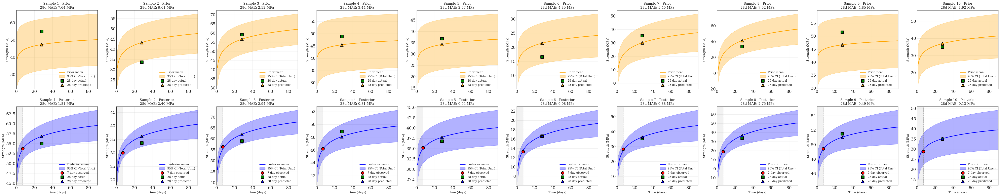


28-day Prediction Summary (10 samples):

Prior (without 7-day data):
  Mean MAE: 5.03 MPa
  Std MAE: 2.42 MPa
  Min MAE: 1.92 MPa
  Max MAE: 9.61 MPa
  R² Score: 0.789

Posterior (with 7-day data):
  Mean MAE: 1.32 MPa
  Std MAE: 1.02 MPa
  Min MAE: 0.08 MPa
  Max MAE: 2.94 MPa
  R² Score: 0.981

Improvement:
  Mean MAE reduction: 3.71 MPa
  R² improvement: 0.192

Actual vs Predicted 28-day values:
Sample   Actual     Prior      Posterior  Prior Err  Post Err  
----------------------------------------------------------
1        55.02      47.38      56.83      7.64       1.81      
2        33.68      43.29      36.08      9.61       2.40      
3        59.12      56.60      62.06      2.52       2.94      
4        48.90      45.46      48.09      3.44       0.81      
5        36.80      34.23      37.74      2.57       0.94      
6        16.60      21.45      16.68      4.85       0.08      
7        35.44      30.04      36.32      5.40       0.88      
8        33.83      41.35 

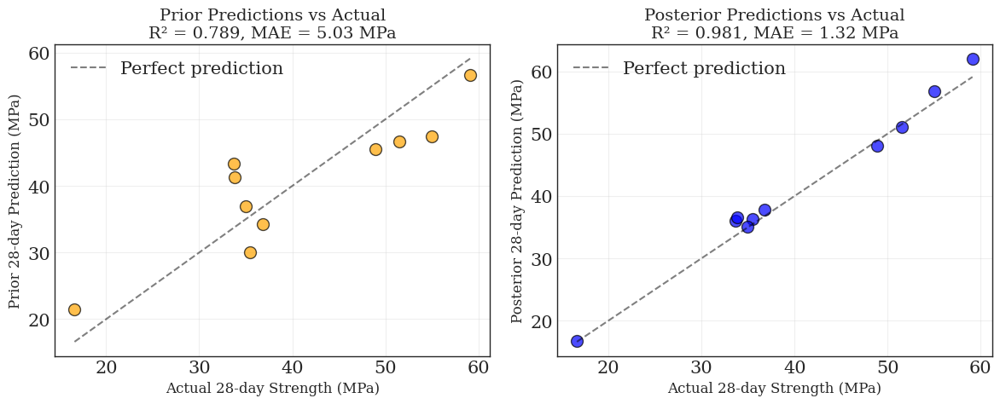

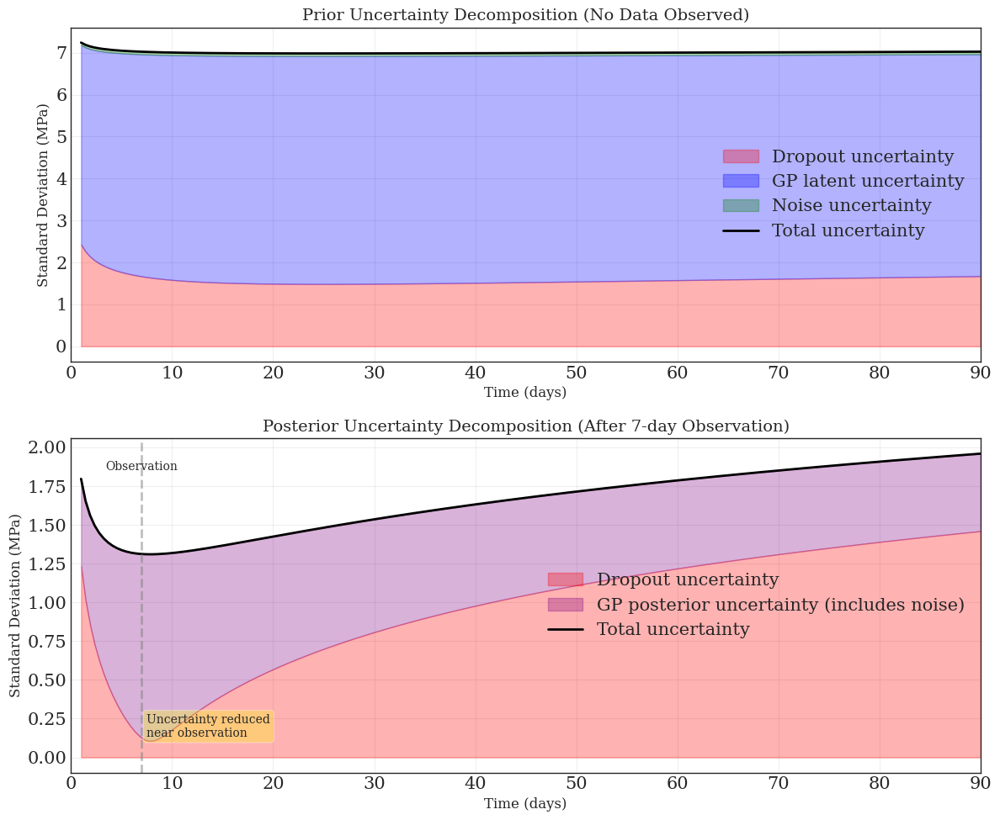

In [98]:

# Example usage:
if __name__ == "__main__":
    # Assuming you have already trained your model and have test data
    
    # Plot comparison for multiple samples
    n_test_samples = min(10, len(X_test_scaled))
    fig_comparison, predictions = plot_prior_posterior_comparison_new(
        model, X_test_scaled, y7_test_scaled, y28_test_scaled, 
        target_scaler, n_samples=n_test_samples, device=device
    )
    
    # Create scatter plots
    prior_preds, posterior_preds, actual_vals = predictions
    fig_scatter = plot_predictions_scatter_new(prior_preds, posterior_preds, actual_vals, n_test_samples)
    
    # Plot a single sample comparison
    sample_idx = 0
    fig_single = plot_uncertainty_decomposition_new(
        model=model,
        X_sample=X_test_scaled[sample_idx],
        y7_observed=y7_test_scaled[sample_idx],
        target_scaler=target_scaler,
        sample_idx=sample_idx, 
        device=device
    )


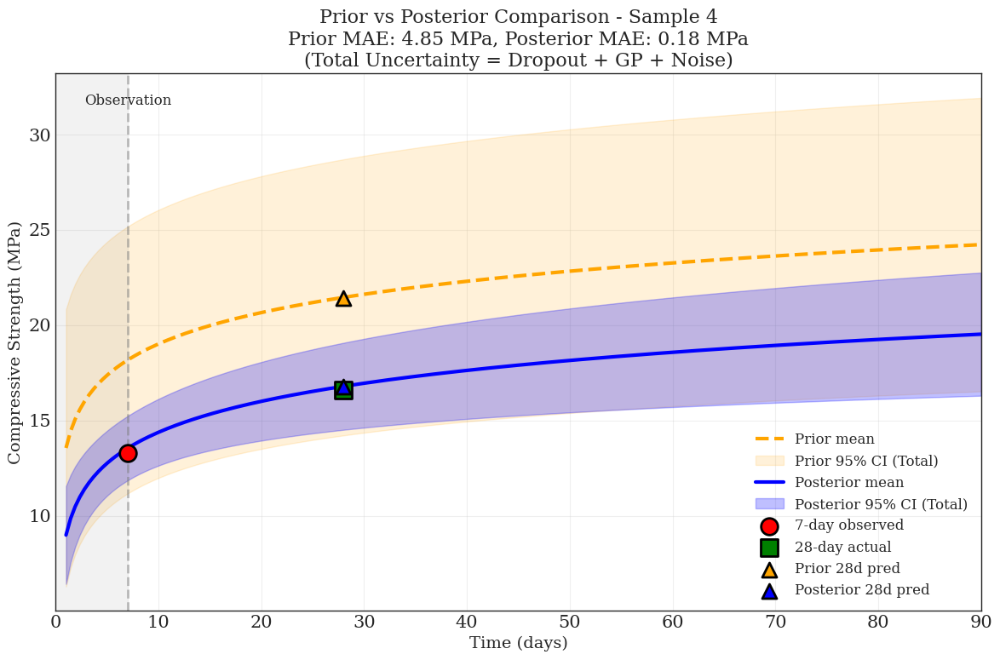

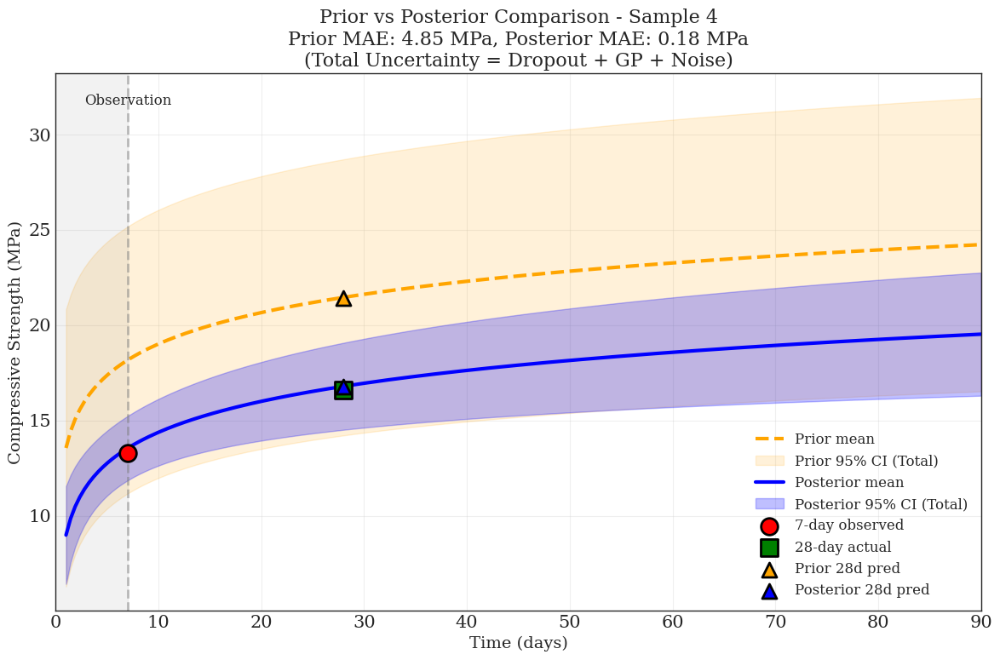

In [99]:
plot_single_comparison_new(
        model, X_test_scaled[5], y7_test_scaled[5], 
        y28_test_scaled[5], target_scaler, 
        sample_idx=3, device=device
    )